# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

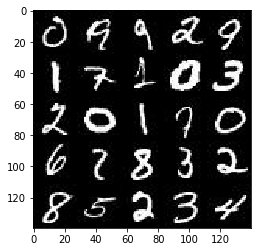

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

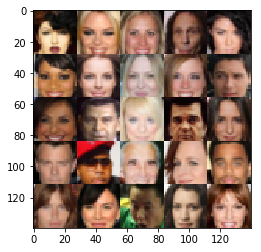

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [202]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='z_dim')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [219]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28*28*?
        #print(images.shape)
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        #print(x1.shape)
        x1 = tf.maximum(alpha * x1, x1)
        # 14*14*64
        
        x2 = tf.layers.conv2d(x1, 256, 5, strides=2, padding='same')
        #print(x2.shape)
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2)
        # 7*7*256
        
#         x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding='same')
#         #print(x3.shape)
#         x3 = tf.layers.batch_normalization(x3, training=True)
#         x3 = tf.maximum(alpha * x3, x3)
#         # 4*4*256

        # Flatten it
        flat = tf.reshape(x2, (-1, 7*7*256))
        #print(flat.shape)
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [220]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*256)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        #print(x1.shape)
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # now 7*7*256
        
#         x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=1, padding='valid')
#         #print(x2.shape)
#         x2 = tf.layers.batch_normalization(x2, training=is_train)
#         x2 = tf.maximum(alpha * x2, x2)
#         # 7*7*128 now
        
        x3 = tf.layers.conv2d_transpose(x1, 64, 5, strides=2, padding='same')
        #print(x3.shape)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14*14*64 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        #print(logits.shape)
        # 28*28*? now
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [221]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [222]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [223]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [224]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    image_count, image_width, image_height, image_channels = data_shape
    input_real, input_z, tf_lr = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, tf_lr, beta1)
    
    print_every = 10
    show_every = 100
    steps = 0
    total_batches = int(image_count/batch_size)+1
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            batch_i = 0
            for batch_images in get_batches(batch_size):
                #print(batch_images.shape) # => (128, 28, 28, 1)
                steps += 1
                batch_i += 1
                # TODO: Train Model
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_z: batch_z, input_real: batch_images, tf_lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, tf_lr: learning_rate})
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {:>2}/{} Batch {:>4}/{}...".format(epoch_i+1, epoch_count, batch_i, total_batches),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                if steps % show_every == 0:
                    show_generator_output(sess, show_n_images, input_z, image_channels, data_image_mode)
        # final show
        show_generator_output(sess, show_n_images, input_z, image_channels, data_image_mode)
                

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

In [225]:
# mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
# print(mnist_dataset.shape) # => (60000, 28, 28, 1)
# print(mnist_dataset.image_mode) # => L

Epoch  1/2 Batch   10/469... Discriminator Loss: 8.5929... Generator Loss: 0.5849
Epoch  1/2 Batch   20/469... Discriminator Loss: 0.3658... Generator Loss: 3.3214
Epoch  1/2 Batch   30/469... Discriminator Loss: 6.1468... Generator Loss: 0.0492
Epoch  1/2 Batch   40/469... Discriminator Loss: 0.6277... Generator Loss: 2.0318
Epoch  1/2 Batch   50/469... Discriminator Loss: 2.6176... Generator Loss: 6.9106
Epoch  1/2 Batch   60/469... Discriminator Loss: 0.6704... Generator Loss: 3.0671
Epoch  1/2 Batch   70/469... Discriminator Loss: 0.2353... Generator Loss: 3.7157
Epoch  1/2 Batch   80/469... Discriminator Loss: 0.1221... Generator Loss: 3.1437
Epoch  1/2 Batch   90/469... Discriminator Loss: 0.1228... Generator Loss: 2.7797
Epoch  1/2 Batch  100/469... Discriminator Loss: 0.8252... Generator Loss: 0.8013


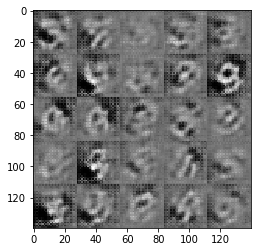

Epoch  1/2 Batch  110/469... Discriminator Loss: 3.4432... Generator Loss: 0.0990
Epoch  1/2 Batch  120/469... Discriminator Loss: 1.4417... Generator Loss: 0.4343
Epoch  1/2 Batch  130/469... Discriminator Loss: 0.6258... Generator Loss: 5.4060
Epoch  1/2 Batch  140/469... Discriminator Loss: 1.1804... Generator Loss: 5.3933
Epoch  1/2 Batch  150/469... Discriminator Loss: 1.8064... Generator Loss: 7.7730
Epoch  1/2 Batch  160/469... Discriminator Loss: 0.1071... Generator Loss: 5.0246
Epoch  1/2 Batch  170/469... Discriminator Loss: 0.2389... Generator Loss: 4.4654
Epoch  1/2 Batch  180/469... Discriminator Loss: 0.1797... Generator Loss: 4.2574
Epoch  1/2 Batch  190/469... Discriminator Loss: 0.1545... Generator Loss: 3.7126
Epoch  1/2 Batch  200/469... Discriminator Loss: 1.1187... Generator Loss: 1.2844


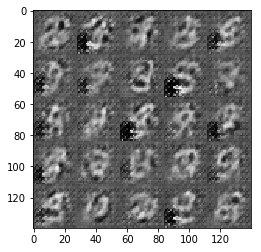

Epoch  1/2 Batch  210/469... Discriminator Loss: 1.1020... Generator Loss: 3.9345
Epoch  1/2 Batch  220/469... Discriminator Loss: 0.8305... Generator Loss: 1.0736
Epoch  1/2 Batch  230/469... Discriminator Loss: 1.0111... Generator Loss: 2.9242
Epoch  1/2 Batch  240/469... Discriminator Loss: 0.8744... Generator Loss: 1.1520
Epoch  1/2 Batch  250/469... Discriminator Loss: 1.1409... Generator Loss: 4.7553
Epoch  1/2 Batch  260/469... Discriminator Loss: 0.5528... Generator Loss: 2.6395
Epoch  1/2 Batch  270/469... Discriminator Loss: 1.5083... Generator Loss: 0.4426
Epoch  1/2 Batch  280/469... Discriminator Loss: 0.5942... Generator Loss: 2.0435
Epoch  1/2 Batch  290/469... Discriminator Loss: 0.8457... Generator Loss: 1.9918
Epoch  1/2 Batch  300/469... Discriminator Loss: 0.8518... Generator Loss: 0.8441


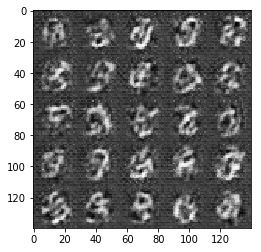

Epoch  1/2 Batch  310/469... Discriminator Loss: 0.5537... Generator Loss: 2.2694
Epoch  1/2 Batch  320/469... Discriminator Loss: 0.4213... Generator Loss: 2.4824
Epoch  1/2 Batch  330/469... Discriminator Loss: 1.2043... Generator Loss: 0.4693
Epoch  1/2 Batch  340/469... Discriminator Loss: 0.5925... Generator Loss: 1.0819
Epoch  1/2 Batch  350/469... Discriminator Loss: 3.7171... Generator Loss: 0.0628
Epoch  1/2 Batch  360/469... Discriminator Loss: 0.8511... Generator Loss: 0.9785
Epoch  1/2 Batch  370/469... Discriminator Loss: 0.4531... Generator Loss: 2.5551
Epoch  1/2 Batch  380/469... Discriminator Loss: 0.3613... Generator Loss: 1.8179
Epoch  1/2 Batch  390/469... Discriminator Loss: 0.5280... Generator Loss: 1.4455
Epoch  1/2 Batch  400/469... Discriminator Loss: 0.7917... Generator Loss: 0.7605


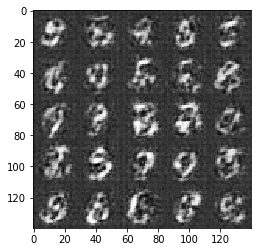

Epoch  1/2 Batch  410/469... Discriminator Loss: 2.3727... Generator Loss: 0.1784
Epoch  1/2 Batch  420/469... Discriminator Loss: 0.1228... Generator Loss: 3.0682
Epoch  1/2 Batch  430/469... Discriminator Loss: 2.1249... Generator Loss: 0.1876
Epoch  1/2 Batch  440/469... Discriminator Loss: 0.4203... Generator Loss: 1.3994
Epoch  1/2 Batch  450/469... Discriminator Loss: 1.0580... Generator Loss: 0.5849
Epoch  1/2 Batch  460/469... Discriminator Loss: 0.2167... Generator Loss: 2.4061
Epoch  2/2 Batch    2/469... Discriminator Loss: 0.1310... Generator Loss: 2.9959
Epoch  2/2 Batch   12/469... Discriminator Loss: 0.1955... Generator Loss: 2.1429
Epoch  2/2 Batch   22/469... Discriminator Loss: 1.0287... Generator Loss: 5.4971
Epoch  2/2 Batch   32/469... Discriminator Loss: 0.5562... Generator Loss: 1.1538


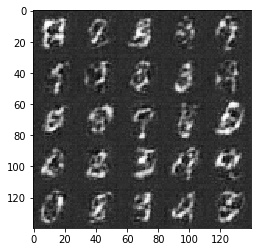

Epoch  2/2 Batch   42/469... Discriminator Loss: 0.5747... Generator Loss: 1.1693
Epoch  2/2 Batch   52/469... Discriminator Loss: 0.2870... Generator Loss: 2.4210
Epoch  2/2 Batch   62/469... Discriminator Loss: 0.2252... Generator Loss: 2.3610
Epoch  2/2 Batch   72/469... Discriminator Loss: 0.1814... Generator Loss: 3.0147
Epoch  2/2 Batch   82/469... Discriminator Loss: 0.1368... Generator Loss: 2.7805
Epoch  2/2 Batch   92/469... Discriminator Loss: 0.1586... Generator Loss: 2.6264
Epoch  2/2 Batch  102/469... Discriminator Loss: 0.1238... Generator Loss: 3.2263
Epoch  2/2 Batch  112/469... Discriminator Loss: 0.0723... Generator Loss: 3.8006
Epoch  2/2 Batch  122/469... Discriminator Loss: 0.4937... Generator Loss: 4.9834
Epoch  2/2 Batch  132/469... Discriminator Loss: 0.5329... Generator Loss: 1.4532


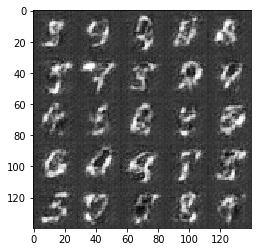

Epoch  2/2 Batch  142/469... Discriminator Loss: 1.2976... Generator Loss: 0.7672
Epoch  2/2 Batch  152/469... Discriminator Loss: 0.4248... Generator Loss: 2.1029
Epoch  2/2 Batch  162/469... Discriminator Loss: 0.3554... Generator Loss: 1.6209
Epoch  2/2 Batch  172/469... Discriminator Loss: 0.2499... Generator Loss: 2.0900
Epoch  2/2 Batch  182/469... Discriminator Loss: 0.2186... Generator Loss: 2.3867
Epoch  2/2 Batch  192/469... Discriminator Loss: 0.2678... Generator Loss: 2.0116
Epoch  2/2 Batch  202/469... Discriminator Loss: 0.2033... Generator Loss: 2.7920
Epoch  2/2 Batch  212/469... Discriminator Loss: 0.1637... Generator Loss: 2.6328
Epoch  2/2 Batch  222/469... Discriminator Loss: 0.1439... Generator Loss: 2.6231
Epoch  2/2 Batch  232/469... Discriminator Loss: 0.1483... Generator Loss: 2.5971


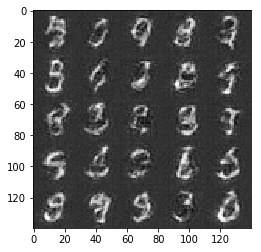

Epoch  2/2 Batch  242/469... Discriminator Loss: 0.1918... Generator Loss: 2.1754
Epoch  2/2 Batch  252/469... Discriminator Loss: 0.1392... Generator Loss: 3.0990
Epoch  2/2 Batch  262/469... Discriminator Loss: 0.1445... Generator Loss: 2.5714
Epoch  2/2 Batch  272/469... Discriminator Loss: 1.6170... Generator Loss: 2.3008
Epoch  2/2 Batch  282/469... Discriminator Loss: 1.9689... Generator Loss: 5.1268
Epoch  2/2 Batch  292/469... Discriminator Loss: 0.6605... Generator Loss: 1.2792
Epoch  2/2 Batch  302/469... Discriminator Loss: 1.0842... Generator Loss: 0.6482
Epoch  2/2 Batch  312/469... Discriminator Loss: 0.7603... Generator Loss: 0.8563
Epoch  2/2 Batch  322/469... Discriminator Loss: 0.4169... Generator Loss: 1.6791
Epoch  2/2 Batch  332/469... Discriminator Loss: 0.2775... Generator Loss: 2.0030


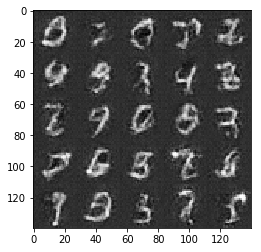

Epoch  2/2 Batch  342/469... Discriminator Loss: 0.2603... Generator Loss: 2.0885
Epoch  2/2 Batch  352/469... Discriminator Loss: 0.2569... Generator Loss: 2.0814
Epoch  2/2 Batch  362/469... Discriminator Loss: 0.2161... Generator Loss: 2.3699
Epoch  2/2 Batch  372/469... Discriminator Loss: 0.1312... Generator Loss: 2.8338
Epoch  2/2 Batch  382/469... Discriminator Loss: 0.1164... Generator Loss: 3.1886
Epoch  2/2 Batch  392/469... Discriminator Loss: 0.1716... Generator Loss: 2.3939
Epoch  2/2 Batch  402/469... Discriminator Loss: 0.1830... Generator Loss: 2.5341
Epoch  2/2 Batch  412/469... Discriminator Loss: 0.1588... Generator Loss: 2.6110
Epoch  2/2 Batch  422/469... Discriminator Loss: 0.1067... Generator Loss: 3.2803
Epoch  2/2 Batch  432/469... Discriminator Loss: 0.0821... Generator Loss: 3.6532


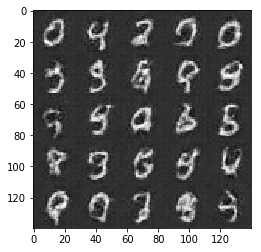

Epoch  2/2 Batch  442/469... Discriminator Loss: 0.1001... Generator Loss: 3.5203
Epoch  2/2 Batch  452/469... Discriminator Loss: 1.1622... Generator Loss: 3.5862
Epoch  2/2 Batch  462/469... Discriminator Loss: 2.8575... Generator Loss: 7.6113


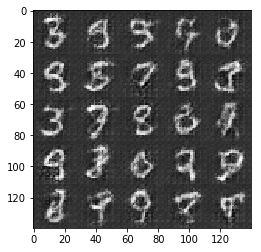

In [227]:
batch_size = 128
z_dim = 90
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

In [212]:
# celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
# print(celeba_dataset.shape) # => (202599, 28, 28, 3)
# print(celeba_dataset.image_mode) # => RGB

Epoch  1/5 Batch   10/3166... Discriminator Loss: 0.3102... Generator Loss: 3.2074
Epoch  1/5 Batch   20/3166... Discriminator Loss: 5.6237... Generator Loss: 0.2373
Epoch  1/5 Batch   30/3166... Discriminator Loss: 0.3167... Generator Loss: 13.3016
Epoch  1/5 Batch   40/3166... Discriminator Loss: 0.2502... Generator Loss: 3.8342
Epoch  1/5 Batch   50/3166... Discriminator Loss: 0.8028... Generator Loss: 0.9192
Epoch  1/5 Batch   60/3166... Discriminator Loss: 0.2187... Generator Loss: 2.8552
Epoch  1/5 Batch   70/3166... Discriminator Loss: 1.2090... Generator Loss: 0.5221
Epoch  1/5 Batch   80/3166... Discriminator Loss: 0.2594... Generator Loss: 9.1774
Epoch  1/5 Batch   90/3166... Discriminator Loss: 0.6313... Generator Loss: 0.9891
Epoch  1/5 Batch  100/3166... Discriminator Loss: 0.6758... Generator Loss: 8.8822


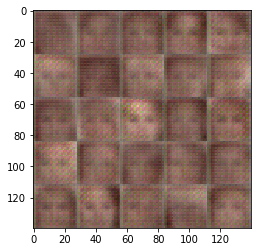

Epoch  1/5 Batch  110/3166... Discriminator Loss: 0.8531... Generator Loss: 0.7821
Epoch  1/5 Batch  120/3166... Discriminator Loss: 1.8129... Generator Loss: 0.2775
Epoch  1/5 Batch  130/3166... Discriminator Loss: 1.6992... Generator Loss: 0.2526
Epoch  1/5 Batch  140/3166... Discriminator Loss: 0.3530... Generator Loss: 5.6309
Epoch  1/5 Batch  150/3166... Discriminator Loss: 0.1150... Generator Loss: 6.5006
Epoch  1/5 Batch  160/3166... Discriminator Loss: 0.2934... Generator Loss: 1.9743
Epoch  1/5 Batch  170/3166... Discriminator Loss: 0.1009... Generator Loss: 4.1225
Epoch  1/5 Batch  180/3166... Discriminator Loss: 2.3695... Generator Loss: 0.1160
Epoch  1/5 Batch  190/3166... Discriminator Loss: 0.1748... Generator Loss: 2.8530
Epoch  1/5 Batch  200/3166... Discriminator Loss: 0.1733... Generator Loss: 2.8576


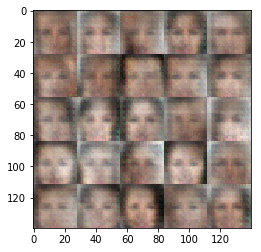

Epoch  1/5 Batch  210/3166... Discriminator Loss: 0.6192... Generator Loss: 1.0515
Epoch  1/5 Batch  220/3166... Discriminator Loss: 0.0842... Generator Loss: 4.5869
Epoch  1/5 Batch  230/3166... Discriminator Loss: 0.2755... Generator Loss: 2.5110
Epoch  1/5 Batch  240/3166... Discriminator Loss: 0.1926... Generator Loss: 5.3017
Epoch  1/5 Batch  250/3166... Discriminator Loss: 0.2211... Generator Loss: 2.8155
Epoch  1/5 Batch  260/3166... Discriminator Loss: 1.5023... Generator Loss: 0.3546
Epoch  1/5 Batch  270/3166... Discriminator Loss: 0.3131... Generator Loss: 2.1330
Epoch  1/5 Batch  280/3166... Discriminator Loss: 0.3084... Generator Loss: 2.6051
Epoch  1/5 Batch  290/3166... Discriminator Loss: 0.1641... Generator Loss: 4.1145
Epoch  1/5 Batch  300/3166... Discriminator Loss: 1.4274... Generator Loss: 8.6474


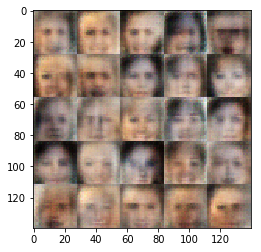

Epoch  1/5 Batch  310/3166... Discriminator Loss: 0.1521... Generator Loss: 3.5612
Epoch  1/5 Batch  320/3166... Discriminator Loss: 1.4543... Generator Loss: 0.3955
Epoch  1/5 Batch  330/3166... Discriminator Loss: 0.3572... Generator Loss: 8.8821
Epoch  1/5 Batch  340/3166... Discriminator Loss: 0.2004... Generator Loss: 2.5864
Epoch  1/5 Batch  350/3166... Discriminator Loss: 0.3010... Generator Loss: 2.3100
Epoch  1/5 Batch  360/3166... Discriminator Loss: 0.6695... Generator Loss: 1.1725
Epoch  1/5 Batch  370/3166... Discriminator Loss: 0.1273... Generator Loss: 3.5492
Epoch  1/5 Batch  380/3166... Discriminator Loss: 0.0878... Generator Loss: 6.7740
Epoch  1/5 Batch  390/3166... Discriminator Loss: 0.2903... Generator Loss: 5.2892
Epoch  1/5 Batch  400/3166... Discriminator Loss: 0.8862... Generator Loss: 1.6445


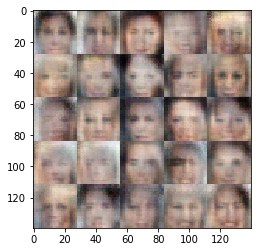

Epoch  1/5 Batch  410/3166... Discriminator Loss: 0.5249... Generator Loss: 6.6362
Epoch  1/5 Batch  420/3166... Discriminator Loss: 1.2290... Generator Loss: 0.5339
Epoch  1/5 Batch  430/3166... Discriminator Loss: 0.2649... Generator Loss: 6.8795
Epoch  1/5 Batch  440/3166... Discriminator Loss: 0.2143... Generator Loss: 6.4961
Epoch  1/5 Batch  450/3166... Discriminator Loss: 0.1740... Generator Loss: 7.2991
Epoch  1/5 Batch  460/3166... Discriminator Loss: 0.2406... Generator Loss: 2.8800
Epoch  1/5 Batch  470/3166... Discriminator Loss: 0.8326... Generator Loss: 0.8172
Epoch  1/5 Batch  480/3166... Discriminator Loss: 4.3370... Generator Loss: 2.4448
Epoch  1/5 Batch  490/3166... Discriminator Loss: 1.1215... Generator Loss: 1.5680
Epoch  1/5 Batch  500/3166... Discriminator Loss: 0.7643... Generator Loss: 1.6494


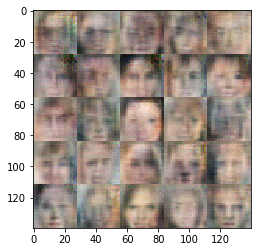

Epoch  1/5 Batch  510/3166... Discriminator Loss: 1.4988... Generator Loss: 0.7206
Epoch  1/5 Batch  520/3166... Discriminator Loss: 0.6177... Generator Loss: 1.7514
Epoch  1/5 Batch  530/3166... Discriminator Loss: 1.6236... Generator Loss: 2.2372
Epoch  1/5 Batch  540/3166... Discriminator Loss: 0.3944... Generator Loss: 2.5380
Epoch  1/5 Batch  550/3166... Discriminator Loss: 1.0700... Generator Loss: 0.8585
Epoch  1/5 Batch  560/3166... Discriminator Loss: 2.2392... Generator Loss: 0.1897
Epoch  1/5 Batch  570/3166... Discriminator Loss: 0.3488... Generator Loss: 4.2978
Epoch  1/5 Batch  580/3166... Discriminator Loss: 0.2025... Generator Loss: 3.5593
Epoch  1/5 Batch  590/3166... Discriminator Loss: 0.1665... Generator Loss: 4.8634
Epoch  1/5 Batch  600/3166... Discriminator Loss: 0.2524... Generator Loss: 4.5957


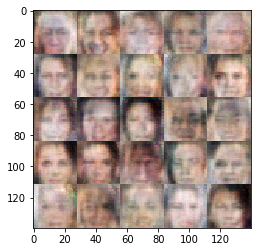

Epoch  1/5 Batch  610/3166... Discriminator Loss: 0.4164... Generator Loss: 2.9503
Epoch  1/5 Batch  620/3166... Discriminator Loss: 0.4428... Generator Loss: 1.5454
Epoch  1/5 Batch  630/3166... Discriminator Loss: 0.6595... Generator Loss: 1.5575
Epoch  1/5 Batch  640/3166... Discriminator Loss: 0.3864... Generator Loss: 2.3137
Epoch  1/5 Batch  650/3166... Discriminator Loss: 0.8668... Generator Loss: 5.9272
Epoch  1/5 Batch  660/3166... Discriminator Loss: 1.2259... Generator Loss: 1.2199
Epoch  1/5 Batch  670/3166... Discriminator Loss: 0.8538... Generator Loss: 3.0857
Epoch  1/5 Batch  680/3166... Discriminator Loss: 0.7935... Generator Loss: 0.9516
Epoch  1/5 Batch  690/3166... Discriminator Loss: 0.7630... Generator Loss: 1.2364
Epoch  1/5 Batch  700/3166... Discriminator Loss: 0.7266... Generator Loss: 1.1935


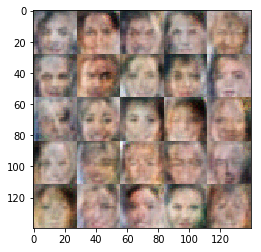

Epoch  1/5 Batch  710/3166... Discriminator Loss: 1.0152... Generator Loss: 0.7378
Epoch  1/5 Batch  720/3166... Discriminator Loss: 2.3418... Generator Loss: 0.9006
Epoch  1/5 Batch  730/3166... Discriminator Loss: 0.3503... Generator Loss: 5.7800
Epoch  1/5 Batch  740/3166... Discriminator Loss: 0.4876... Generator Loss: 1.7141
Epoch  1/5 Batch  750/3166... Discriminator Loss: 0.4926... Generator Loss: 3.2314
Epoch  1/5 Batch  760/3166... Discriminator Loss: 0.4846... Generator Loss: 1.3818
Epoch  1/5 Batch  770/3166... Discriminator Loss: 1.0584... Generator Loss: 0.7560
Epoch  1/5 Batch  780/3166... Discriminator Loss: 0.2283... Generator Loss: 3.3892
Epoch  1/5 Batch  790/3166... Discriminator Loss: 0.1777... Generator Loss: 4.0875
Epoch  1/5 Batch  800/3166... Discriminator Loss: 0.5206... Generator Loss: 3.0098


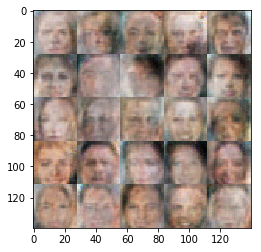

Epoch  1/5 Batch  810/3166... Discriminator Loss: 0.7702... Generator Loss: 0.9532
Epoch  1/5 Batch  820/3166... Discriminator Loss: 0.5478... Generator Loss: 1.5843
Epoch  1/5 Batch  830/3166... Discriminator Loss: 0.6275... Generator Loss: 5.9460
Epoch  1/5 Batch  840/3166... Discriminator Loss: 1.5219... Generator Loss: 1.8140
Epoch  1/5 Batch  850/3166... Discriminator Loss: 0.4028... Generator Loss: 4.1394
Epoch  1/5 Batch  860/3166... Discriminator Loss: 1.8999... Generator Loss: 0.3523
Epoch  1/5 Batch  870/3166... Discriminator Loss: 0.4338... Generator Loss: 2.0614
Epoch  1/5 Batch  880/3166... Discriminator Loss: 0.2162... Generator Loss: 3.3508
Epoch  1/5 Batch  890/3166... Discriminator Loss: 0.3904... Generator Loss: 2.5255
Epoch  1/5 Batch  900/3166... Discriminator Loss: 0.3937... Generator Loss: 2.5115


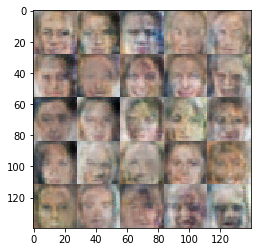

Epoch  1/5 Batch  910/3166... Discriminator Loss: 1.0195... Generator Loss: 3.3233
Epoch  1/5 Batch  920/3166... Discriminator Loss: 1.7021... Generator Loss: 2.3684
Epoch  1/5 Batch  930/3166... Discriminator Loss: 0.6126... Generator Loss: 2.3215
Epoch  1/5 Batch  940/3166... Discriminator Loss: 0.6282... Generator Loss: 2.0128
Epoch  1/5 Batch  950/3166... Discriminator Loss: 1.7066... Generator Loss: 0.3935
Epoch  1/5 Batch  960/3166... Discriminator Loss: 0.8219... Generator Loss: 1.5008
Epoch  1/5 Batch  970/3166... Discriminator Loss: 0.7119... Generator Loss: 2.8436
Epoch  1/5 Batch  980/3166... Discriminator Loss: 1.3959... Generator Loss: 0.4595
Epoch  1/5 Batch  990/3166... Discriminator Loss: 0.4515... Generator Loss: 2.0938
Epoch  1/5 Batch 1000/3166... Discriminator Loss: 1.3232... Generator Loss: 3.6344


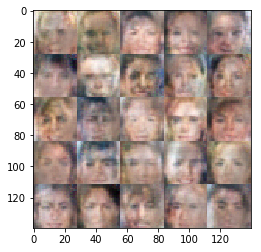

Epoch  1/5 Batch 1010/3166... Discriminator Loss: 0.7660... Generator Loss: 3.7498
Epoch  1/5 Batch 1020/3166... Discriminator Loss: 0.5415... Generator Loss: 2.8236
Epoch  1/5 Batch 1030/3166... Discriminator Loss: 0.4603... Generator Loss: 1.8171
Epoch  1/5 Batch 1040/3166... Discriminator Loss: 3.1228... Generator Loss: 1.7701
Epoch  1/5 Batch 1050/3166... Discriminator Loss: 0.8413... Generator Loss: 2.1233
Epoch  1/5 Batch 1060/3166... Discriminator Loss: 2.7827... Generator Loss: 2.6506
Epoch  1/5 Batch 1070/3166... Discriminator Loss: 0.9537... Generator Loss: 1.6416
Epoch  1/5 Batch 1080/3166... Discriminator Loss: 0.8725... Generator Loss: 1.9721
Epoch  1/5 Batch 1090/3166... Discriminator Loss: 0.9362... Generator Loss: 0.9187
Epoch  1/5 Batch 1100/3166... Discriminator Loss: 0.6239... Generator Loss: 2.6475


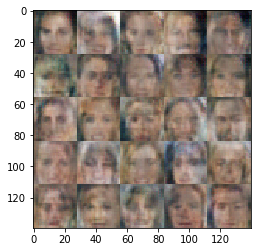

Epoch  1/5 Batch 1110/3166... Discriminator Loss: 1.1236... Generator Loss: 1.8940
Epoch  1/5 Batch 1120/3166... Discriminator Loss: 1.8460... Generator Loss: 0.3093
Epoch  1/5 Batch 1130/3166... Discriminator Loss: 1.0652... Generator Loss: 0.6789
Epoch  1/5 Batch 1140/3166... Discriminator Loss: 0.3645... Generator Loss: 3.9791
Epoch  1/5 Batch 1150/3166... Discriminator Loss: 1.3525... Generator Loss: 4.4172
Epoch  1/5 Batch 1160/3166... Discriminator Loss: 0.8545... Generator Loss: 1.9963
Epoch  1/5 Batch 1170/3166... Discriminator Loss: 0.3405... Generator Loss: 3.2415
Epoch  1/5 Batch 1180/3166... Discriminator Loss: 1.7276... Generator Loss: 0.9975
Epoch  1/5 Batch 1190/3166... Discriminator Loss: 1.3255... Generator Loss: 0.9130
Epoch  1/5 Batch 1200/3166... Discriminator Loss: 1.5185... Generator Loss: 0.4495


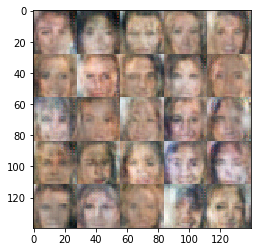

Epoch  1/5 Batch 1210/3166... Discriminator Loss: 1.4820... Generator Loss: 0.5560
Epoch  1/5 Batch 1220/3166... Discriminator Loss: 0.3241... Generator Loss: 2.5718
Epoch  1/5 Batch 1230/3166... Discriminator Loss: 1.8005... Generator Loss: 7.5389
Epoch  1/5 Batch 1240/3166... Discriminator Loss: 0.3683... Generator Loss: 4.5797
Epoch  1/5 Batch 1250/3166... Discriminator Loss: 0.8495... Generator Loss: 0.8309
Epoch  1/5 Batch 1260/3166... Discriminator Loss: 0.1716... Generator Loss: 5.9301
Epoch  1/5 Batch 1270/3166... Discriminator Loss: 0.1265... Generator Loss: 8.4862
Epoch  1/5 Batch 1280/3166... Discriminator Loss: 0.6572... Generator Loss: 2.5791
Epoch  1/5 Batch 1290/3166... Discriminator Loss: 0.9460... Generator Loss: 1.0289
Epoch  1/5 Batch 1300/3166... Discriminator Loss: 2.4244... Generator Loss: 0.4186


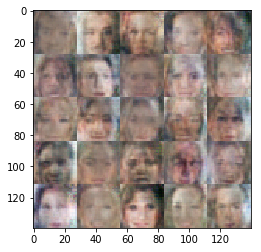

Epoch  1/5 Batch 1310/3166... Discriminator Loss: 0.7878... Generator Loss: 6.2953
Epoch  1/5 Batch 1320/3166... Discriminator Loss: 1.2186... Generator Loss: 0.6432
Epoch  1/5 Batch 1330/3166... Discriminator Loss: 1.3085... Generator Loss: 4.2539
Epoch  1/5 Batch 1340/3166... Discriminator Loss: 0.4387... Generator Loss: 2.8440
Epoch  1/5 Batch 1350/3166... Discriminator Loss: 0.9157... Generator Loss: 0.9878
Epoch  1/5 Batch 1360/3166... Discriminator Loss: 0.8311... Generator Loss: 4.5568
Epoch  1/5 Batch 1370/3166... Discriminator Loss: 0.5970... Generator Loss: 7.0205
Epoch  1/5 Batch 1380/3166... Discriminator Loss: 0.5189... Generator Loss: 1.9723
Epoch  1/5 Batch 1390/3166... Discriminator Loss: 0.7641... Generator Loss: 1.2197
Epoch  1/5 Batch 1400/3166... Discriminator Loss: 0.1251... Generator Loss: 8.0044


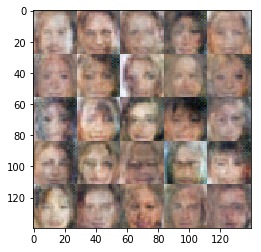

Epoch  1/5 Batch 1410/3166... Discriminator Loss: 0.4959... Generator Loss: 2.4421
Epoch  1/5 Batch 1420/3166... Discriminator Loss: 1.6829... Generator Loss: 0.4253
Epoch  1/5 Batch 1430/3166... Discriminator Loss: 0.5393... Generator Loss: 1.5881
Epoch  1/5 Batch 1440/3166... Discriminator Loss: 0.3910... Generator Loss: 4.7427
Epoch  1/5 Batch 1450/3166... Discriminator Loss: 0.8099... Generator Loss: 0.9549
Epoch  1/5 Batch 1460/3166... Discriminator Loss: 1.1913... Generator Loss: 2.3661
Epoch  1/5 Batch 1470/3166... Discriminator Loss: 0.6987... Generator Loss: 1.1934
Epoch  1/5 Batch 1480/3166... Discriminator Loss: 1.0970... Generator Loss: 0.9683
Epoch  1/5 Batch 1490/3166... Discriminator Loss: 0.8432... Generator Loss: 1.1426
Epoch  1/5 Batch 1500/3166... Discriminator Loss: 0.3381... Generator Loss: 4.4314


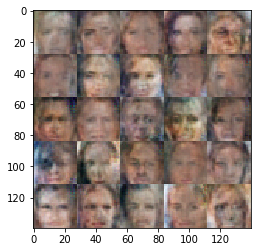

Epoch  1/5 Batch 1510/3166... Discriminator Loss: 0.8664... Generator Loss: 2.6557
Epoch  1/5 Batch 1520/3166... Discriminator Loss: 0.3382... Generator Loss: 3.1332
Epoch  1/5 Batch 1530/3166... Discriminator Loss: 1.3586... Generator Loss: 0.5177
Epoch  1/5 Batch 1540/3166... Discriminator Loss: 0.3535... Generator Loss: 3.2850
Epoch  1/5 Batch 1550/3166... Discriminator Loss: 0.9089... Generator Loss: 0.8573
Epoch  1/5 Batch 1560/3166... Discriminator Loss: 0.8749... Generator Loss: 1.1871
Epoch  1/5 Batch 1570/3166... Discriminator Loss: 0.1719... Generator Loss: 6.1273
Epoch  1/5 Batch 1580/3166... Discriminator Loss: 5.6435... Generator Loss: 1.8607
Epoch  1/5 Batch 1590/3166... Discriminator Loss: 1.1349... Generator Loss: 0.8573
Epoch  1/5 Batch 1600/3166... Discriminator Loss: 1.9953... Generator Loss: 4.5997


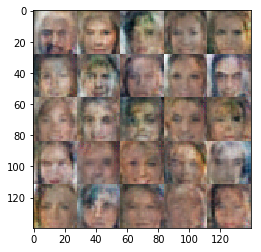

Epoch  1/5 Batch 1610/3166... Discriminator Loss: 0.8000... Generator Loss: 1.0785
Epoch  1/5 Batch 1620/3166... Discriminator Loss: 2.7339... Generator Loss: 4.2264
Epoch  1/5 Batch 1630/3166... Discriminator Loss: 0.6057... Generator Loss: 2.2949
Epoch  1/5 Batch 1640/3166... Discriminator Loss: 1.0622... Generator Loss: 0.7400
Epoch  1/5 Batch 1650/3166... Discriminator Loss: 0.3765... Generator Loss: 2.1868
Epoch  1/5 Batch 1660/3166... Discriminator Loss: 0.3182... Generator Loss: 3.9047
Epoch  1/5 Batch 1670/3166... Discriminator Loss: 0.2588... Generator Loss: 4.4634
Epoch  1/5 Batch 1680/3166... Discriminator Loss: 1.0390... Generator Loss: 1.1100
Epoch  1/5 Batch 1690/3166... Discriminator Loss: 1.3914... Generator Loss: 0.5397
Epoch  1/5 Batch 1700/3166... Discriminator Loss: 0.5353... Generator Loss: 1.7469


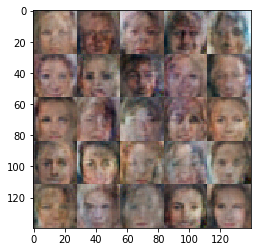

Epoch  1/5 Batch 1710/3166... Discriminator Loss: 0.8715... Generator Loss: 0.9379
Epoch  1/5 Batch 1720/3166... Discriminator Loss: 0.5237... Generator Loss: 1.5734
Epoch  1/5 Batch 1730/3166... Discriminator Loss: 0.6345... Generator Loss: 1.5230
Epoch  1/5 Batch 1740/3166... Discriminator Loss: 0.4853... Generator Loss: 1.8180
Epoch  1/5 Batch 1750/3166... Discriminator Loss: 2.3483... Generator Loss: 2.4630
Epoch  1/5 Batch 1760/3166... Discriminator Loss: 0.2934... Generator Loss: 2.6407
Epoch  1/5 Batch 1770/3166... Discriminator Loss: 0.2937... Generator Loss: 4.9189
Epoch  1/5 Batch 1780/3166... Discriminator Loss: 0.6771... Generator Loss: 4.0757
Epoch  1/5 Batch 1790/3166... Discriminator Loss: 0.1217... Generator Loss: 5.1635
Epoch  1/5 Batch 1800/3166... Discriminator Loss: 1.7165... Generator Loss: 3.7397


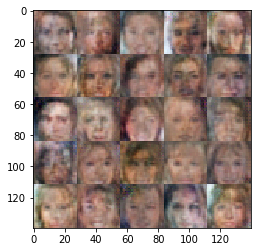

Epoch  1/5 Batch 1810/3166... Discriminator Loss: 0.3394... Generator Loss: 2.6952
Epoch  1/5 Batch 1820/3166... Discriminator Loss: 0.8346... Generator Loss: 1.9551
Epoch  1/5 Batch 1830/3166... Discriminator Loss: 1.0991... Generator Loss: 1.0457
Epoch  1/5 Batch 1840/3166... Discriminator Loss: 1.9907... Generator Loss: 1.7423
Epoch  1/5 Batch 1850/3166... Discriminator Loss: 0.6609... Generator Loss: 1.2560
Epoch  1/5 Batch 1860/3166... Discriminator Loss: 0.9157... Generator Loss: 0.7622
Epoch  1/5 Batch 1870/3166... Discriminator Loss: 1.1696... Generator Loss: 1.8127
Epoch  1/5 Batch 1880/3166... Discriminator Loss: 1.0486... Generator Loss: 0.8845
Epoch  1/5 Batch 1890/3166... Discriminator Loss: 0.7865... Generator Loss: 1.2758
Epoch  1/5 Batch 1900/3166... Discriminator Loss: 1.3910... Generator Loss: 3.8055


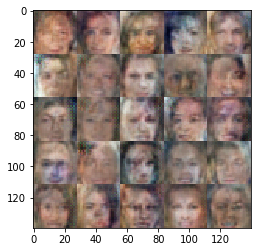

Epoch  1/5 Batch 1910/3166... Discriminator Loss: 0.5515... Generator Loss: 3.1347
Epoch  1/5 Batch 1920/3166... Discriminator Loss: 1.5330... Generator Loss: 0.3784
Epoch  1/5 Batch 1930/3166... Discriminator Loss: 0.2285... Generator Loss: 3.8167
Epoch  1/5 Batch 1940/3166... Discriminator Loss: 0.4306... Generator Loss: 1.9562
Epoch  1/5 Batch 1950/3166... Discriminator Loss: 1.7540... Generator Loss: 2.7281
Epoch  1/5 Batch 1960/3166... Discriminator Loss: 1.2680... Generator Loss: 0.5408
Epoch  1/5 Batch 1970/3166... Discriminator Loss: 0.3201... Generator Loss: 3.2064
Epoch  1/5 Batch 1980/3166... Discriminator Loss: 1.2394... Generator Loss: 0.4903
Epoch  1/5 Batch 1990/3166... Discriminator Loss: 0.4911... Generator Loss: 2.1482
Epoch  1/5 Batch 2000/3166... Discriminator Loss: 0.2870... Generator Loss: 3.1437


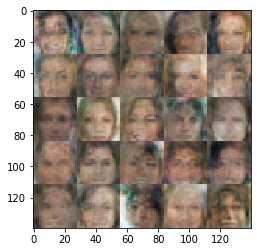

Epoch  1/5 Batch 2010/3166... Discriminator Loss: 0.9807... Generator Loss: 1.6192
Epoch  1/5 Batch 2020/3166... Discriminator Loss: 0.2502... Generator Loss: 5.0136
Epoch  1/5 Batch 2030/3166... Discriminator Loss: 4.8613... Generator Loss: 4.7091
Epoch  1/5 Batch 2040/3166... Discriminator Loss: 1.7802... Generator Loss: 0.3436
Epoch  1/5 Batch 2050/3166... Discriminator Loss: 0.3567... Generator Loss: 2.6329
Epoch  1/5 Batch 2060/3166... Discriminator Loss: 1.0376... Generator Loss: 1.5010
Epoch  1/5 Batch 2070/3166... Discriminator Loss: 0.5008... Generator Loss: 1.8196
Epoch  1/5 Batch 2080/3166... Discriminator Loss: 1.4291... Generator Loss: 4.1952
Epoch  1/5 Batch 2090/3166... Discriminator Loss: 1.1226... Generator Loss: 0.9031
Epoch  1/5 Batch 2100/3166... Discriminator Loss: 0.9347... Generator Loss: 0.8111


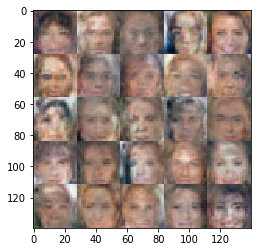

Epoch  1/5 Batch 2110/3166... Discriminator Loss: 1.0228... Generator Loss: 0.9343
Epoch  1/5 Batch 2120/3166... Discriminator Loss: 1.1230... Generator Loss: 0.5848
Epoch  1/5 Batch 2130/3166... Discriminator Loss: 0.9191... Generator Loss: 1.2224
Epoch  1/5 Batch 2140/3166... Discriminator Loss: 0.7129... Generator Loss: 3.7336
Epoch  1/5 Batch 2150/3166... Discriminator Loss: 0.3543... Generator Loss: 3.2583
Epoch  1/5 Batch 2160/3166... Discriminator Loss: 2.5246... Generator Loss: 0.8659
Epoch  1/5 Batch 2170/3166... Discriminator Loss: 1.4580... Generator Loss: 0.4849
Epoch  1/5 Batch 2180/3166... Discriminator Loss: 0.8312... Generator Loss: 1.0225
Epoch  1/5 Batch 2190/3166... Discriminator Loss: 1.1763... Generator Loss: 1.6037
Epoch  1/5 Batch 2200/3166... Discriminator Loss: 1.1434... Generator Loss: 0.7076


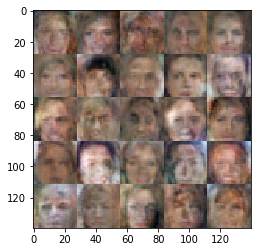

Epoch  1/5 Batch 2210/3166... Discriminator Loss: 0.5953... Generator Loss: 1.4351
Epoch  1/5 Batch 2220/3166... Discriminator Loss: 0.7649... Generator Loss: 1.5864
Epoch  1/5 Batch 2230/3166... Discriminator Loss: 0.5330... Generator Loss: 1.7976
Epoch  1/5 Batch 2240/3166... Discriminator Loss: 1.3244... Generator Loss: 1.7505
Epoch  1/5 Batch 2250/3166... Discriminator Loss: 0.2442... Generator Loss: 5.9195
Epoch  1/5 Batch 2260/3166... Discriminator Loss: 0.4856... Generator Loss: 3.4338
Epoch  1/5 Batch 2270/3166... Discriminator Loss: 0.5759... Generator Loss: 1.4369
Epoch  1/5 Batch 2280/3166... Discriminator Loss: 2.1030... Generator Loss: 2.8467
Epoch  1/5 Batch 2290/3166... Discriminator Loss: 1.7017... Generator Loss: 3.0804
Epoch  1/5 Batch 2300/3166... Discriminator Loss: 1.0851... Generator Loss: 0.8729


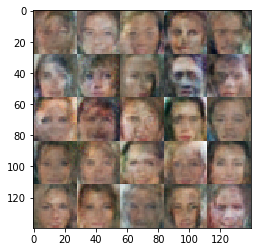

Epoch  1/5 Batch 2310/3166... Discriminator Loss: 0.4877... Generator Loss: 1.7940
Epoch  1/5 Batch 2320/3166... Discriminator Loss: 0.6522... Generator Loss: 2.5904
Epoch  1/5 Batch 2330/3166... Discriminator Loss: 1.0092... Generator Loss: 2.6971
Epoch  1/5 Batch 2340/3166... Discriminator Loss: 0.2070... Generator Loss: 4.3634
Epoch  1/5 Batch 2350/3166... Discriminator Loss: 1.2105... Generator Loss: 0.6572
Epoch  1/5 Batch 2360/3166... Discriminator Loss: 2.0088... Generator Loss: 0.3947
Epoch  1/5 Batch 2370/3166... Discriminator Loss: 0.7588... Generator Loss: 2.6056
Epoch  1/5 Batch 2380/3166... Discriminator Loss: 1.7818... Generator Loss: 0.2485
Epoch  1/5 Batch 2390/3166... Discriminator Loss: 0.6824... Generator Loss: 2.6047
Epoch  1/5 Batch 2400/3166... Discriminator Loss: 0.8174... Generator Loss: 1.6230


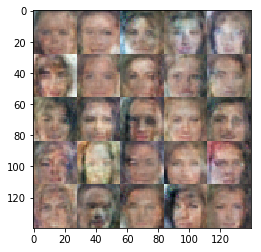

Epoch  1/5 Batch 2410/3166... Discriminator Loss: 0.5156... Generator Loss: 4.1891
Epoch  1/5 Batch 2420/3166... Discriminator Loss: 0.6901... Generator Loss: 3.0274
Epoch  1/5 Batch 2430/3166... Discriminator Loss: 0.1655... Generator Loss: 4.4581
Epoch  1/5 Batch 2440/3166... Discriminator Loss: 0.8659... Generator Loss: 0.8834
Epoch  1/5 Batch 2450/3166... Discriminator Loss: 0.6083... Generator Loss: 1.4559
Epoch  1/5 Batch 2460/3166... Discriminator Loss: 1.2067... Generator Loss: 2.9229
Epoch  1/5 Batch 2470/3166... Discriminator Loss: 0.7305... Generator Loss: 0.9918
Epoch  1/5 Batch 2480/3166... Discriminator Loss: 0.4003... Generator Loss: 2.9486
Epoch  1/5 Batch 2490/3166... Discriminator Loss: 0.4780... Generator Loss: 1.6551
Epoch  1/5 Batch 2500/3166... Discriminator Loss: 0.8137... Generator Loss: 1.1408


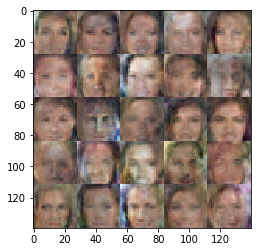

Epoch  1/5 Batch 2510/3166... Discriminator Loss: 0.3263... Generator Loss: 1.8449
Epoch  1/5 Batch 2520/3166... Discriminator Loss: 0.7646... Generator Loss: 1.2592
Epoch  1/5 Batch 2530/3166... Discriminator Loss: 0.2528... Generator Loss: 3.7777
Epoch  1/5 Batch 2540/3166... Discriminator Loss: 0.7376... Generator Loss: 5.0094
Epoch  1/5 Batch 2550/3166... Discriminator Loss: 3.4980... Generator Loss: 0.1805
Epoch  1/5 Batch 2560/3166... Discriminator Loss: 1.3981... Generator Loss: 0.6056
Epoch  1/5 Batch 2570/3166... Discriminator Loss: 1.4992... Generator Loss: 0.5208
Epoch  1/5 Batch 2580/3166... Discriminator Loss: 1.0793... Generator Loss: 0.9765
Epoch  1/5 Batch 2590/3166... Discriminator Loss: 0.8065... Generator Loss: 2.4696
Epoch  1/5 Batch 2600/3166... Discriminator Loss: 0.8968... Generator Loss: 2.8323


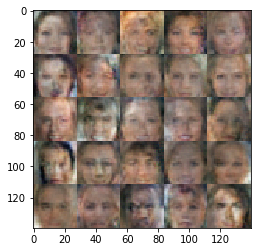

Epoch  1/5 Batch 2610/3166... Discriminator Loss: 0.8676... Generator Loss: 1.3317
Epoch  1/5 Batch 2620/3166... Discriminator Loss: 0.8308... Generator Loss: 1.8506
Epoch  1/5 Batch 2630/3166... Discriminator Loss: 1.0598... Generator Loss: 0.8451
Epoch  1/5 Batch 2640/3166... Discriminator Loss: 0.9691... Generator Loss: 1.1436
Epoch  1/5 Batch 2650/3166... Discriminator Loss: 2.1165... Generator Loss: 0.2538
Epoch  1/5 Batch 2660/3166... Discriminator Loss: 0.5346... Generator Loss: 1.6330
Epoch  1/5 Batch 2670/3166... Discriminator Loss: 0.7801... Generator Loss: 2.7205
Epoch  1/5 Batch 2680/3166... Discriminator Loss: 1.4846... Generator Loss: 0.3860
Epoch  1/5 Batch 2690/3166... Discriminator Loss: 0.7180... Generator Loss: 0.9940
Epoch  1/5 Batch 2700/3166... Discriminator Loss: 0.5309... Generator Loss: 1.4506


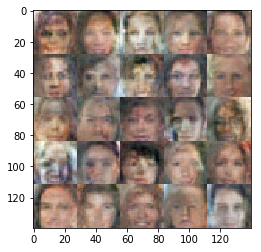

Epoch  1/5 Batch 2710/3166... Discriminator Loss: 1.0894... Generator Loss: 0.7312
Epoch  1/5 Batch 2720/3166... Discriminator Loss: 1.3821... Generator Loss: 0.6064
Epoch  1/5 Batch 2730/3166... Discriminator Loss: 0.7695... Generator Loss: 1.4120
Epoch  1/5 Batch 2740/3166... Discriminator Loss: 0.7804... Generator Loss: 1.6183
Epoch  1/5 Batch 2750/3166... Discriminator Loss: 0.7342... Generator Loss: 1.3482
Epoch  1/5 Batch 2760/3166... Discriminator Loss: 1.0181... Generator Loss: 0.8297
Epoch  1/5 Batch 2770/3166... Discriminator Loss: 0.8424... Generator Loss: 1.4268
Epoch  1/5 Batch 2780/3166... Discriminator Loss: 0.9525... Generator Loss: 1.2844
Epoch  1/5 Batch 2790/3166... Discriminator Loss: 0.5358... Generator Loss: 1.9536
Epoch  1/5 Batch 2800/3166... Discriminator Loss: 0.6098... Generator Loss: 1.7268


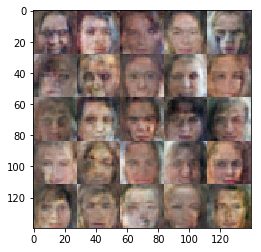

Epoch  1/5 Batch 2810/3166... Discriminator Loss: 2.0548... Generator Loss: 2.7314
Epoch  1/5 Batch 2820/3166... Discriminator Loss: 0.8474... Generator Loss: 1.5877
Epoch  1/5 Batch 2830/3166... Discriminator Loss: 1.2379... Generator Loss: 2.0311
Epoch  1/5 Batch 2840/3166... Discriminator Loss: 0.9402... Generator Loss: 1.4884
Epoch  1/5 Batch 2850/3166... Discriminator Loss: 0.9214... Generator Loss: 1.3506
Epoch  1/5 Batch 2860/3166... Discriminator Loss: 1.1914... Generator Loss: 0.5455
Epoch  1/5 Batch 2870/3166... Discriminator Loss: 0.6220... Generator Loss: 1.9790
Epoch  1/5 Batch 2880/3166... Discriminator Loss: 0.7838... Generator Loss: 1.3000
Epoch  1/5 Batch 2890/3166... Discriminator Loss: 0.5720... Generator Loss: 2.9578
Epoch  1/5 Batch 2900/3166... Discriminator Loss: 0.4796... Generator Loss: 1.7181


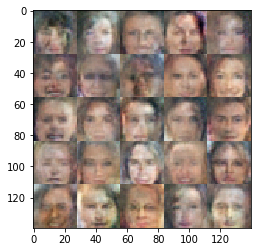

Epoch  1/5 Batch 2910/3166... Discriminator Loss: 1.1354... Generator Loss: 0.6202
Epoch  1/5 Batch 2920/3166... Discriminator Loss: 0.7037... Generator Loss: 2.1047
Epoch  1/5 Batch 2930/3166... Discriminator Loss: 0.8218... Generator Loss: 1.6300
Epoch  1/5 Batch 2940/3166... Discriminator Loss: 0.6349... Generator Loss: 1.4874
Epoch  1/5 Batch 2950/3166... Discriminator Loss: 0.7777... Generator Loss: 2.7989
Epoch  1/5 Batch 2960/3166... Discriminator Loss: 0.7526... Generator Loss: 1.9910
Epoch  1/5 Batch 2970/3166... Discriminator Loss: 0.5831... Generator Loss: 1.2811
Epoch  1/5 Batch 2980/3166... Discriminator Loss: 0.5652... Generator Loss: 1.5931
Epoch  1/5 Batch 2990/3166... Discriminator Loss: 4.3238... Generator Loss: 0.8329
Epoch  1/5 Batch 3000/3166... Discriminator Loss: 1.6973... Generator Loss: 0.6533


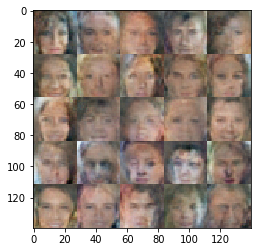

Epoch  1/5 Batch 3010/3166... Discriminator Loss: 1.3035... Generator Loss: 0.7012
Epoch  1/5 Batch 3020/3166... Discriminator Loss: 0.8831... Generator Loss: 1.9846
Epoch  1/5 Batch 3030/3166... Discriminator Loss: 0.9623... Generator Loss: 0.8094
Epoch  1/5 Batch 3040/3166... Discriminator Loss: 1.3651... Generator Loss: 0.5001
Epoch  1/5 Batch 3050/3166... Discriminator Loss: 2.2444... Generator Loss: 2.3323
Epoch  1/5 Batch 3060/3166... Discriminator Loss: 1.0340... Generator Loss: 1.0390
Epoch  1/5 Batch 3070/3166... Discriminator Loss: 0.4554... Generator Loss: 1.8100
Epoch  1/5 Batch 3080/3166... Discriminator Loss: 1.8413... Generator Loss: 0.2662
Epoch  1/5 Batch 3090/3166... Discriminator Loss: 0.6745... Generator Loss: 2.0499
Epoch  1/5 Batch 3100/3166... Discriminator Loss: 1.1542... Generator Loss: 0.5878


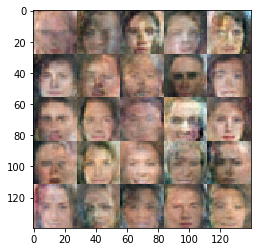

Epoch  1/5 Batch 3110/3166... Discriminator Loss: 1.0552... Generator Loss: 1.8774
Epoch  1/5 Batch 3120/3166... Discriminator Loss: 0.6995... Generator Loss: 2.1157
Epoch  1/5 Batch 3130/3166... Discriminator Loss: 0.6600... Generator Loss: 1.3186
Epoch  1/5 Batch 3140/3166... Discriminator Loss: 0.5128... Generator Loss: 1.5270
Epoch  1/5 Batch 3150/3166... Discriminator Loss: 1.0788... Generator Loss: 0.5844
Epoch  1/5 Batch 3160/3166... Discriminator Loss: 1.3112... Generator Loss: 0.5406
Epoch  2/5 Batch    5/3166... Discriminator Loss: 1.3226... Generator Loss: 1.6414
Epoch  2/5 Batch   15/3166... Discriminator Loss: 0.7626... Generator Loss: 2.4101
Epoch  2/5 Batch   25/3166... Discriminator Loss: 0.9912... Generator Loss: 0.7591
Epoch  2/5 Batch   35/3166... Discriminator Loss: 0.9101... Generator Loss: 1.0379


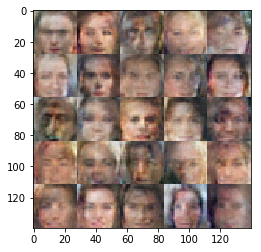

Epoch  2/5 Batch   45/3166... Discriminator Loss: 0.7259... Generator Loss: 1.7059
Epoch  2/5 Batch   55/3166... Discriminator Loss: 1.1701... Generator Loss: 0.6621
Epoch  2/5 Batch   65/3166... Discriminator Loss: 1.0591... Generator Loss: 1.1991
Epoch  2/5 Batch   75/3166... Discriminator Loss: 0.9298... Generator Loss: 0.9928
Epoch  2/5 Batch   85/3166... Discriminator Loss: 0.5947... Generator Loss: 1.5173
Epoch  2/5 Batch   95/3166... Discriminator Loss: 0.8153... Generator Loss: 2.0566
Epoch  2/5 Batch  105/3166... Discriminator Loss: 1.7100... Generator Loss: 1.1949
Epoch  2/5 Batch  115/3166... Discriminator Loss: 0.8897... Generator Loss: 1.0156
Epoch  2/5 Batch  125/3166... Discriminator Loss: 0.8315... Generator Loss: 1.8008
Epoch  2/5 Batch  135/3166... Discriminator Loss: 1.6240... Generator Loss: 0.3421


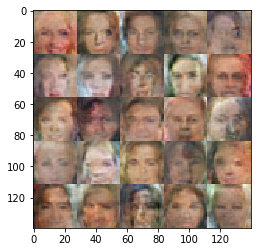

Epoch  2/5 Batch  145/3166... Discriminator Loss: 0.6261... Generator Loss: 1.3122
Epoch  2/5 Batch  155/3166... Discriminator Loss: 1.1376... Generator Loss: 0.6153
Epoch  2/5 Batch  165/3166... Discriminator Loss: 1.1730... Generator Loss: 1.0136
Epoch  2/5 Batch  175/3166... Discriminator Loss: 0.9026... Generator Loss: 1.7324
Epoch  2/5 Batch  185/3166... Discriminator Loss: 1.2302... Generator Loss: 0.5583
Epoch  2/5 Batch  195/3166... Discriminator Loss: 0.4944... Generator Loss: 2.2812
Epoch  2/5 Batch  205/3166... Discriminator Loss: 1.0737... Generator Loss: 0.6597
Epoch  2/5 Batch  215/3166... Discriminator Loss: 1.2259... Generator Loss: 0.5640
Epoch  2/5 Batch  225/3166... Discriminator Loss: 1.0780... Generator Loss: 1.1394
Epoch  2/5 Batch  235/3166... Discriminator Loss: 1.5459... Generator Loss: 0.3487


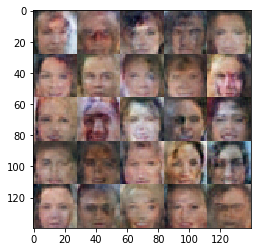

Epoch  2/5 Batch  245/3166... Discriminator Loss: 0.5011... Generator Loss: 2.2585
Epoch  2/5 Batch  255/3166... Discriminator Loss: 0.9213... Generator Loss: 0.8211
Epoch  2/5 Batch  265/3166... Discriminator Loss: 1.0758... Generator Loss: 0.9409
Epoch  2/5 Batch  275/3166... Discriminator Loss: 0.7099... Generator Loss: 0.9300
Epoch  2/5 Batch  285/3166... Discriminator Loss: 0.6887... Generator Loss: 1.3775
Epoch  2/5 Batch  295/3166... Discriminator Loss: 1.2731... Generator Loss: 1.7048
Epoch  2/5 Batch  305/3166... Discriminator Loss: 1.0816... Generator Loss: 1.2086
Epoch  2/5 Batch  315/3166... Discriminator Loss: 1.7022... Generator Loss: 1.0893
Epoch  2/5 Batch  325/3166... Discriminator Loss: 1.6530... Generator Loss: 0.3408
Epoch  2/5 Batch  335/3166... Discriminator Loss: 1.1898... Generator Loss: 1.1338


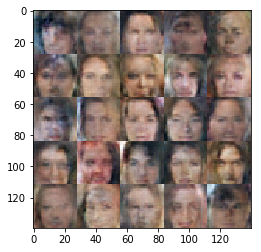

Epoch  2/5 Batch  345/3166... Discriminator Loss: 1.0259... Generator Loss: 0.6984
Epoch  2/5 Batch  355/3166... Discriminator Loss: 0.9614... Generator Loss: 0.8508
Epoch  2/5 Batch  365/3166... Discriminator Loss: 1.0191... Generator Loss: 0.8828
Epoch  2/5 Batch  375/3166... Discriminator Loss: 0.9990... Generator Loss: 1.4913
Epoch  2/5 Batch  385/3166... Discriminator Loss: 0.8604... Generator Loss: 1.0150
Epoch  2/5 Batch  395/3166... Discriminator Loss: 1.0776... Generator Loss: 0.6490
Epoch  2/5 Batch  405/3166... Discriminator Loss: 1.1444... Generator Loss: 0.5011
Epoch  2/5 Batch  415/3166... Discriminator Loss: 0.8039... Generator Loss: 1.1352
Epoch  2/5 Batch  425/3166... Discriminator Loss: 0.7780... Generator Loss: 3.0427
Epoch  2/5 Batch  435/3166... Discriminator Loss: 1.5242... Generator Loss: 1.3390


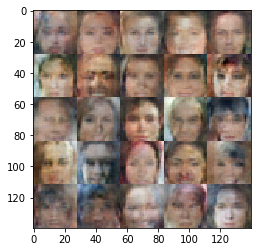

Epoch  2/5 Batch  445/3166... Discriminator Loss: 1.3934... Generator Loss: 1.5853
Epoch  2/5 Batch  455/3166... Discriminator Loss: 0.9910... Generator Loss: 1.2480
Epoch  2/5 Batch  465/3166... Discriminator Loss: 1.2273... Generator Loss: 0.5608
Epoch  2/5 Batch  475/3166... Discriminator Loss: 0.5846... Generator Loss: 1.6450
Epoch  2/5 Batch  485/3166... Discriminator Loss: 0.8605... Generator Loss: 1.8111
Epoch  2/5 Batch  495/3166... Discriminator Loss: 0.9128... Generator Loss: 0.9847
Epoch  2/5 Batch  505/3166... Discriminator Loss: 1.2176... Generator Loss: 0.5706
Epoch  2/5 Batch  515/3166... Discriminator Loss: 0.8386... Generator Loss: 1.1036
Epoch  2/5 Batch  525/3166... Discriminator Loss: 1.2324... Generator Loss: 0.6557
Epoch  2/5 Batch  535/3166... Discriminator Loss: 1.0608... Generator Loss: 0.6777


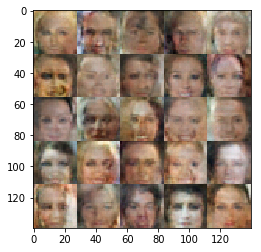

Epoch  2/5 Batch  545/3166... Discriminator Loss: 1.3030... Generator Loss: 0.4779
Epoch  2/5 Batch  555/3166... Discriminator Loss: 0.9689... Generator Loss: 0.9858
Epoch  2/5 Batch  565/3166... Discriminator Loss: 0.9864... Generator Loss: 0.7195
Epoch  2/5 Batch  575/3166... Discriminator Loss: 0.9549... Generator Loss: 0.9763
Epoch  2/5 Batch  585/3166... Discriminator Loss: 0.9029... Generator Loss: 1.1572
Epoch  2/5 Batch  595/3166... Discriminator Loss: 1.1547... Generator Loss: 0.6040
Epoch  2/5 Batch  605/3166... Discriminator Loss: 0.9575... Generator Loss: 1.8714
Epoch  2/5 Batch  615/3166... Discriminator Loss: 0.7068... Generator Loss: 2.0077
Epoch  2/5 Batch  625/3166... Discriminator Loss: 1.3643... Generator Loss: 1.1492
Epoch  2/5 Batch  635/3166... Discriminator Loss: 1.1728... Generator Loss: 0.6062


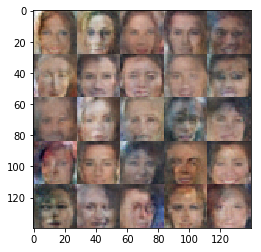

Epoch  2/5 Batch  645/3166... Discriminator Loss: 1.0862... Generator Loss: 1.6166
Epoch  2/5 Batch  655/3166... Discriminator Loss: 1.4250... Generator Loss: 0.3919
Epoch  2/5 Batch  665/3166... Discriminator Loss: 1.2181... Generator Loss: 0.5553
Epoch  2/5 Batch  675/3166... Discriminator Loss: 0.8579... Generator Loss: 1.3563
Epoch  2/5 Batch  685/3166... Discriminator Loss: 0.5703... Generator Loss: 1.4824
Epoch  2/5 Batch  695/3166... Discriminator Loss: 1.0900... Generator Loss: 1.3125
Epoch  2/5 Batch  705/3166... Discriminator Loss: 1.5828... Generator Loss: 0.3654
Epoch  2/5 Batch  715/3166... Discriminator Loss: 1.0673... Generator Loss: 1.4420
Epoch  2/5 Batch  725/3166... Discriminator Loss: 0.8804... Generator Loss: 1.8424
Epoch  2/5 Batch  735/3166... Discriminator Loss: 0.9662... Generator Loss: 0.9864


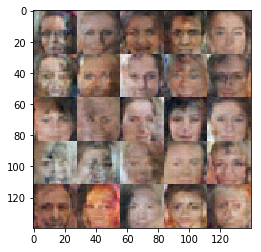

Epoch  2/5 Batch  745/3166... Discriminator Loss: 1.2642... Generator Loss: 0.6197
Epoch  2/5 Batch  755/3166... Discriminator Loss: 0.9685... Generator Loss: 1.5375
Epoch  2/5 Batch  765/3166... Discriminator Loss: 0.8353... Generator Loss: 1.1108
Epoch  2/5 Batch  775/3166... Discriminator Loss: 1.2287... Generator Loss: 0.5435
Epoch  2/5 Batch  785/3166... Discriminator Loss: 0.5699... Generator Loss: 2.0206
Epoch  2/5 Batch  795/3166... Discriminator Loss: 0.9721... Generator Loss: 1.3167
Epoch  2/5 Batch  805/3166... Discriminator Loss: 1.0909... Generator Loss: 0.7619
Epoch  2/5 Batch  815/3166... Discriminator Loss: 0.9971... Generator Loss: 2.1133
Epoch  2/5 Batch  825/3166... Discriminator Loss: 1.0381... Generator Loss: 1.0429
Epoch  2/5 Batch  835/3166... Discriminator Loss: 1.2291... Generator Loss: 0.6645


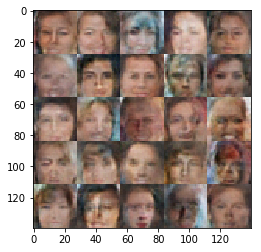

Epoch  2/5 Batch  845/3166... Discriminator Loss: 0.7626... Generator Loss: 0.9315
Epoch  2/5 Batch  855/3166... Discriminator Loss: 0.8417... Generator Loss: 1.5669
Epoch  2/5 Batch  865/3166... Discriminator Loss: 0.7620... Generator Loss: 0.9157
Epoch  2/5 Batch  875/3166... Discriminator Loss: 0.7916... Generator Loss: 0.9385
Epoch  2/5 Batch  885/3166... Discriminator Loss: 1.0706... Generator Loss: 0.6059
Epoch  2/5 Batch  895/3166... Discriminator Loss: 1.9076... Generator Loss: 0.2110
Epoch  2/5 Batch  905/3166... Discriminator Loss: 0.9598... Generator Loss: 1.2118
Epoch  2/5 Batch  915/3166... Discriminator Loss: 1.1396... Generator Loss: 0.6410
Epoch  2/5 Batch  925/3166... Discriminator Loss: 0.9553... Generator Loss: 0.7976
Epoch  2/5 Batch  935/3166... Discriminator Loss: 1.1335... Generator Loss: 0.5695


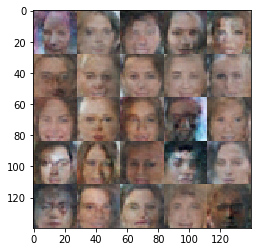

Epoch  2/5 Batch  945/3166... Discriminator Loss: 1.2262... Generator Loss: 0.6149
Epoch  2/5 Batch  955/3166... Discriminator Loss: 1.5224... Generator Loss: 0.4231
Epoch  2/5 Batch  965/3166... Discriminator Loss: 1.0654... Generator Loss: 0.6173
Epoch  2/5 Batch  975/3166... Discriminator Loss: 1.2825... Generator Loss: 0.6068
Epoch  2/5 Batch  985/3166... Discriminator Loss: 1.2172... Generator Loss: 1.9294
Epoch  2/5 Batch  995/3166... Discriminator Loss: 0.5375... Generator Loss: 2.0420
Epoch  2/5 Batch 1005/3166... Discriminator Loss: 2.1105... Generator Loss: 2.5914
Epoch  2/5 Batch 1015/3166... Discriminator Loss: 0.8200... Generator Loss: 1.4947
Epoch  2/5 Batch 1025/3166... Discriminator Loss: 0.8299... Generator Loss: 1.1240
Epoch  2/5 Batch 1035/3166... Discriminator Loss: 0.5737... Generator Loss: 1.7962


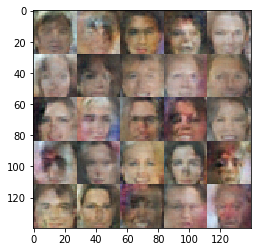

Epoch  2/5 Batch 1045/3166... Discriminator Loss: 0.4977... Generator Loss: 2.1068
Epoch  2/5 Batch 1055/3166... Discriminator Loss: 1.3489... Generator Loss: 1.4090
Epoch  2/5 Batch 1065/3166... Discriminator Loss: 0.7010... Generator Loss: 1.4667
Epoch  2/5 Batch 1075/3166... Discriminator Loss: 0.9213... Generator Loss: 1.4428
Epoch  2/5 Batch 1085/3166... Discriminator Loss: 1.3142... Generator Loss: 1.9066
Epoch  2/5 Batch 1095/3166... Discriminator Loss: 1.5855... Generator Loss: 0.3400
Epoch  2/5 Batch 1105/3166... Discriminator Loss: 1.0234... Generator Loss: 1.0191
Epoch  2/5 Batch 1115/3166... Discriminator Loss: 1.1715... Generator Loss: 1.4966
Epoch  2/5 Batch 1125/3166... Discriminator Loss: 1.0451... Generator Loss: 0.7891
Epoch  2/5 Batch 1135/3166... Discriminator Loss: 1.0622... Generator Loss: 0.6228


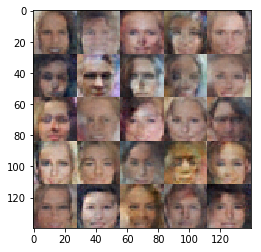

Epoch  2/5 Batch 1145/3166... Discriminator Loss: 1.0608... Generator Loss: 1.2616
Epoch  2/5 Batch 1155/3166... Discriminator Loss: 0.5599... Generator Loss: 1.7504
Epoch  2/5 Batch 1165/3166... Discriminator Loss: 1.5713... Generator Loss: 1.3409
Epoch  2/5 Batch 1175/3166... Discriminator Loss: 0.8583... Generator Loss: 0.8338
Epoch  2/5 Batch 1185/3166... Discriminator Loss: 0.5440... Generator Loss: 2.6188
Epoch  2/5 Batch 1195/3166... Discriminator Loss: 1.0464... Generator Loss: 1.3377
Epoch  2/5 Batch 1205/3166... Discriminator Loss: 0.9096... Generator Loss: 1.1834
Epoch  2/5 Batch 1215/3166... Discriminator Loss: 1.2185... Generator Loss: 0.9182
Epoch  2/5 Batch 1225/3166... Discriminator Loss: 1.0357... Generator Loss: 0.7785
Epoch  2/5 Batch 1235/3166... Discriminator Loss: 1.0662... Generator Loss: 1.1343


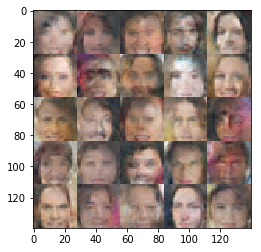

Epoch  2/5 Batch 1245/3166... Discriminator Loss: 2.0331... Generator Loss: 0.2459
Epoch  2/5 Batch 1255/3166... Discriminator Loss: 1.9730... Generator Loss: 0.8087
Epoch  2/5 Batch 1265/3166... Discriminator Loss: 1.8795... Generator Loss: 0.2833
Epoch  2/5 Batch 1275/3166... Discriminator Loss: 1.3874... Generator Loss: 1.0479
Epoch  2/5 Batch 1285/3166... Discriminator Loss: 0.9598... Generator Loss: 1.5052
Epoch  2/5 Batch 1295/3166... Discriminator Loss: 1.0161... Generator Loss: 1.1223
Epoch  2/5 Batch 1305/3166... Discriminator Loss: 1.4296... Generator Loss: 0.3610
Epoch  2/5 Batch 1315/3166... Discriminator Loss: 1.2522... Generator Loss: 2.1980
Epoch  2/5 Batch 1325/3166... Discriminator Loss: 0.6537... Generator Loss: 1.6870
Epoch  2/5 Batch 1335/3166... Discriminator Loss: 0.5089... Generator Loss: 1.4995


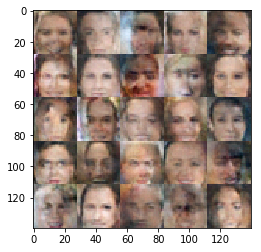

Epoch  2/5 Batch 1345/3166... Discriminator Loss: 1.0251... Generator Loss: 2.0772
Epoch  2/5 Batch 1355/3166... Discriminator Loss: 1.4720... Generator Loss: 0.4507
Epoch  2/5 Batch 1365/3166... Discriminator Loss: 1.0625... Generator Loss: 2.0897
Epoch  2/5 Batch 1375/3166... Discriminator Loss: 1.5816... Generator Loss: 0.4002
Epoch  2/5 Batch 1385/3166... Discriminator Loss: 0.7375... Generator Loss: 1.5168
Epoch  2/5 Batch 1395/3166... Discriminator Loss: 0.7764... Generator Loss: 0.9765
Epoch  2/5 Batch 1405/3166... Discriminator Loss: 0.7161... Generator Loss: 0.9837
Epoch  2/5 Batch 1415/3166... Discriminator Loss: 1.4116... Generator Loss: 0.5203
Epoch  2/5 Batch 1425/3166... Discriminator Loss: 1.0431... Generator Loss: 0.6653
Epoch  2/5 Batch 1435/3166... Discriminator Loss: 0.6700... Generator Loss: 1.1984


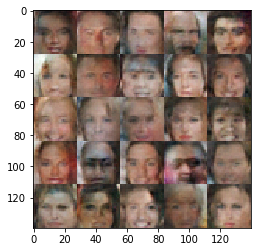

Epoch  2/5 Batch 1445/3166... Discriminator Loss: 0.8484... Generator Loss: 1.7153
Epoch  2/5 Batch 1455/3166... Discriminator Loss: 0.7956... Generator Loss: 0.9696
Epoch  2/5 Batch 1465/3166... Discriminator Loss: 0.9603... Generator Loss: 0.6984
Epoch  2/5 Batch 1475/3166... Discriminator Loss: 0.8427... Generator Loss: 1.2901
Epoch  2/5 Batch 1485/3166... Discriminator Loss: 1.0808... Generator Loss: 0.7246
Epoch  2/5 Batch 1495/3166... Discriminator Loss: 1.1757... Generator Loss: 1.0214
Epoch  2/5 Batch 1505/3166... Discriminator Loss: 1.0651... Generator Loss: 1.2589
Epoch  2/5 Batch 1515/3166... Discriminator Loss: 1.1502... Generator Loss: 1.1834
Epoch  2/5 Batch 1525/3166... Discriminator Loss: 0.7779... Generator Loss: 0.8517
Epoch  2/5 Batch 1535/3166... Discriminator Loss: 0.7622... Generator Loss: 1.0203


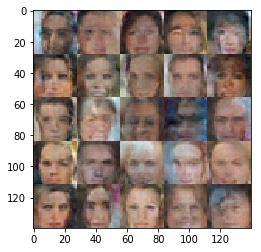

Epoch  2/5 Batch 1545/3166... Discriminator Loss: 1.1224... Generator Loss: 1.3122
Epoch  2/5 Batch 1555/3166... Discriminator Loss: 0.9213... Generator Loss: 1.3023
Epoch  2/5 Batch 1565/3166... Discriminator Loss: 1.4142... Generator Loss: 0.5689
Epoch  2/5 Batch 1575/3166... Discriminator Loss: 0.8553... Generator Loss: 1.4844
Epoch  2/5 Batch 1585/3166... Discriminator Loss: 0.9073... Generator Loss: 1.2357
Epoch  2/5 Batch 1595/3166... Discriminator Loss: 0.8517... Generator Loss: 1.7427
Epoch  2/5 Batch 1605/3166... Discriminator Loss: 2.1585... Generator Loss: 0.3293
Epoch  2/5 Batch 1615/3166... Discriminator Loss: 0.9563... Generator Loss: 0.7661
Epoch  2/5 Batch 1625/3166... Discriminator Loss: 1.5345... Generator Loss: 0.3046
Epoch  2/5 Batch 1635/3166... Discriminator Loss: 1.0977... Generator Loss: 0.8097


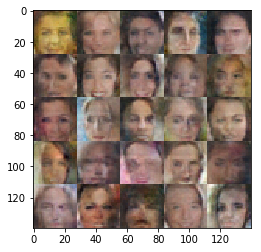

Epoch  2/5 Batch 1645/3166... Discriminator Loss: 1.6468... Generator Loss: 0.2888
Epoch  2/5 Batch 1655/3166... Discriminator Loss: 1.1030... Generator Loss: 0.6737
Epoch  2/5 Batch 1665/3166... Discriminator Loss: 0.7987... Generator Loss: 1.5411
Epoch  2/5 Batch 1675/3166... Discriminator Loss: 2.0017... Generator Loss: 0.1783
Epoch  2/5 Batch 1685/3166... Discriminator Loss: 0.7337... Generator Loss: 1.5089
Epoch  2/5 Batch 1695/3166... Discriminator Loss: 0.7065... Generator Loss: 2.3499
Epoch  2/5 Batch 1705/3166... Discriminator Loss: 0.9669... Generator Loss: 0.9149
Epoch  2/5 Batch 1715/3166... Discriminator Loss: 1.3612... Generator Loss: 1.8486
Epoch  2/5 Batch 1725/3166... Discriminator Loss: 1.1940... Generator Loss: 1.3910
Epoch  2/5 Batch 1735/3166... Discriminator Loss: 1.0045... Generator Loss: 1.9172


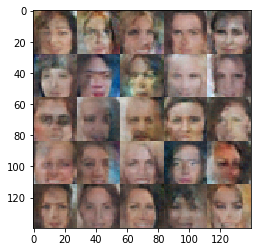

Epoch  2/5 Batch 1745/3166... Discriminator Loss: 1.5322... Generator Loss: 0.3787
Epoch  2/5 Batch 1755/3166... Discriminator Loss: 0.9729... Generator Loss: 0.7268
Epoch  2/5 Batch 1765/3166... Discriminator Loss: 1.1300... Generator Loss: 2.8413
Epoch  2/5 Batch 1775/3166... Discriminator Loss: 0.7881... Generator Loss: 1.6202
Epoch  2/5 Batch 1785/3166... Discriminator Loss: 2.0213... Generator Loss: 0.1817
Epoch  2/5 Batch 1795/3166... Discriminator Loss: 1.1366... Generator Loss: 1.3789
Epoch  2/5 Batch 1805/3166... Discriminator Loss: 1.0667... Generator Loss: 1.0598
Epoch  2/5 Batch 1815/3166... Discriminator Loss: 1.1436... Generator Loss: 1.1990
Epoch  2/5 Batch 1825/3166... Discriminator Loss: 1.0943... Generator Loss: 1.1807
Epoch  2/5 Batch 1835/3166... Discriminator Loss: 1.4892... Generator Loss: 0.3797


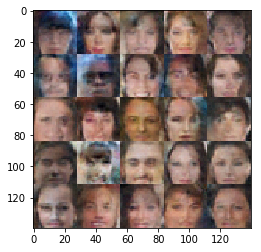

Epoch  2/5 Batch 1845/3166... Discriminator Loss: 2.4130... Generator Loss: 2.6722
Epoch  2/5 Batch 1855/3166... Discriminator Loss: 1.1582... Generator Loss: 0.8744
Epoch  2/5 Batch 1865/3166... Discriminator Loss: 0.8513... Generator Loss: 1.3571
Epoch  2/5 Batch 1875/3166... Discriminator Loss: 1.4197... Generator Loss: 0.4562
Epoch  2/5 Batch 1885/3166... Discriminator Loss: 1.0036... Generator Loss: 0.7386
Epoch  2/5 Batch 1895/3166... Discriminator Loss: 1.2717... Generator Loss: 2.4389
Epoch  2/5 Batch 1905/3166... Discriminator Loss: 0.7808... Generator Loss: 1.2923
Epoch  2/5 Batch 1915/3166... Discriminator Loss: 1.2500... Generator Loss: 1.2285
Epoch  2/5 Batch 1925/3166... Discriminator Loss: 1.4131... Generator Loss: 0.4051
Epoch  2/5 Batch 1935/3166... Discriminator Loss: 1.2704... Generator Loss: 0.7194


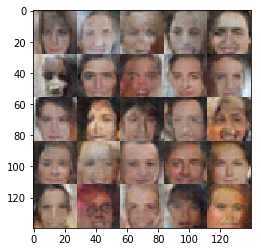

Epoch  2/5 Batch 1945/3166... Discriminator Loss: 0.8747... Generator Loss: 1.2003
Epoch  2/5 Batch 1955/3166... Discriminator Loss: 1.1826... Generator Loss: 0.5699
Epoch  2/5 Batch 1965/3166... Discriminator Loss: 0.8914... Generator Loss: 0.7209
Epoch  2/5 Batch 1975/3166... Discriminator Loss: 0.7186... Generator Loss: 1.0043
Epoch  2/5 Batch 1985/3166... Discriminator Loss: 0.7928... Generator Loss: 1.4244
Epoch  2/5 Batch 1995/3166... Discriminator Loss: 0.8408... Generator Loss: 0.8450
Epoch  2/5 Batch 2005/3166... Discriminator Loss: 1.4433... Generator Loss: 2.6844
Epoch  2/5 Batch 2015/3166... Discriminator Loss: 1.0720... Generator Loss: 1.2375
Epoch  2/5 Batch 2025/3166... Discriminator Loss: 1.0009... Generator Loss: 1.0444
Epoch  2/5 Batch 2035/3166... Discriminator Loss: 0.6551... Generator Loss: 1.7670


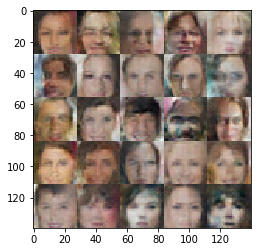

Epoch  2/5 Batch 2045/3166... Discriminator Loss: 1.4997... Generator Loss: 0.4158
Epoch  2/5 Batch 2055/3166... Discriminator Loss: 1.2625... Generator Loss: 0.5558
Epoch  2/5 Batch 2065/3166... Discriminator Loss: 0.7260... Generator Loss: 1.6572
Epoch  2/5 Batch 2075/3166... Discriminator Loss: 0.6234... Generator Loss: 1.1273
Epoch  2/5 Batch 2085/3166... Discriminator Loss: 1.1717... Generator Loss: 0.8216
Epoch  2/5 Batch 2095/3166... Discriminator Loss: 1.5985... Generator Loss: 0.3546
Epoch  2/5 Batch 2105/3166... Discriminator Loss: 1.0612... Generator Loss: 0.7731
Epoch  2/5 Batch 2115/3166... Discriminator Loss: 1.5095... Generator Loss: 0.3755
Epoch  2/5 Batch 2125/3166... Discriminator Loss: 1.1774... Generator Loss: 1.0175
Epoch  2/5 Batch 2135/3166... Discriminator Loss: 1.1288... Generator Loss: 0.6335


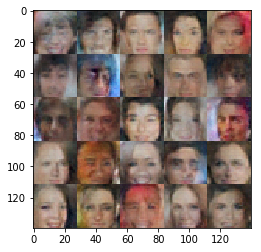

Epoch  2/5 Batch 2145/3166... Discriminator Loss: 1.5090... Generator Loss: 0.3806
Epoch  2/5 Batch 2155/3166... Discriminator Loss: 0.7130... Generator Loss: 1.1130
Epoch  2/5 Batch 2165/3166... Discriminator Loss: 0.7667... Generator Loss: 1.9033
Epoch  2/5 Batch 2175/3166... Discriminator Loss: 1.3513... Generator Loss: 0.4335
Epoch  2/5 Batch 2185/3166... Discriminator Loss: 1.7768... Generator Loss: 0.2847
Epoch  2/5 Batch 2195/3166... Discriminator Loss: 0.4976... Generator Loss: 1.5714
Epoch  2/5 Batch 2205/3166... Discriminator Loss: 0.9084... Generator Loss: 0.8007
Epoch  2/5 Batch 2215/3166... Discriminator Loss: 1.2989... Generator Loss: 0.5276
Epoch  2/5 Batch 2225/3166... Discriminator Loss: 2.2794... Generator Loss: 2.4296
Epoch  2/5 Batch 2235/3166... Discriminator Loss: 0.9022... Generator Loss: 0.8640


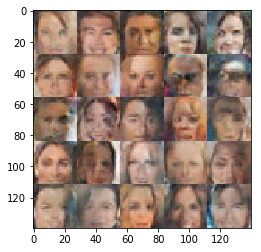

Epoch  2/5 Batch 2245/3166... Discriminator Loss: 1.2720... Generator Loss: 0.4564
Epoch  2/5 Batch 2255/3166... Discriminator Loss: 1.2724... Generator Loss: 0.7281
Epoch  2/5 Batch 2265/3166... Discriminator Loss: 0.9999... Generator Loss: 0.7793
Epoch  2/5 Batch 2275/3166... Discriminator Loss: 1.0802... Generator Loss: 0.9567
Epoch  2/5 Batch 2285/3166... Discriminator Loss: 1.7719... Generator Loss: 1.6509
Epoch  2/5 Batch 2295/3166... Discriminator Loss: 0.9562... Generator Loss: 0.9111
Epoch  2/5 Batch 2305/3166... Discriminator Loss: 1.3721... Generator Loss: 0.9273
Epoch  2/5 Batch 2315/3166... Discriminator Loss: 1.7380... Generator Loss: 0.3072
Epoch  2/5 Batch 2325/3166... Discriminator Loss: 0.5916... Generator Loss: 1.3917
Epoch  2/5 Batch 2335/3166... Discriminator Loss: 0.9778... Generator Loss: 1.0359


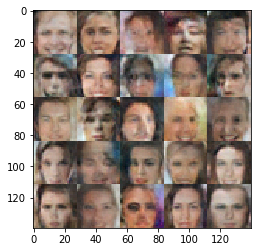

Epoch  2/5 Batch 2345/3166... Discriminator Loss: 1.2278... Generator Loss: 0.5550
Epoch  2/5 Batch 2355/3166... Discriminator Loss: 1.1926... Generator Loss: 0.5606
Epoch  2/5 Batch 2365/3166... Discriminator Loss: 1.5628... Generator Loss: 0.3677
Epoch  2/5 Batch 2375/3166... Discriminator Loss: 0.8898... Generator Loss: 1.3895
Epoch  2/5 Batch 2385/3166... Discriminator Loss: 1.3436... Generator Loss: 1.5889
Epoch  2/5 Batch 2395/3166... Discriminator Loss: 1.6098... Generator Loss: 0.3288
Epoch  2/5 Batch 2405/3166... Discriminator Loss: 0.9526... Generator Loss: 0.8535
Epoch  2/5 Batch 2415/3166... Discriminator Loss: 0.8884... Generator Loss: 1.7630
Epoch  2/5 Batch 2425/3166... Discriminator Loss: 1.1156... Generator Loss: 0.9467
Epoch  2/5 Batch 2435/3166... Discriminator Loss: 1.1407... Generator Loss: 1.3088


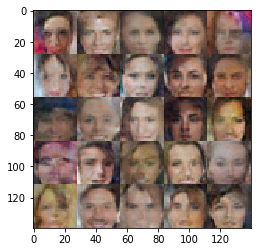

Epoch  2/5 Batch 2445/3166... Discriminator Loss: 1.6864... Generator Loss: 0.4381
Epoch  2/5 Batch 2455/3166... Discriminator Loss: 0.8382... Generator Loss: 1.1236
Epoch  2/5 Batch 2465/3166... Discriminator Loss: 0.9698... Generator Loss: 0.8153
Epoch  2/5 Batch 2475/3166... Discriminator Loss: 0.8638... Generator Loss: 1.3068
Epoch  2/5 Batch 2485/3166... Discriminator Loss: 1.0127... Generator Loss: 1.0781
Epoch  2/5 Batch 2495/3166... Discriminator Loss: 0.9147... Generator Loss: 1.1108
Epoch  2/5 Batch 2505/3166... Discriminator Loss: 1.5745... Generator Loss: 0.9064
Epoch  2/5 Batch 2515/3166... Discriminator Loss: 1.1490... Generator Loss: 0.5383
Epoch  2/5 Batch 2525/3166... Discriminator Loss: 0.8291... Generator Loss: 1.9913
Epoch  2/5 Batch 2535/3166... Discriminator Loss: 1.1271... Generator Loss: 0.8700


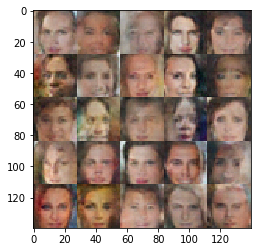

Epoch  2/5 Batch 2545/3166... Discriminator Loss: 1.1226... Generator Loss: 0.6451
Epoch  2/5 Batch 2555/3166... Discriminator Loss: 1.4127... Generator Loss: 0.4524
Epoch  2/5 Batch 2565/3166... Discriminator Loss: 1.5660... Generator Loss: 0.3727
Epoch  2/5 Batch 2575/3166... Discriminator Loss: 0.8996... Generator Loss: 1.0113
Epoch  2/5 Batch 2585/3166... Discriminator Loss: 0.6906... Generator Loss: 1.7347
Epoch  2/5 Batch 2595/3166... Discriminator Loss: 1.2758... Generator Loss: 0.5270
Epoch  2/5 Batch 2605/3166... Discriminator Loss: 0.5520... Generator Loss: 1.7116
Epoch  2/5 Batch 2615/3166... Discriminator Loss: 0.9260... Generator Loss: 2.0557
Epoch  2/5 Batch 2625/3166... Discriminator Loss: 0.9490... Generator Loss: 0.6481
Epoch  2/5 Batch 2635/3166... Discriminator Loss: 1.0619... Generator Loss: 1.7372


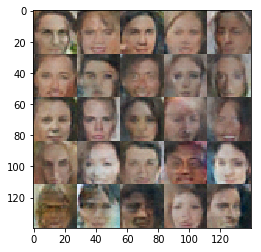

Epoch  2/5 Batch 2645/3166... Discriminator Loss: 1.5050... Generator Loss: 0.4992
Epoch  2/5 Batch 2655/3166... Discriminator Loss: 1.7945... Generator Loss: 0.3024
Epoch  2/5 Batch 2665/3166... Discriminator Loss: 1.0724... Generator Loss: 1.3066
Epoch  2/5 Batch 2675/3166... Discriminator Loss: 1.1126... Generator Loss: 0.7956
Epoch  2/5 Batch 2685/3166... Discriminator Loss: 1.0894... Generator Loss: 1.2039
Epoch  2/5 Batch 2695/3166... Discriminator Loss: 1.2511... Generator Loss: 0.6465
Epoch  2/5 Batch 2705/3166... Discriminator Loss: 1.6732... Generator Loss: 0.3446
Epoch  2/5 Batch 2715/3166... Discriminator Loss: 1.1458... Generator Loss: 0.9666
Epoch  2/5 Batch 2725/3166... Discriminator Loss: 1.3630... Generator Loss: 0.5200
Epoch  2/5 Batch 2735/3166... Discriminator Loss: 0.7255... Generator Loss: 1.0215


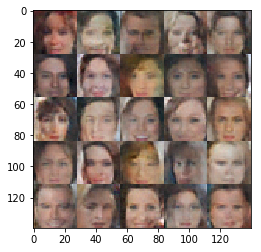

Epoch  2/5 Batch 2745/3166... Discriminator Loss: 0.9375... Generator Loss: 0.9451
Epoch  2/5 Batch 2755/3166... Discriminator Loss: 0.9386... Generator Loss: 1.1383
Epoch  2/5 Batch 2765/3166... Discriminator Loss: 0.6895... Generator Loss: 1.2452
Epoch  2/5 Batch 2775/3166... Discriminator Loss: 1.7635... Generator Loss: 0.3354
Epoch  2/5 Batch 2785/3166... Discriminator Loss: 0.9023... Generator Loss: 0.9307
Epoch  2/5 Batch 2795/3166... Discriminator Loss: 1.1495... Generator Loss: 0.6144
Epoch  2/5 Batch 2805/3166... Discriminator Loss: 1.3131... Generator Loss: 2.0986
Epoch  2/5 Batch 2815/3166... Discriminator Loss: 1.4203... Generator Loss: 0.4119
Epoch  2/5 Batch 2825/3166... Discriminator Loss: 0.8108... Generator Loss: 1.3842
Epoch  2/5 Batch 2835/3166... Discriminator Loss: 1.0050... Generator Loss: 1.6296


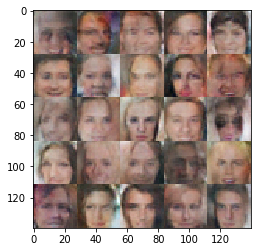

Epoch  2/5 Batch 2845/3166... Discriminator Loss: 0.7451... Generator Loss: 1.3794
Epoch  2/5 Batch 2855/3166... Discriminator Loss: 0.8549... Generator Loss: 0.8805
Epoch  2/5 Batch 2865/3166... Discriminator Loss: 1.6987... Generator Loss: 0.3158
Epoch  2/5 Batch 2875/3166... Discriminator Loss: 0.7448... Generator Loss: 1.6578
Epoch  2/5 Batch 2885/3166... Discriminator Loss: 1.3478... Generator Loss: 0.4142
Epoch  2/5 Batch 2895/3166... Discriminator Loss: 0.8753... Generator Loss: 1.0581
Epoch  2/5 Batch 2905/3166... Discriminator Loss: 0.9562... Generator Loss: 0.8077
Epoch  2/5 Batch 2915/3166... Discriminator Loss: 1.4647... Generator Loss: 1.7783
Epoch  2/5 Batch 2925/3166... Discriminator Loss: 1.1385... Generator Loss: 0.7425
Epoch  2/5 Batch 2935/3166... Discriminator Loss: 1.2431... Generator Loss: 2.0063


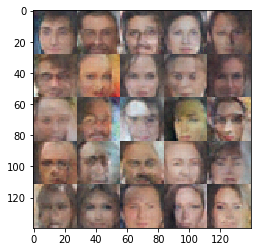

Epoch  2/5 Batch 2945/3166... Discriminator Loss: 1.0760... Generator Loss: 1.4380
Epoch  2/5 Batch 2955/3166... Discriminator Loss: 2.0300... Generator Loss: 0.2318
Epoch  2/5 Batch 2965/3166... Discriminator Loss: 1.1644... Generator Loss: 0.5914
Epoch  2/5 Batch 2975/3166... Discriminator Loss: 1.9554... Generator Loss: 0.3405
Epoch  2/5 Batch 2985/3166... Discriminator Loss: 1.1838... Generator Loss: 1.0476
Epoch  2/5 Batch 2995/3166... Discriminator Loss: 0.9017... Generator Loss: 1.2675
Epoch  2/5 Batch 3005/3166... Discriminator Loss: 1.8961... Generator Loss: 0.2417
Epoch  2/5 Batch 3015/3166... Discriminator Loss: 1.2734... Generator Loss: 0.7381
Epoch  2/5 Batch 3025/3166... Discriminator Loss: 1.2233... Generator Loss: 1.2578
Epoch  2/5 Batch 3035/3166... Discriminator Loss: 1.0410... Generator Loss: 0.7641


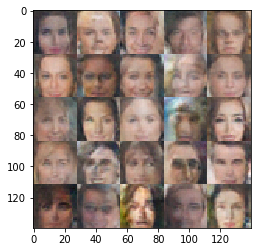

Epoch  2/5 Batch 3045/3166... Discriminator Loss: 0.5184... Generator Loss: 2.1346
Epoch  2/5 Batch 3055/3166... Discriminator Loss: 0.6658... Generator Loss: 1.7829
Epoch  2/5 Batch 3065/3166... Discriminator Loss: 0.8423... Generator Loss: 1.1648
Epoch  2/5 Batch 3075/3166... Discriminator Loss: 1.9265... Generator Loss: 0.2290
Epoch  2/5 Batch 3085/3166... Discriminator Loss: 1.2400... Generator Loss: 0.8118
Epoch  2/5 Batch 3095/3166... Discriminator Loss: 1.4368... Generator Loss: 0.4365
Epoch  2/5 Batch 3105/3166... Discriminator Loss: 1.7136... Generator Loss: 0.4840
Epoch  2/5 Batch 3115/3166... Discriminator Loss: 0.8009... Generator Loss: 2.2137
Epoch  2/5 Batch 3125/3166... Discriminator Loss: 1.1450... Generator Loss: 1.3045
Epoch  2/5 Batch 3135/3166... Discriminator Loss: 1.4086... Generator Loss: 0.5827


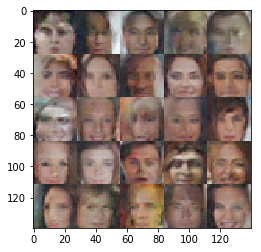

Epoch  2/5 Batch 3145/3166... Discriminator Loss: 1.1123... Generator Loss: 0.6062
Epoch  2/5 Batch 3155/3166... Discriminator Loss: 1.8581... Generator Loss: 0.3084
Epoch  2/5 Batch 3165/3166... Discriminator Loss: 1.6228... Generator Loss: 0.3415
Epoch  3/5 Batch   10/3166... Discriminator Loss: 0.8287... Generator Loss: 1.4521
Epoch  3/5 Batch   20/3166... Discriminator Loss: 1.4389... Generator Loss: 0.6493
Epoch  3/5 Batch   30/3166... Discriminator Loss: 0.8667... Generator Loss: 2.9988
Epoch  3/5 Batch   40/3166... Discriminator Loss: 0.8705... Generator Loss: 0.7126
Epoch  3/5 Batch   50/3166... Discriminator Loss: 1.0338... Generator Loss: 0.7677
Epoch  3/5 Batch   60/3166... Discriminator Loss: 0.5777... Generator Loss: 1.2195
Epoch  3/5 Batch   70/3166... Discriminator Loss: 1.3420... Generator Loss: 0.4464


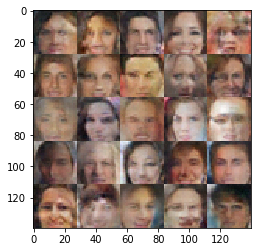

Epoch  3/5 Batch   80/3166... Discriminator Loss: 1.4519... Generator Loss: 1.6213
Epoch  3/5 Batch   90/3166... Discriminator Loss: 1.1747... Generator Loss: 1.0762
Epoch  3/5 Batch  100/3166... Discriminator Loss: 1.5663... Generator Loss: 0.4221
Epoch  3/5 Batch  110/3166... Discriminator Loss: 0.7220... Generator Loss: 1.2094
Epoch  3/5 Batch  120/3166... Discriminator Loss: 0.9650... Generator Loss: 0.7785
Epoch  3/5 Batch  130/3166... Discriminator Loss: 2.2153... Generator Loss: 0.5988
Epoch  3/5 Batch  140/3166... Discriminator Loss: 1.0856... Generator Loss: 1.6369
Epoch  3/5 Batch  150/3166... Discriminator Loss: 0.9044... Generator Loss: 1.2223
Epoch  3/5 Batch  160/3166... Discriminator Loss: 0.9207... Generator Loss: 0.8561
Epoch  3/5 Batch  170/3166... Discriminator Loss: 0.6974... Generator Loss: 1.2199


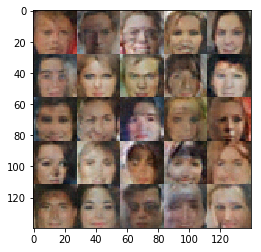

Epoch  3/5 Batch  180/3166... Discriminator Loss: 0.7531... Generator Loss: 1.6760
Epoch  3/5 Batch  190/3166... Discriminator Loss: 1.0285... Generator Loss: 0.8197
Epoch  3/5 Batch  200/3166... Discriminator Loss: 1.3482... Generator Loss: 0.5943
Epoch  3/5 Batch  210/3166... Discriminator Loss: 2.0830... Generator Loss: 0.2216
Epoch  3/5 Batch  220/3166... Discriminator Loss: 0.8877... Generator Loss: 1.7670
Epoch  3/5 Batch  230/3166... Discriminator Loss: 0.8319... Generator Loss: 0.9646
Epoch  3/5 Batch  240/3166... Discriminator Loss: 1.0907... Generator Loss: 0.9664
Epoch  3/5 Batch  250/3166... Discriminator Loss: 1.1617... Generator Loss: 0.6225
Epoch  3/5 Batch  260/3166... Discriminator Loss: 1.6327... Generator Loss: 1.1514
Epoch  3/5 Batch  270/3166... Discriminator Loss: 0.8671... Generator Loss: 0.9067


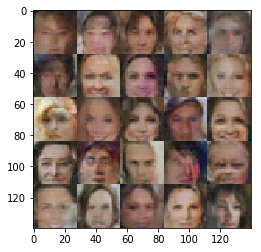

Epoch  3/5 Batch  280/3166... Discriminator Loss: 1.3609... Generator Loss: 0.4320
Epoch  3/5 Batch  290/3166... Discriminator Loss: 1.3975... Generator Loss: 0.5411
Epoch  3/5 Batch  300/3166... Discriminator Loss: 1.6818... Generator Loss: 0.3887
Epoch  3/5 Batch  310/3166... Discriminator Loss: 0.9301... Generator Loss: 1.0009
Epoch  3/5 Batch  320/3166... Discriminator Loss: 1.2824... Generator Loss: 0.5537
Epoch  3/5 Batch  330/3166... Discriminator Loss: 1.5893... Generator Loss: 0.3811
Epoch  3/5 Batch  340/3166... Discriminator Loss: 1.1537... Generator Loss: 1.4421
Epoch  3/5 Batch  350/3166... Discriminator Loss: 0.8215... Generator Loss: 1.1167
Epoch  3/5 Batch  360/3166... Discriminator Loss: 1.6359... Generator Loss: 0.4635
Epoch  3/5 Batch  370/3166... Discriminator Loss: 1.0086... Generator Loss: 0.7541


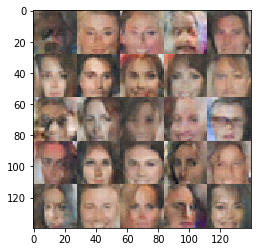

Epoch  3/5 Batch  380/3166... Discriminator Loss: 0.9394... Generator Loss: 0.9212
Epoch  3/5 Batch  390/3166... Discriminator Loss: 0.8569... Generator Loss: 1.0807
Epoch  3/5 Batch  400/3166... Discriminator Loss: 1.5905... Generator Loss: 0.3583
Epoch  3/5 Batch  410/3166... Discriminator Loss: 0.8533... Generator Loss: 1.1711
Epoch  3/5 Batch  420/3166... Discriminator Loss: 1.1031... Generator Loss: 0.7383
Epoch  3/5 Batch  430/3166... Discriminator Loss: 1.2891... Generator Loss: 0.5568
Epoch  3/5 Batch  440/3166... Discriminator Loss: 1.6515... Generator Loss: 1.1285
Epoch  3/5 Batch  450/3166... Discriminator Loss: 0.8816... Generator Loss: 1.1288
Epoch  3/5 Batch  460/3166... Discriminator Loss: 1.2845... Generator Loss: 1.0038
Epoch  3/5 Batch  470/3166... Discriminator Loss: 1.5221... Generator Loss: 0.4549


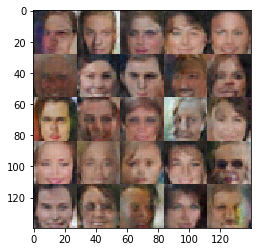

Epoch  3/5 Batch  480/3166... Discriminator Loss: 1.5148... Generator Loss: 1.7844
Epoch  3/5 Batch  490/3166... Discriminator Loss: 0.9098... Generator Loss: 1.2999
Epoch  3/5 Batch  500/3166... Discriminator Loss: 1.0358... Generator Loss: 0.8344
Epoch  3/5 Batch  510/3166... Discriminator Loss: 1.0824... Generator Loss: 1.6912
Epoch  3/5 Batch  520/3166... Discriminator Loss: 1.1898... Generator Loss: 0.5355
Epoch  3/5 Batch  530/3166... Discriminator Loss: 1.3341... Generator Loss: 1.7170
Epoch  3/5 Batch  540/3166... Discriminator Loss: 1.3034... Generator Loss: 0.4823
Epoch  3/5 Batch  550/3166... Discriminator Loss: 1.2208... Generator Loss: 0.8487
Epoch  3/5 Batch  560/3166... Discriminator Loss: 1.2884... Generator Loss: 0.6362
Epoch  3/5 Batch  570/3166... Discriminator Loss: 0.9531... Generator Loss: 1.4896


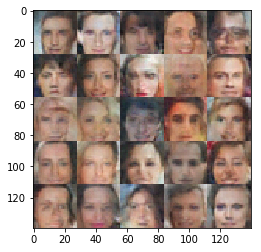

Epoch  3/5 Batch  580/3166... Discriminator Loss: 1.0557... Generator Loss: 0.8168
Epoch  3/5 Batch  590/3166... Discriminator Loss: 1.1314... Generator Loss: 0.9950
Epoch  3/5 Batch  600/3166... Discriminator Loss: 1.0029... Generator Loss: 1.8199
Epoch  3/5 Batch  610/3166... Discriminator Loss: 0.7745... Generator Loss: 1.8119
Epoch  3/5 Batch  620/3166... Discriminator Loss: 1.1065... Generator Loss: 0.9371
Epoch  3/5 Batch  630/3166... Discriminator Loss: 1.5457... Generator Loss: 1.0246
Epoch  3/5 Batch  640/3166... Discriminator Loss: 1.3649... Generator Loss: 0.5659
Epoch  3/5 Batch  650/3166... Discriminator Loss: 1.2366... Generator Loss: 0.5583
Epoch  3/5 Batch  660/3166... Discriminator Loss: 1.2216... Generator Loss: 1.2933
Epoch  3/5 Batch  670/3166... Discriminator Loss: 1.2470... Generator Loss: 0.6951


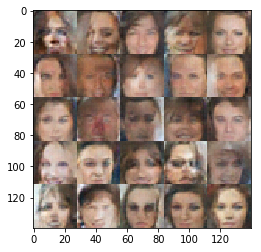

Epoch  3/5 Batch  680/3166... Discriminator Loss: 1.0547... Generator Loss: 0.7852
Epoch  3/5 Batch  690/3166... Discriminator Loss: 0.9719... Generator Loss: 1.2238
Epoch  3/5 Batch  700/3166... Discriminator Loss: 1.1416... Generator Loss: 2.1205
Epoch  3/5 Batch  710/3166... Discriminator Loss: 1.2161... Generator Loss: 1.6715
Epoch  3/5 Batch  720/3166... Discriminator Loss: 1.5050... Generator Loss: 1.1550
Epoch  3/5 Batch  730/3166... Discriminator Loss: 0.7909... Generator Loss: 1.9332
Epoch  3/5 Batch  740/3166... Discriminator Loss: 1.5463... Generator Loss: 0.9348
Epoch  3/5 Batch  750/3166... Discriminator Loss: 1.9529... Generator Loss: 1.3733
Epoch  3/5 Batch  760/3166... Discriminator Loss: 0.6492... Generator Loss: 1.3163
Epoch  3/5 Batch  770/3166... Discriminator Loss: 1.2200... Generator Loss: 0.6561


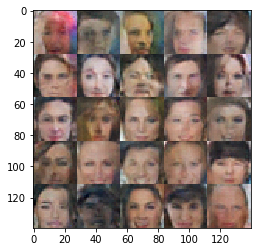

Epoch  3/5 Batch  780/3166... Discriminator Loss: 1.2891... Generator Loss: 0.5618
Epoch  3/5 Batch  790/3166... Discriminator Loss: 0.8419... Generator Loss: 0.9162
Epoch  3/5 Batch  800/3166... Discriminator Loss: 1.2944... Generator Loss: 0.6594
Epoch  3/5 Batch  810/3166... Discriminator Loss: 2.1077... Generator Loss: 0.1929
Epoch  3/5 Batch  820/3166... Discriminator Loss: 1.2492... Generator Loss: 0.8091
Epoch  3/5 Batch  830/3166... Discriminator Loss: 1.1205... Generator Loss: 0.6481
Epoch  3/5 Batch  840/3166... Discriminator Loss: 1.1175... Generator Loss: 0.7919
Epoch  3/5 Batch  850/3166... Discriminator Loss: 1.0470... Generator Loss: 0.7210
Epoch  3/5 Batch  860/3166... Discriminator Loss: 1.4287... Generator Loss: 2.0666
Epoch  3/5 Batch  870/3166... Discriminator Loss: 0.9843... Generator Loss: 0.9155


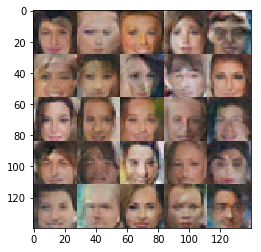

Epoch  3/5 Batch  880/3166... Discriminator Loss: 1.2994... Generator Loss: 0.8906
Epoch  3/5 Batch  890/3166... Discriminator Loss: 1.4724... Generator Loss: 1.8505
Epoch  3/5 Batch  900/3166... Discriminator Loss: 1.0291... Generator Loss: 0.9281
Epoch  3/5 Batch  910/3166... Discriminator Loss: 0.9087... Generator Loss: 2.3790
Epoch  3/5 Batch  920/3166... Discriminator Loss: 0.8097... Generator Loss: 0.9287
Epoch  3/5 Batch  930/3166... Discriminator Loss: 0.9638... Generator Loss: 0.9748
Epoch  3/5 Batch  940/3166... Discriminator Loss: 0.7903... Generator Loss: 1.1209
Epoch  3/5 Batch  950/3166... Discriminator Loss: 1.6023... Generator Loss: 0.3190
Epoch  3/5 Batch  960/3166... Discriminator Loss: 1.3157... Generator Loss: 0.5057
Epoch  3/5 Batch  970/3166... Discriminator Loss: 0.9790... Generator Loss: 0.6998


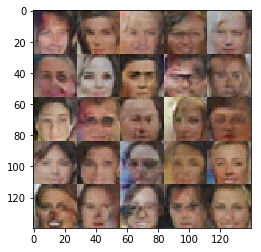

Epoch  3/5 Batch  980/3166... Discriminator Loss: 1.2203... Generator Loss: 0.5963
Epoch  3/5 Batch  990/3166... Discriminator Loss: 1.1653... Generator Loss: 1.0748
Epoch  3/5 Batch 1000/3166... Discriminator Loss: 1.1693... Generator Loss: 0.5205
Epoch  3/5 Batch 1010/3166... Discriminator Loss: 1.3538... Generator Loss: 0.4611
Epoch  3/5 Batch 1020/3166... Discriminator Loss: 1.1156... Generator Loss: 0.9884
Epoch  3/5 Batch 1030/3166... Discriminator Loss: 0.8576... Generator Loss: 0.9106
Epoch  3/5 Batch 1040/3166... Discriminator Loss: 0.6703... Generator Loss: 1.3873
Epoch  3/5 Batch 1050/3166... Discriminator Loss: 1.3937... Generator Loss: 0.4363
Epoch  3/5 Batch 1060/3166... Discriminator Loss: 1.0140... Generator Loss: 0.8445
Epoch  3/5 Batch 1070/3166... Discriminator Loss: 0.7983... Generator Loss: 0.9541


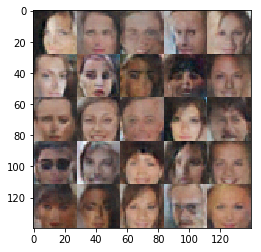

Epoch  3/5 Batch 1080/3166... Discriminator Loss: 0.9498... Generator Loss: 1.2994
Epoch  3/5 Batch 1090/3166... Discriminator Loss: 1.3593... Generator Loss: 0.3966
Epoch  3/5 Batch 1100/3166... Discriminator Loss: 1.8044... Generator Loss: 0.2655
Epoch  3/5 Batch 1110/3166... Discriminator Loss: 1.3524... Generator Loss: 0.5932
Epoch  3/5 Batch 1120/3166... Discriminator Loss: 0.9841... Generator Loss: 0.8025
Epoch  3/5 Batch 1130/3166... Discriminator Loss: 1.0718... Generator Loss: 0.7358
Epoch  3/5 Batch 1140/3166... Discriminator Loss: 1.0614... Generator Loss: 1.4891
Epoch  3/5 Batch 1150/3166... Discriminator Loss: 0.8212... Generator Loss: 1.4153
Epoch  3/5 Batch 1160/3166... Discriminator Loss: 0.8043... Generator Loss: 1.5763
Epoch  3/5 Batch 1170/3166... Discriminator Loss: 0.8874... Generator Loss: 1.4371


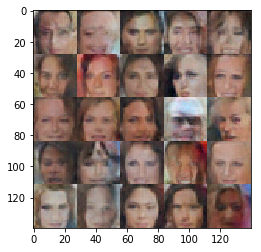

Epoch  3/5 Batch 1180/3166... Discriminator Loss: 0.7594... Generator Loss: 0.8559
Epoch  3/5 Batch 1190/3166... Discriminator Loss: 1.5431... Generator Loss: 0.8988
Epoch  3/5 Batch 1200/3166... Discriminator Loss: 1.0868... Generator Loss: 1.1191
Epoch  3/5 Batch 1210/3166... Discriminator Loss: 1.5009... Generator Loss: 0.3676
Epoch  3/5 Batch 1220/3166... Discriminator Loss: 0.8994... Generator Loss: 2.2435
Epoch  3/5 Batch 1230/3166... Discriminator Loss: 1.8146... Generator Loss: 0.2734
Epoch  3/5 Batch 1240/3166... Discriminator Loss: 1.4594... Generator Loss: 1.1510
Epoch  3/5 Batch 1250/3166... Discriminator Loss: 0.8092... Generator Loss: 1.2596
Epoch  3/5 Batch 1260/3166... Discriminator Loss: 1.0698... Generator Loss: 0.7867
Epoch  3/5 Batch 1270/3166... Discriminator Loss: 0.7677... Generator Loss: 1.2428


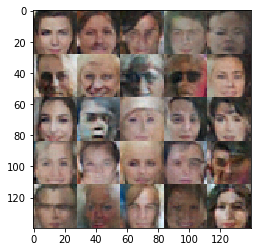

Epoch  3/5 Batch 1280/3166... Discriminator Loss: 0.8703... Generator Loss: 1.1190
Epoch  3/5 Batch 1290/3166... Discriminator Loss: 1.1001... Generator Loss: 0.7709
Epoch  3/5 Batch 1300/3166... Discriminator Loss: 1.5082... Generator Loss: 0.4650
Epoch  3/5 Batch 1310/3166... Discriminator Loss: 1.0024... Generator Loss: 0.9304
Epoch  3/5 Batch 1320/3166... Discriminator Loss: 1.4263... Generator Loss: 0.6127
Epoch  3/5 Batch 1330/3166... Discriminator Loss: 1.1238... Generator Loss: 0.8650
Epoch  3/5 Batch 1340/3166... Discriminator Loss: 1.0901... Generator Loss: 0.8035
Epoch  3/5 Batch 1350/3166... Discriminator Loss: 0.6952... Generator Loss: 1.3478
Epoch  3/5 Batch 1360/3166... Discriminator Loss: 0.9560... Generator Loss: 0.9622
Epoch  3/5 Batch 1370/3166... Discriminator Loss: 1.0476... Generator Loss: 0.8950


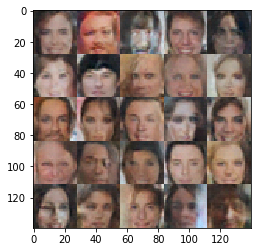

Epoch  3/5 Batch 1380/3166... Discriminator Loss: 1.0341... Generator Loss: 0.5900
Epoch  3/5 Batch 1390/3166... Discriminator Loss: 1.1753... Generator Loss: 1.4184
Epoch  3/5 Batch 1400/3166... Discriminator Loss: 0.8098... Generator Loss: 1.0891
Epoch  3/5 Batch 1410/3166... Discriminator Loss: 0.9367... Generator Loss: 0.7699
Epoch  3/5 Batch 1420/3166... Discriminator Loss: 0.7675... Generator Loss: 1.2765
Epoch  3/5 Batch 1430/3166... Discriminator Loss: 1.2467... Generator Loss: 0.6146
Epoch  3/5 Batch 1440/3166... Discriminator Loss: 0.5044... Generator Loss: 2.0264
Epoch  3/5 Batch 1450/3166... Discriminator Loss: 1.1961... Generator Loss: 0.8121
Epoch  3/5 Batch 1460/3166... Discriminator Loss: 0.9820... Generator Loss: 1.0474
Epoch  3/5 Batch 1470/3166... Discriminator Loss: 0.5755... Generator Loss: 2.2861


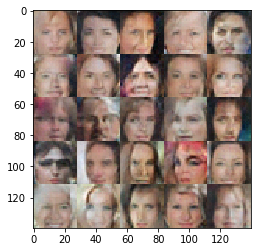

Epoch  3/5 Batch 1480/3166... Discriminator Loss: 2.2947... Generator Loss: 2.9564
Epoch  3/5 Batch 1490/3166... Discriminator Loss: 0.9890... Generator Loss: 1.2028
Epoch  3/5 Batch 1500/3166... Discriminator Loss: 1.1488... Generator Loss: 1.8191
Epoch  3/5 Batch 1510/3166... Discriminator Loss: 0.9092... Generator Loss: 0.8572
Epoch  3/5 Batch 1520/3166... Discriminator Loss: 0.6478... Generator Loss: 1.4656
Epoch  3/5 Batch 1530/3166... Discriminator Loss: 1.2981... Generator Loss: 1.3080
Epoch  3/5 Batch 1540/3166... Discriminator Loss: 0.7761... Generator Loss: 1.0728
Epoch  3/5 Batch 1550/3166... Discriminator Loss: 2.0047... Generator Loss: 1.6504
Epoch  3/5 Batch 1560/3166... Discriminator Loss: 1.7678... Generator Loss: 0.2758
Epoch  3/5 Batch 1570/3166... Discriminator Loss: 1.0385... Generator Loss: 2.7120


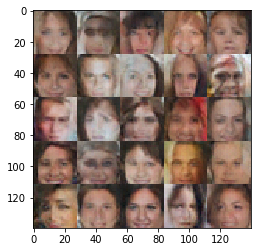

Epoch  3/5 Batch 1580/3166... Discriminator Loss: 1.0170... Generator Loss: 1.0043
Epoch  3/5 Batch 1590/3166... Discriminator Loss: 1.7618... Generator Loss: 0.7009
Epoch  3/5 Batch 1600/3166... Discriminator Loss: 0.8801... Generator Loss: 1.0765
Epoch  3/5 Batch 1610/3166... Discriminator Loss: 1.0644... Generator Loss: 1.4179
Epoch  3/5 Batch 1620/3166... Discriminator Loss: 0.8621... Generator Loss: 0.7746
Epoch  3/5 Batch 1630/3166... Discriminator Loss: 1.2075... Generator Loss: 1.2837
Epoch  3/5 Batch 1640/3166... Discriminator Loss: 0.9076... Generator Loss: 1.0769
Epoch  3/5 Batch 1650/3166... Discriminator Loss: 0.7563... Generator Loss: 0.9644
Epoch  3/5 Batch 1660/3166... Discriminator Loss: 1.4040... Generator Loss: 0.4167
Epoch  3/5 Batch 1670/3166... Discriminator Loss: 1.0632... Generator Loss: 0.7211


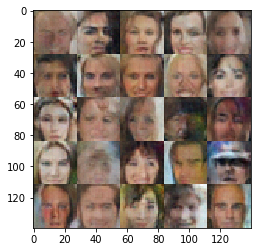

Epoch  3/5 Batch 1680/3166... Discriminator Loss: 1.2368... Generator Loss: 0.7275
Epoch  3/5 Batch 1690/3166... Discriminator Loss: 1.0880... Generator Loss: 0.7695
Epoch  3/5 Batch 1700/3166... Discriminator Loss: 1.0290... Generator Loss: 0.6648
Epoch  3/5 Batch 1710/3166... Discriminator Loss: 0.8097... Generator Loss: 1.0788
Epoch  3/5 Batch 1720/3166... Discriminator Loss: 0.9322... Generator Loss: 1.7813
Epoch  3/5 Batch 1730/3166... Discriminator Loss: 2.2993... Generator Loss: 0.2114
Epoch  3/5 Batch 1740/3166... Discriminator Loss: 0.9436... Generator Loss: 1.2293
Epoch  3/5 Batch 1750/3166... Discriminator Loss: 1.6564... Generator Loss: 0.2739
Epoch  3/5 Batch 1760/3166... Discriminator Loss: 1.4906... Generator Loss: 0.4701
Epoch  3/5 Batch 1770/3166... Discriminator Loss: 1.2264... Generator Loss: 0.8971


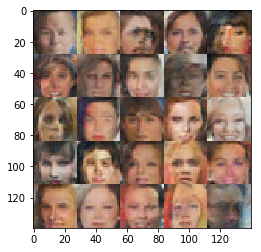

Epoch  3/5 Batch 1780/3166... Discriminator Loss: 0.7175... Generator Loss: 1.2022
Epoch  3/5 Batch 1790/3166... Discriminator Loss: 1.0727... Generator Loss: 0.6464
Epoch  3/5 Batch 1800/3166... Discriminator Loss: 1.7918... Generator Loss: 0.2863
Epoch  3/5 Batch 1810/3166... Discriminator Loss: 0.6759... Generator Loss: 1.3290
Epoch  3/5 Batch 1820/3166... Discriminator Loss: 1.3473... Generator Loss: 1.3426
Epoch  3/5 Batch 1830/3166... Discriminator Loss: 2.8440... Generator Loss: 1.2857
Epoch  3/5 Batch 1840/3166... Discriminator Loss: 1.2759... Generator Loss: 0.4866
Epoch  3/5 Batch 1850/3166... Discriminator Loss: 1.4108... Generator Loss: 0.4449
Epoch  3/5 Batch 1860/3166... Discriminator Loss: 1.3921... Generator Loss: 0.4806
Epoch  3/5 Batch 1870/3166... Discriminator Loss: 0.8299... Generator Loss: 2.3173


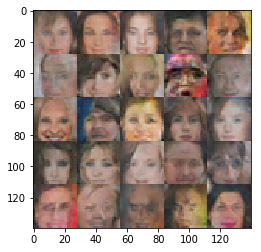

Epoch  3/5 Batch 1880/3166... Discriminator Loss: 1.1011... Generator Loss: 1.1509
Epoch  3/5 Batch 1890/3166... Discriminator Loss: 1.4962... Generator Loss: 0.4195
Epoch  3/5 Batch 1900/3166... Discriminator Loss: 1.6949... Generator Loss: 0.4306
Epoch  3/5 Batch 1910/3166... Discriminator Loss: 1.3290... Generator Loss: 0.6135
Epoch  3/5 Batch 1920/3166... Discriminator Loss: 1.1284... Generator Loss: 0.6406
Epoch  3/5 Batch 1930/3166... Discriminator Loss: 1.2097... Generator Loss: 0.7359
Epoch  3/5 Batch 1940/3166... Discriminator Loss: 1.1171... Generator Loss: 0.7722
Epoch  3/5 Batch 1950/3166... Discriminator Loss: 1.4418... Generator Loss: 2.3133
Epoch  3/5 Batch 1960/3166... Discriminator Loss: 1.3070... Generator Loss: 0.4366
Epoch  3/5 Batch 1970/3166... Discriminator Loss: 0.8281... Generator Loss: 0.8357


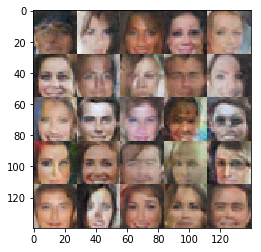

Epoch  3/5 Batch 1980/3166... Discriminator Loss: 1.1275... Generator Loss: 1.3603
Epoch  3/5 Batch 1990/3166... Discriminator Loss: 1.3744... Generator Loss: 2.9110
Epoch  3/5 Batch 2000/3166... Discriminator Loss: 1.8825... Generator Loss: 0.2897
Epoch  3/5 Batch 2010/3166... Discriminator Loss: 1.5500... Generator Loss: 0.4374
Epoch  3/5 Batch 2020/3166... Discriminator Loss: 1.4539... Generator Loss: 0.7402
Epoch  3/5 Batch 2030/3166... Discriminator Loss: 1.1826... Generator Loss: 1.2172
Epoch  3/5 Batch 2040/3166... Discriminator Loss: 1.0921... Generator Loss: 1.5318
Epoch  3/5 Batch 2050/3166... Discriminator Loss: 1.3434... Generator Loss: 0.9587
Epoch  3/5 Batch 2060/3166... Discriminator Loss: 1.8757... Generator Loss: 1.2438
Epoch  3/5 Batch 2070/3166... Discriminator Loss: 1.6708... Generator Loss: 0.3384


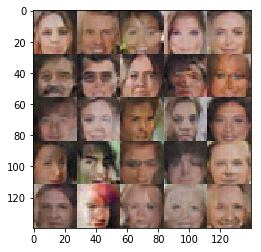

Epoch  3/5 Batch 2080/3166... Discriminator Loss: 1.0581... Generator Loss: 0.7393
Epoch  3/5 Batch 2090/3166... Discriminator Loss: 1.1568... Generator Loss: 0.7742
Epoch  3/5 Batch 2100/3166... Discriminator Loss: 1.3572... Generator Loss: 0.7695
Epoch  3/5 Batch 2110/3166... Discriminator Loss: 1.3069... Generator Loss: 0.5097
Epoch  3/5 Batch 2120/3166... Discriminator Loss: 0.8842... Generator Loss: 0.9655
Epoch  3/5 Batch 2130/3166... Discriminator Loss: 1.9290... Generator Loss: 0.2182
Epoch  3/5 Batch 2140/3166... Discriminator Loss: 1.2275... Generator Loss: 0.6550
Epoch  3/5 Batch 2150/3166... Discriminator Loss: 1.0850... Generator Loss: 1.2473
Epoch  3/5 Batch 2160/3166... Discriminator Loss: 1.3721... Generator Loss: 1.0841
Epoch  3/5 Batch 2170/3166... Discriminator Loss: 1.0328... Generator Loss: 0.8603


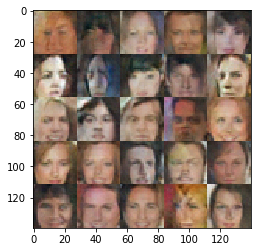

Epoch  3/5 Batch 2180/3166... Discriminator Loss: 1.3564... Generator Loss: 0.4703
Epoch  3/5 Batch 2190/3166... Discriminator Loss: 1.5165... Generator Loss: 0.5358
Epoch  3/5 Batch 2200/3166... Discriminator Loss: 1.2854... Generator Loss: 0.5783
Epoch  3/5 Batch 2210/3166... Discriminator Loss: 1.0638... Generator Loss: 0.6281
Epoch  3/5 Batch 2220/3166... Discriminator Loss: 1.7397... Generator Loss: 0.3009
Epoch  3/5 Batch 2230/3166... Discriminator Loss: 1.1399... Generator Loss: 0.5677
Epoch  3/5 Batch 2240/3166... Discriminator Loss: 1.2958... Generator Loss: 0.5249
Epoch  3/5 Batch 2250/3166... Discriminator Loss: 1.1062... Generator Loss: 0.6590
Epoch  3/5 Batch 2260/3166... Discriminator Loss: 1.1668... Generator Loss: 0.5784
Epoch  3/5 Batch 2270/3166... Discriminator Loss: 2.2124... Generator Loss: 0.1715


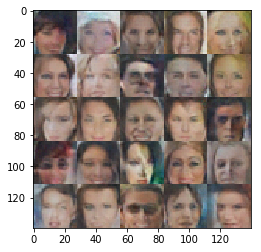

Epoch  3/5 Batch 2280/3166... Discriminator Loss: 0.9800... Generator Loss: 1.9190
Epoch  3/5 Batch 2290/3166... Discriminator Loss: 0.9375... Generator Loss: 1.6810
Epoch  3/5 Batch 2300/3166... Discriminator Loss: 0.9342... Generator Loss: 1.1787
Epoch  3/5 Batch 2310/3166... Discriminator Loss: 1.4839... Generator Loss: 0.5737
Epoch  3/5 Batch 2320/3166... Discriminator Loss: 1.5926... Generator Loss: 0.3553
Epoch  3/5 Batch 2330/3166... Discriminator Loss: 1.1618... Generator Loss: 0.6755
Epoch  3/5 Batch 2340/3166... Discriminator Loss: 1.1388... Generator Loss: 0.7109
Epoch  3/5 Batch 2350/3166... Discriminator Loss: 1.2796... Generator Loss: 0.4820
Epoch  3/5 Batch 2360/3166... Discriminator Loss: 0.9795... Generator Loss: 1.1350
Epoch  3/5 Batch 2370/3166... Discriminator Loss: 0.9863... Generator Loss: 0.9488


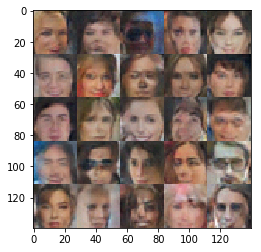

Epoch  3/5 Batch 2380/3166... Discriminator Loss: 1.6134... Generator Loss: 0.3139
Epoch  3/5 Batch 2390/3166... Discriminator Loss: 0.8198... Generator Loss: 1.1520
Epoch  3/5 Batch 2400/3166... Discriminator Loss: 1.3369... Generator Loss: 1.1978
Epoch  3/5 Batch 2410/3166... Discriminator Loss: 2.2235... Generator Loss: 0.1865
Epoch  3/5 Batch 2420/3166... Discriminator Loss: 0.7550... Generator Loss: 1.8937
Epoch  3/5 Batch 2430/3166... Discriminator Loss: 1.0062... Generator Loss: 0.7164
Epoch  3/5 Batch 2440/3166... Discriminator Loss: 1.1148... Generator Loss: 1.7567
Epoch  3/5 Batch 2450/3166... Discriminator Loss: 1.6445... Generator Loss: 2.6688
Epoch  3/5 Batch 2460/3166... Discriminator Loss: 1.2432... Generator Loss: 0.6467
Epoch  3/5 Batch 2470/3166... Discriminator Loss: 1.7544... Generator Loss: 2.1008


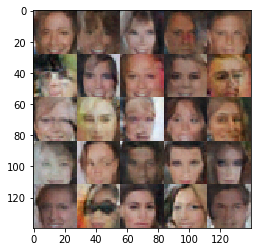

Epoch  3/5 Batch 2480/3166... Discriminator Loss: 1.1265... Generator Loss: 1.2573
Epoch  3/5 Batch 2490/3166... Discriminator Loss: 1.7913... Generator Loss: 0.3174
Epoch  3/5 Batch 2500/3166... Discriminator Loss: 1.0442... Generator Loss: 0.9880
Epoch  3/5 Batch 2510/3166... Discriminator Loss: 1.2512... Generator Loss: 0.5093
Epoch  3/5 Batch 2520/3166... Discriminator Loss: 1.2671... Generator Loss: 1.1146
Epoch  3/5 Batch 2530/3166... Discriminator Loss: 1.2741... Generator Loss: 0.5519
Epoch  3/5 Batch 2540/3166... Discriminator Loss: 1.0899... Generator Loss: 1.1027
Epoch  3/5 Batch 2550/3166... Discriminator Loss: 1.2250... Generator Loss: 0.8420
Epoch  3/5 Batch 2560/3166... Discriminator Loss: 0.9516... Generator Loss: 1.0853
Epoch  3/5 Batch 2570/3166... Discriminator Loss: 1.1707... Generator Loss: 0.5993


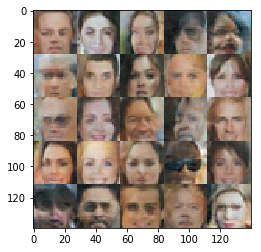

Epoch  3/5 Batch 2580/3166... Discriminator Loss: 1.1678... Generator Loss: 1.3433
Epoch  3/5 Batch 2590/3166... Discriminator Loss: 1.2915... Generator Loss: 0.6535
Epoch  3/5 Batch 2600/3166... Discriminator Loss: 1.3219... Generator Loss: 0.7560
Epoch  3/5 Batch 2610/3166... Discriminator Loss: 0.8992... Generator Loss: 1.6441
Epoch  3/5 Batch 2620/3166... Discriminator Loss: 1.4737... Generator Loss: 0.9274
Epoch  3/5 Batch 2630/3166... Discriminator Loss: 1.1165... Generator Loss: 0.5963
Epoch  3/5 Batch 2640/3166... Discriminator Loss: 1.2542... Generator Loss: 0.8680
Epoch  3/5 Batch 2650/3166... Discriminator Loss: 1.3135... Generator Loss: 0.5382
Epoch  3/5 Batch 2660/3166... Discriminator Loss: 1.3796... Generator Loss: 1.1634
Epoch  3/5 Batch 2670/3166... Discriminator Loss: 1.0999... Generator Loss: 1.6613


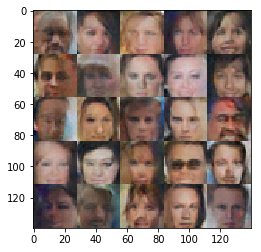

Epoch  3/5 Batch 2680/3166... Discriminator Loss: 1.3314... Generator Loss: 0.7051
Epoch  3/5 Batch 2690/3166... Discriminator Loss: 0.6396... Generator Loss: 1.2278
Epoch  3/5 Batch 2700/3166... Discriminator Loss: 1.6388... Generator Loss: 0.3399
Epoch  3/5 Batch 2710/3166... Discriminator Loss: 0.9939... Generator Loss: 0.8614
Epoch  3/5 Batch 2720/3166... Discriminator Loss: 1.2610... Generator Loss: 0.5420
Epoch  3/5 Batch 2730/3166... Discriminator Loss: 1.1872... Generator Loss: 0.5169
Epoch  3/5 Batch 2740/3166... Discriminator Loss: 1.6970... Generator Loss: 0.6462
Epoch  3/5 Batch 2750/3166... Discriminator Loss: 1.3342... Generator Loss: 0.6206
Epoch  3/5 Batch 2760/3166... Discriminator Loss: 1.6612... Generator Loss: 0.3668
Epoch  3/5 Batch 2770/3166... Discriminator Loss: 1.2148... Generator Loss: 0.7549


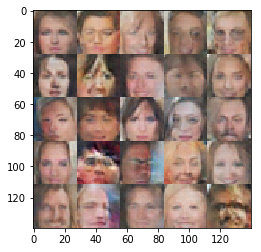

Epoch  3/5 Batch 2780/3166... Discriminator Loss: 0.7631... Generator Loss: 1.7529
Epoch  3/5 Batch 2790/3166... Discriminator Loss: 1.0460... Generator Loss: 1.7646
Epoch  3/5 Batch 2800/3166... Discriminator Loss: 0.9344... Generator Loss: 1.0653
Epoch  3/5 Batch 2810/3166... Discriminator Loss: 1.0418... Generator Loss: 0.9144
Epoch  3/5 Batch 2820/3166... Discriminator Loss: 1.2413... Generator Loss: 0.5504
Epoch  3/5 Batch 2830/3166... Discriminator Loss: 0.8902... Generator Loss: 1.3347
Epoch  3/5 Batch 2840/3166... Discriminator Loss: 1.2669... Generator Loss: 0.4965
Epoch  3/5 Batch 2850/3166... Discriminator Loss: 1.0437... Generator Loss: 0.8552
Epoch  3/5 Batch 2860/3166... Discriminator Loss: 1.0011... Generator Loss: 0.7938
Epoch  3/5 Batch 2870/3166... Discriminator Loss: 1.7985... Generator Loss: 0.8224


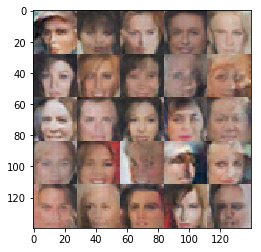

Epoch  3/5 Batch 2880/3166... Discriminator Loss: 0.9843... Generator Loss: 0.7987
Epoch  3/5 Batch 2890/3166... Discriminator Loss: 1.0665... Generator Loss: 0.8717
Epoch  3/5 Batch 2900/3166... Discriminator Loss: 1.2989... Generator Loss: 0.6581
Epoch  3/5 Batch 2910/3166... Discriminator Loss: 1.7565... Generator Loss: 0.2730
Epoch  3/5 Batch 2920/3166... Discriminator Loss: 1.2386... Generator Loss: 0.5673
Epoch  3/5 Batch 2930/3166... Discriminator Loss: 1.2026... Generator Loss: 0.8784
Epoch  3/5 Batch 2940/3166... Discriminator Loss: 1.4075... Generator Loss: 1.1298
Epoch  3/5 Batch 2950/3166... Discriminator Loss: 1.6020... Generator Loss: 1.3630
Epoch  3/5 Batch 2960/3166... Discriminator Loss: 1.0923... Generator Loss: 1.2988
Epoch  3/5 Batch 2970/3166... Discriminator Loss: 1.1665... Generator Loss: 0.8498


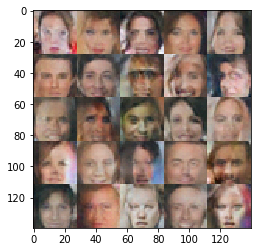

Epoch  3/5 Batch 2980/3166... Discriminator Loss: 1.7020... Generator Loss: 0.2646
Epoch  3/5 Batch 2990/3166... Discriminator Loss: 1.3845... Generator Loss: 0.7212
Epoch  3/5 Batch 3000/3166... Discriminator Loss: 1.3847... Generator Loss: 2.0736
Epoch  3/5 Batch 3010/3166... Discriminator Loss: 0.9517... Generator Loss: 0.7760
Epoch  3/5 Batch 3020/3166... Discriminator Loss: 0.6733... Generator Loss: 1.7694
Epoch  3/5 Batch 3030/3166... Discriminator Loss: 1.3350... Generator Loss: 0.5404
Epoch  3/5 Batch 3040/3166... Discriminator Loss: 1.1966... Generator Loss: 0.7021
Epoch  3/5 Batch 3050/3166... Discriminator Loss: 1.9181... Generator Loss: 2.4336
Epoch  3/5 Batch 3060/3166... Discriminator Loss: 1.1377... Generator Loss: 0.7517
Epoch  3/5 Batch 3070/3166... Discriminator Loss: 1.5531... Generator Loss: 3.1005


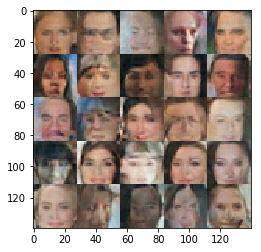

Epoch  3/5 Batch 3080/3166... Discriminator Loss: 1.2115... Generator Loss: 0.4808
Epoch  3/5 Batch 3090/3166... Discriminator Loss: 1.7666... Generator Loss: 0.3091
Epoch  3/5 Batch 3100/3166... Discriminator Loss: 1.2764... Generator Loss: 0.5101
Epoch  3/5 Batch 3110/3166... Discriminator Loss: 0.6682... Generator Loss: 1.1527
Epoch  3/5 Batch 3120/3166... Discriminator Loss: 1.4312... Generator Loss: 0.3991
Epoch  3/5 Batch 3130/3166... Discriminator Loss: 1.4726... Generator Loss: 0.4840
Epoch  3/5 Batch 3140/3166... Discriminator Loss: 1.1445... Generator Loss: 0.6375
Epoch  3/5 Batch 3150/3166... Discriminator Loss: 0.9244... Generator Loss: 2.4154
Epoch  3/5 Batch 3160/3166... Discriminator Loss: 1.4294... Generator Loss: 0.4141
Epoch  4/5 Batch    5/3166... Discriminator Loss: 1.3583... Generator Loss: 0.4165


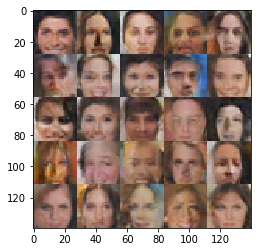

Epoch  4/5 Batch   15/3166... Discriminator Loss: 1.3183... Generator Loss: 0.6828
Epoch  4/5 Batch   25/3166... Discriminator Loss: 1.6128... Generator Loss: 0.5051
Epoch  4/5 Batch   35/3166... Discriminator Loss: 1.2848... Generator Loss: 0.4688
Epoch  4/5 Batch   45/3166... Discriminator Loss: 1.6074... Generator Loss: 0.9867
Epoch  4/5 Batch   55/3166... Discriminator Loss: 1.4360... Generator Loss: 0.4154
Epoch  4/5 Batch   65/3166... Discriminator Loss: 1.5034... Generator Loss: 0.4612
Epoch  4/5 Batch   75/3166... Discriminator Loss: 1.0195... Generator Loss: 1.9757
Epoch  4/5 Batch   85/3166... Discriminator Loss: 1.4009... Generator Loss: 0.4027
Epoch  4/5 Batch   95/3166... Discriminator Loss: 0.6745... Generator Loss: 1.6259
Epoch  4/5 Batch  105/3166... Discriminator Loss: 1.4643... Generator Loss: 0.7231


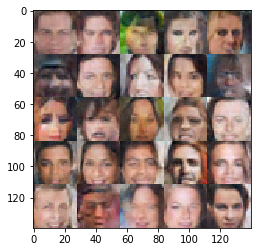

Epoch  4/5 Batch  115/3166... Discriminator Loss: 1.0441... Generator Loss: 1.5730
Epoch  4/5 Batch  125/3166... Discriminator Loss: 0.9956... Generator Loss: 0.6869
Epoch  4/5 Batch  135/3166... Discriminator Loss: 0.9790... Generator Loss: 0.7447
Epoch  4/5 Batch  145/3166... Discriminator Loss: 0.9087... Generator Loss: 1.1889
Epoch  4/5 Batch  155/3166... Discriminator Loss: 1.0580... Generator Loss: 0.8364
Epoch  4/5 Batch  165/3166... Discriminator Loss: 0.8650... Generator Loss: 2.4645
Epoch  4/5 Batch  175/3166... Discriminator Loss: 1.0487... Generator Loss: 1.6273
Epoch  4/5 Batch  185/3166... Discriminator Loss: 1.1314... Generator Loss: 0.5165
Epoch  4/5 Batch  195/3166... Discriminator Loss: 1.4666... Generator Loss: 0.4883
Epoch  4/5 Batch  205/3166... Discriminator Loss: 0.8513... Generator Loss: 1.4086


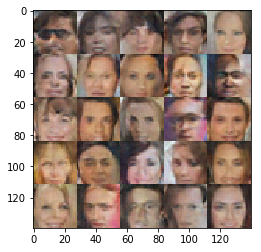

Epoch  4/5 Batch  215/3166... Discriminator Loss: 1.1744... Generator Loss: 0.6990
Epoch  4/5 Batch  225/3166... Discriminator Loss: 0.6690... Generator Loss: 1.4107
Epoch  4/5 Batch  235/3166... Discriminator Loss: 1.3728... Generator Loss: 0.5353
Epoch  4/5 Batch  245/3166... Discriminator Loss: 1.9082... Generator Loss: 0.5336
Epoch  4/5 Batch  255/3166... Discriminator Loss: 2.0763... Generator Loss: 1.4278
Epoch  4/5 Batch  265/3166... Discriminator Loss: 1.1926... Generator Loss: 0.6635
Epoch  4/5 Batch  275/3166... Discriminator Loss: 0.8456... Generator Loss: 0.9493
Epoch  4/5 Batch  285/3166... Discriminator Loss: 1.0778... Generator Loss: 0.6319
Epoch  4/5 Batch  295/3166... Discriminator Loss: 1.3998... Generator Loss: 0.4172
Epoch  4/5 Batch  305/3166... Discriminator Loss: 1.2968... Generator Loss: 0.6041


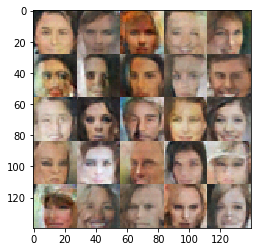

Epoch  4/5 Batch  315/3166... Discriminator Loss: 1.1469... Generator Loss: 0.6886
Epoch  4/5 Batch  325/3166... Discriminator Loss: 1.1998... Generator Loss: 0.6516
Epoch  4/5 Batch  335/3166... Discriminator Loss: 1.5321... Generator Loss: 0.3558
Epoch  4/5 Batch  345/3166... Discriminator Loss: 1.2646... Generator Loss: 0.7484
Epoch  4/5 Batch  355/3166... Discriminator Loss: 1.2512... Generator Loss: 0.5025
Epoch  4/5 Batch  365/3166... Discriminator Loss: 2.4223... Generator Loss: 1.7830
Epoch  4/5 Batch  375/3166... Discriminator Loss: 1.1844... Generator Loss: 0.6799
Epoch  4/5 Batch  385/3166... Discriminator Loss: 1.3606... Generator Loss: 0.8144
Epoch  4/5 Batch  395/3166... Discriminator Loss: 1.2998... Generator Loss: 2.5332
Epoch  4/5 Batch  405/3166... Discriminator Loss: 2.5586... Generator Loss: 0.1646


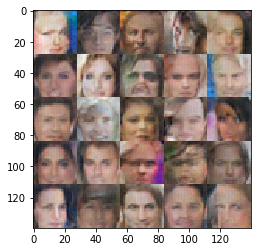

Epoch  4/5 Batch  415/3166... Discriminator Loss: 1.2393... Generator Loss: 0.7885
Epoch  4/5 Batch  425/3166... Discriminator Loss: 1.0037... Generator Loss: 0.7532
Epoch  4/5 Batch  435/3166... Discriminator Loss: 1.2671... Generator Loss: 1.0427
Epoch  4/5 Batch  445/3166... Discriminator Loss: 1.4808... Generator Loss: 1.1108
Epoch  4/5 Batch  455/3166... Discriminator Loss: 1.0969... Generator Loss: 1.0590
Epoch  4/5 Batch  465/3166... Discriminator Loss: 1.5437... Generator Loss: 0.5023
Epoch  4/5 Batch  475/3166... Discriminator Loss: 0.9482... Generator Loss: 0.8610
Epoch  4/5 Batch  485/3166... Discriminator Loss: 0.9264... Generator Loss: 2.2590
Epoch  4/5 Batch  495/3166... Discriminator Loss: 1.3732... Generator Loss: 0.5133
Epoch  4/5 Batch  505/3166... Discriminator Loss: 1.4335... Generator Loss: 0.9111


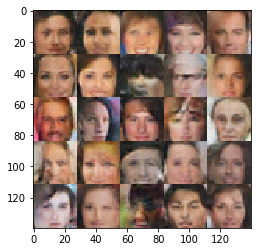

Epoch  4/5 Batch  515/3166... Discriminator Loss: 1.5295... Generator Loss: 0.3752
Epoch  4/5 Batch  525/3166... Discriminator Loss: 1.8203... Generator Loss: 1.4751
Epoch  4/5 Batch  535/3166... Discriminator Loss: 1.6380... Generator Loss: 0.9747
Epoch  4/5 Batch  545/3166... Discriminator Loss: 1.5033... Generator Loss: 0.4005
Epoch  4/5 Batch  555/3166... Discriminator Loss: 1.0090... Generator Loss: 1.0645
Epoch  4/5 Batch  565/3166... Discriminator Loss: 0.8778... Generator Loss: 0.8051
Epoch  4/5 Batch  575/3166... Discriminator Loss: 1.3330... Generator Loss: 0.5715
Epoch  4/5 Batch  585/3166... Discriminator Loss: 0.9146... Generator Loss: 1.0249
Epoch  4/5 Batch  595/3166... Discriminator Loss: 1.0859... Generator Loss: 0.8422
Epoch  4/5 Batch  605/3166... Discriminator Loss: 1.1532... Generator Loss: 0.8938


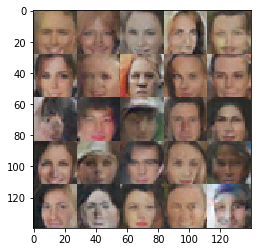

Epoch  4/5 Batch  615/3166... Discriminator Loss: 1.8666... Generator Loss: 2.4012
Epoch  4/5 Batch  625/3166... Discriminator Loss: 1.3405... Generator Loss: 0.6826
Epoch  4/5 Batch  635/3166... Discriminator Loss: 1.2572... Generator Loss: 1.5111
Epoch  4/5 Batch  645/3166... Discriminator Loss: 1.6184... Generator Loss: 0.3774
Epoch  4/5 Batch  655/3166... Discriminator Loss: 0.8085... Generator Loss: 1.0730
Epoch  4/5 Batch  665/3166... Discriminator Loss: 1.4466... Generator Loss: 0.5559
Epoch  4/5 Batch  675/3166... Discriminator Loss: 1.2346... Generator Loss: 0.7459
Epoch  4/5 Batch  685/3166... Discriminator Loss: 1.4070... Generator Loss: 0.4476
Epoch  4/5 Batch  695/3166... Discriminator Loss: 1.3729... Generator Loss: 0.4862
Epoch  4/5 Batch  705/3166... Discriminator Loss: 1.1852... Generator Loss: 0.6737


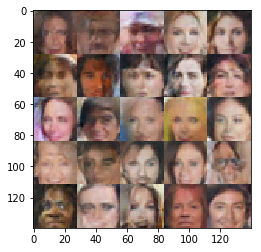

Epoch  4/5 Batch  715/3166... Discriminator Loss: 0.6724... Generator Loss: 1.8386
Epoch  4/5 Batch  725/3166... Discriminator Loss: 0.9557... Generator Loss: 0.8320
Epoch  4/5 Batch  735/3166... Discriminator Loss: 1.2789... Generator Loss: 0.4553
Epoch  4/5 Batch  745/3166... Discriminator Loss: 0.9924... Generator Loss: 1.3863
Epoch  4/5 Batch  755/3166... Discriminator Loss: 1.3151... Generator Loss: 0.5494
Epoch  4/5 Batch  765/3166... Discriminator Loss: 1.1011... Generator Loss: 1.6680
Epoch  4/5 Batch  775/3166... Discriminator Loss: 1.1712... Generator Loss: 0.7181
Epoch  4/5 Batch  785/3166... Discriminator Loss: 1.5387... Generator Loss: 0.6578
Epoch  4/5 Batch  795/3166... Discriminator Loss: 1.1601... Generator Loss: 0.5935
Epoch  4/5 Batch  805/3166... Discriminator Loss: 1.1345... Generator Loss: 0.8745


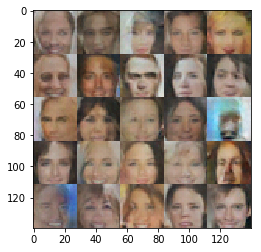

Epoch  4/5 Batch  815/3166... Discriminator Loss: 1.2774... Generator Loss: 0.6196
Epoch  4/5 Batch  825/3166... Discriminator Loss: 1.2929... Generator Loss: 0.5922
Epoch  4/5 Batch  835/3166... Discriminator Loss: 1.1864... Generator Loss: 0.7738
Epoch  4/5 Batch  845/3166... Discriminator Loss: 1.2661... Generator Loss: 0.5928
Epoch  4/5 Batch  855/3166... Discriminator Loss: 0.8862... Generator Loss: 1.1470
Epoch  4/5 Batch  865/3166... Discriminator Loss: 1.0997... Generator Loss: 0.6848
Epoch  4/5 Batch  875/3166... Discriminator Loss: 1.1823... Generator Loss: 0.9602
Epoch  4/5 Batch  885/3166... Discriminator Loss: 1.3708... Generator Loss: 0.4701
Epoch  4/5 Batch  895/3166... Discriminator Loss: 1.1917... Generator Loss: 1.0498
Epoch  4/5 Batch  905/3166... Discriminator Loss: 1.1127... Generator Loss: 0.7186


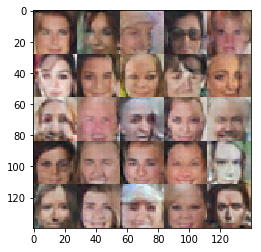

Epoch  4/5 Batch  915/3166... Discriminator Loss: 1.3798... Generator Loss: 0.8563
Epoch  4/5 Batch  925/3166... Discriminator Loss: 0.9541... Generator Loss: 0.9969
Epoch  4/5 Batch  935/3166... Discriminator Loss: 1.4882... Generator Loss: 0.4406
Epoch  4/5 Batch  945/3166... Discriminator Loss: 1.1555... Generator Loss: 0.8489
Epoch  4/5 Batch  955/3166... Discriminator Loss: 1.7666... Generator Loss: 0.2714
Epoch  4/5 Batch  965/3166... Discriminator Loss: 1.1601... Generator Loss: 0.6141
Epoch  4/5 Batch  975/3166... Discriminator Loss: 1.1650... Generator Loss: 1.0355
Epoch  4/5 Batch  985/3166... Discriminator Loss: 1.4407... Generator Loss: 0.4748
Epoch  4/5 Batch  995/3166... Discriminator Loss: 1.2072... Generator Loss: 0.6505
Epoch  4/5 Batch 1005/3166... Discriminator Loss: 1.2007... Generator Loss: 1.2153


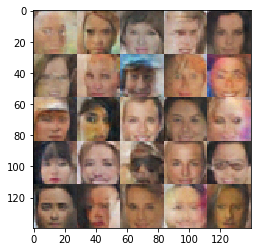

Epoch  4/5 Batch 1015/3166... Discriminator Loss: 1.5010... Generator Loss: 1.2356
Epoch  4/5 Batch 1025/3166... Discriminator Loss: 1.1075... Generator Loss: 2.0553
Epoch  4/5 Batch 1035/3166... Discriminator Loss: 1.5000... Generator Loss: 1.5610
Epoch  4/5 Batch 1045/3166... Discriminator Loss: 1.0373... Generator Loss: 0.7816
Epoch  4/5 Batch 1055/3166... Discriminator Loss: 1.3107... Generator Loss: 0.5200
Epoch  4/5 Batch 1065/3166... Discriminator Loss: 1.0422... Generator Loss: 1.4338
Epoch  4/5 Batch 1075/3166... Discriminator Loss: 1.2071... Generator Loss: 0.7215
Epoch  4/5 Batch 1085/3166... Discriminator Loss: 0.9270... Generator Loss: 0.9764
Epoch  4/5 Batch 1095/3166... Discriminator Loss: 1.4639... Generator Loss: 0.4759
Epoch  4/5 Batch 1105/3166... Discriminator Loss: 0.7130... Generator Loss: 1.4809


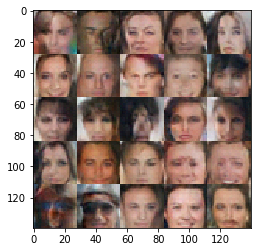

Epoch  4/5 Batch 1115/3166... Discriminator Loss: 1.6995... Generator Loss: 0.3658
Epoch  4/5 Batch 1125/3166... Discriminator Loss: 1.3881... Generator Loss: 1.0704
Epoch  4/5 Batch 1135/3166... Discriminator Loss: 1.1326... Generator Loss: 0.7528
Epoch  4/5 Batch 1145/3166... Discriminator Loss: 1.1565... Generator Loss: 0.8934
Epoch  4/5 Batch 1155/3166... Discriminator Loss: 1.7110... Generator Loss: 0.2819
Epoch  4/5 Batch 1165/3166... Discriminator Loss: 1.1431... Generator Loss: 0.6808
Epoch  4/5 Batch 1175/3166... Discriminator Loss: 1.1108... Generator Loss: 0.6459
Epoch  4/5 Batch 1185/3166... Discriminator Loss: 1.3067... Generator Loss: 0.5554
Epoch  4/5 Batch 1195/3166... Discriminator Loss: 1.2751... Generator Loss: 0.5592
Epoch  4/5 Batch 1205/3166... Discriminator Loss: 1.1861... Generator Loss: 1.3128


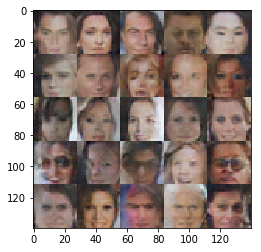

Epoch  4/5 Batch 1215/3166... Discriminator Loss: 1.1541... Generator Loss: 0.8169
Epoch  4/5 Batch 1225/3166... Discriminator Loss: 1.5744... Generator Loss: 0.4246
Epoch  4/5 Batch 1235/3166... Discriminator Loss: 1.5689... Generator Loss: 0.3545
Epoch  4/5 Batch 1245/3166... Discriminator Loss: 1.3666... Generator Loss: 0.4693
Epoch  4/5 Batch 1255/3166... Discriminator Loss: 2.4256... Generator Loss: 0.1387
Epoch  4/5 Batch 1265/3166... Discriminator Loss: 1.7664... Generator Loss: 0.2764
Epoch  4/5 Batch 1275/3166... Discriminator Loss: 1.1790... Generator Loss: 0.7069
Epoch  4/5 Batch 1285/3166... Discriminator Loss: 1.1242... Generator Loss: 0.6643
Epoch  4/5 Batch 1295/3166... Discriminator Loss: 0.8474... Generator Loss: 1.8120
Epoch  4/5 Batch 1305/3166... Discriminator Loss: 1.4034... Generator Loss: 0.3968


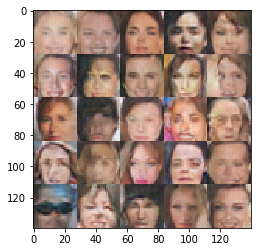

Epoch  4/5 Batch 1315/3166... Discriminator Loss: 0.8830... Generator Loss: 0.7962
Epoch  4/5 Batch 1325/3166... Discriminator Loss: 1.3595... Generator Loss: 1.1182
Epoch  4/5 Batch 1335/3166... Discriminator Loss: 1.3281... Generator Loss: 1.0275
Epoch  4/5 Batch 1345/3166... Discriminator Loss: 1.2199... Generator Loss: 0.6742
Epoch  4/5 Batch 1355/3166... Discriminator Loss: 1.0700... Generator Loss: 1.2242
Epoch  4/5 Batch 1365/3166... Discriminator Loss: 1.2666... Generator Loss: 1.5160
Epoch  4/5 Batch 1375/3166... Discriminator Loss: 1.4219... Generator Loss: 0.6650
Epoch  4/5 Batch 1385/3166... Discriminator Loss: 1.0380... Generator Loss: 0.9998
Epoch  4/5 Batch 1395/3166... Discriminator Loss: 1.1141... Generator Loss: 0.8572
Epoch  4/5 Batch 1405/3166... Discriminator Loss: 1.1412... Generator Loss: 1.5940


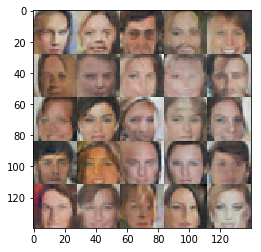

Epoch  4/5 Batch 1415/3166... Discriminator Loss: 1.1459... Generator Loss: 0.8399
Epoch  4/5 Batch 1425/3166... Discriminator Loss: 0.9853... Generator Loss: 1.2917
Epoch  4/5 Batch 1435/3166... Discriminator Loss: 1.0254... Generator Loss: 0.8724
Epoch  4/5 Batch 1445/3166... Discriminator Loss: 1.3203... Generator Loss: 0.5084
Epoch  4/5 Batch 1455/3166... Discriminator Loss: 1.4646... Generator Loss: 0.3994
Epoch  4/5 Batch 1465/3166... Discriminator Loss: 1.2322... Generator Loss: 0.5509
Epoch  4/5 Batch 1475/3166... Discriminator Loss: 1.3761... Generator Loss: 0.5213
Epoch  4/5 Batch 1485/3166... Discriminator Loss: 0.9584... Generator Loss: 1.0750
Epoch  4/5 Batch 1495/3166... Discriminator Loss: 1.3950... Generator Loss: 0.5581
Epoch  4/5 Batch 1505/3166... Discriminator Loss: 1.2138... Generator Loss: 1.1094


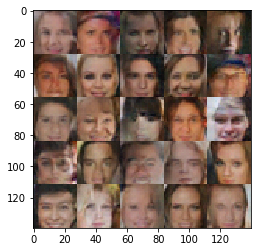

Epoch  4/5 Batch 1515/3166... Discriminator Loss: 1.3441... Generator Loss: 0.5552
Epoch  4/5 Batch 1525/3166... Discriminator Loss: 1.3169... Generator Loss: 0.4481
Epoch  4/5 Batch 1535/3166... Discriminator Loss: 1.2210... Generator Loss: 0.6418
Epoch  4/5 Batch 1545/3166... Discriminator Loss: 1.2220... Generator Loss: 1.2372
Epoch  4/5 Batch 1555/3166... Discriminator Loss: 1.3678... Generator Loss: 0.4388
Epoch  4/5 Batch 1565/3166... Discriminator Loss: 1.2348... Generator Loss: 0.7310
Epoch  4/5 Batch 1575/3166... Discriminator Loss: 1.3579... Generator Loss: 0.9576
Epoch  4/5 Batch 1585/3166... Discriminator Loss: 1.2243... Generator Loss: 0.6940
Epoch  4/5 Batch 1595/3166... Discriminator Loss: 1.3133... Generator Loss: 0.5815
Epoch  4/5 Batch 1605/3166... Discriminator Loss: 1.2700... Generator Loss: 0.4457


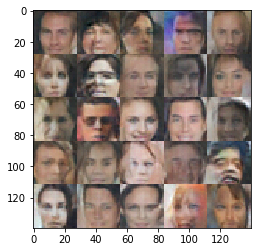

Epoch  4/5 Batch 1615/3166... Discriminator Loss: 1.2543... Generator Loss: 0.5168
Epoch  4/5 Batch 1625/3166... Discriminator Loss: 1.3943... Generator Loss: 1.2428
Epoch  4/5 Batch 1635/3166... Discriminator Loss: 1.3162... Generator Loss: 0.4462
Epoch  4/5 Batch 1645/3166... Discriminator Loss: 1.2121... Generator Loss: 0.6877
Epoch  4/5 Batch 1655/3166... Discriminator Loss: 1.2836... Generator Loss: 0.7444
Epoch  4/5 Batch 1665/3166... Discriminator Loss: 1.1932... Generator Loss: 1.0442
Epoch  4/5 Batch 1675/3166... Discriminator Loss: 1.6996... Generator Loss: 0.8493
Epoch  4/5 Batch 1685/3166... Discriminator Loss: 1.3540... Generator Loss: 1.7970
Epoch  4/5 Batch 1695/3166... Discriminator Loss: 1.4138... Generator Loss: 0.4524
Epoch  4/5 Batch 1705/3166... Discriminator Loss: 1.0837... Generator Loss: 0.7095


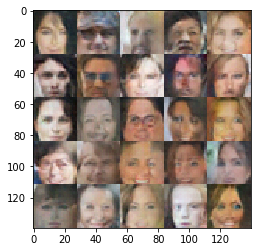

Epoch  4/5 Batch 1715/3166... Discriminator Loss: 0.6232... Generator Loss: 2.1758
Epoch  4/5 Batch 1725/3166... Discriminator Loss: 1.1191... Generator Loss: 1.6402
Epoch  4/5 Batch 1735/3166... Discriminator Loss: 1.1295... Generator Loss: 0.7213
Epoch  4/5 Batch 1745/3166... Discriminator Loss: 1.2506... Generator Loss: 0.4981
Epoch  4/5 Batch 1755/3166... Discriminator Loss: 1.1212... Generator Loss: 1.0476
Epoch  4/5 Batch 1765/3166... Discriminator Loss: 1.2574... Generator Loss: 0.9086
Epoch  4/5 Batch 1775/3166... Discriminator Loss: 1.2664... Generator Loss: 0.9368
Epoch  4/5 Batch 1785/3166... Discriminator Loss: 1.3242... Generator Loss: 0.5164
Epoch  4/5 Batch 1795/3166... Discriminator Loss: 1.0500... Generator Loss: 0.8909
Epoch  4/5 Batch 1805/3166... Discriminator Loss: 1.2555... Generator Loss: 0.6822


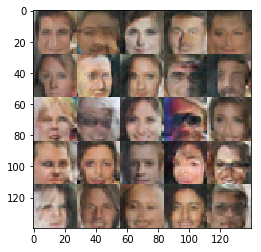

Epoch  4/5 Batch 1815/3166... Discriminator Loss: 1.0982... Generator Loss: 0.7070
Epoch  4/5 Batch 1825/3166... Discriminator Loss: 1.1719... Generator Loss: 0.7056
Epoch  4/5 Batch 1835/3166... Discriminator Loss: 1.5001... Generator Loss: 0.3696
Epoch  4/5 Batch 1845/3166... Discriminator Loss: 0.4375... Generator Loss: 1.4744
Epoch  4/5 Batch 1855/3166... Discriminator Loss: 1.2967... Generator Loss: 2.0148
Epoch  4/5 Batch 1865/3166... Discriminator Loss: 1.7159... Generator Loss: 0.5304
Epoch  4/5 Batch 1875/3166... Discriminator Loss: 1.3592... Generator Loss: 0.4806
Epoch  4/5 Batch 1885/3166... Discriminator Loss: 1.2033... Generator Loss: 0.7489
Epoch  4/5 Batch 1895/3166... Discriminator Loss: 1.4473... Generator Loss: 0.5178
Epoch  4/5 Batch 1905/3166... Discriminator Loss: 1.1550... Generator Loss: 0.8710


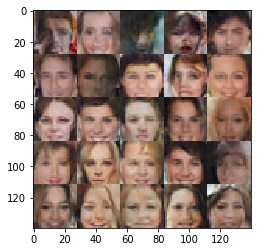

Epoch  4/5 Batch 1915/3166... Discriminator Loss: 1.2156... Generator Loss: 1.0792
Epoch  4/5 Batch 1925/3166... Discriminator Loss: 1.1172... Generator Loss: 0.9772
Epoch  4/5 Batch 1935/3166... Discriminator Loss: 1.2342... Generator Loss: 0.7322
Epoch  4/5 Batch 1945/3166... Discriminator Loss: 1.1737... Generator Loss: 0.6881
Epoch  4/5 Batch 1955/3166... Discriminator Loss: 1.0454... Generator Loss: 1.0115
Epoch  4/5 Batch 1965/3166... Discriminator Loss: 1.8306... Generator Loss: 0.2748
Epoch  4/5 Batch 1975/3166... Discriminator Loss: 0.5434... Generator Loss: 2.2201
Epoch  4/5 Batch 1985/3166... Discriminator Loss: 1.3263... Generator Loss: 0.5014
Epoch  4/5 Batch 1995/3166... Discriminator Loss: 1.6149... Generator Loss: 0.3180
Epoch  4/5 Batch 2005/3166... Discriminator Loss: 1.2234... Generator Loss: 0.7211


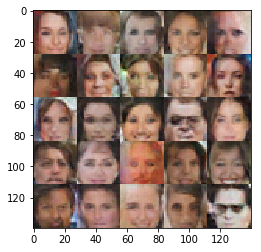

Epoch  4/5 Batch 2015/3166... Discriminator Loss: 0.8280... Generator Loss: 1.8092
Epoch  4/5 Batch 2025/3166... Discriminator Loss: 1.1815... Generator Loss: 0.6532
Epoch  4/5 Batch 2035/3166... Discriminator Loss: 0.8915... Generator Loss: 1.9728
Epoch  4/5 Batch 2045/3166... Discriminator Loss: 1.1948... Generator Loss: 0.8740
Epoch  4/5 Batch 2055/3166... Discriminator Loss: 1.3281... Generator Loss: 0.4386
Epoch  4/5 Batch 2065/3166... Discriminator Loss: 1.0568... Generator Loss: 0.9776
Epoch  4/5 Batch 2075/3166... Discriminator Loss: 1.6709... Generator Loss: 0.3170
Epoch  4/5 Batch 2085/3166... Discriminator Loss: 1.6429... Generator Loss: 0.4462
Epoch  4/5 Batch 2095/3166... Discriminator Loss: 1.6111... Generator Loss: 0.3744
Epoch  4/5 Batch 2105/3166... Discriminator Loss: 1.6407... Generator Loss: 0.3964


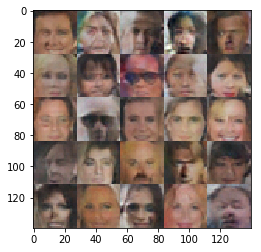

Epoch  4/5 Batch 2115/3166... Discriminator Loss: 0.8871... Generator Loss: 1.4490
Epoch  4/5 Batch 2125/3166... Discriminator Loss: 1.2640... Generator Loss: 1.1974
Epoch  4/5 Batch 2135/3166... Discriminator Loss: 1.1883... Generator Loss: 0.5192
Epoch  4/5 Batch 2145/3166... Discriminator Loss: 2.0837... Generator Loss: 0.2295
Epoch  4/5 Batch 2155/3166... Discriminator Loss: 1.1168... Generator Loss: 0.7725
Epoch  4/5 Batch 2165/3166... Discriminator Loss: 1.2160... Generator Loss: 0.8097
Epoch  4/5 Batch 2175/3166... Discriminator Loss: 1.1190... Generator Loss: 1.1486
Epoch  4/5 Batch 2185/3166... Discriminator Loss: 1.0461... Generator Loss: 0.7766
Epoch  4/5 Batch 2195/3166... Discriminator Loss: 0.9058... Generator Loss: 1.9250
Epoch  4/5 Batch 2205/3166... Discriminator Loss: 2.3283... Generator Loss: 0.6209


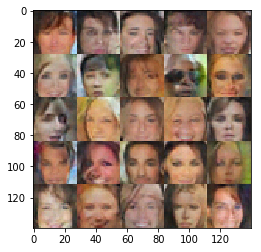

Epoch  4/5 Batch 2215/3166... Discriminator Loss: 0.8431... Generator Loss: 1.0810
Epoch  4/5 Batch 2225/3166... Discriminator Loss: 1.0915... Generator Loss: 1.1627
Epoch  4/5 Batch 2235/3166... Discriminator Loss: 0.8342... Generator Loss: 1.9471
Epoch  4/5 Batch 2245/3166... Discriminator Loss: 1.2785... Generator Loss: 1.1713
Epoch  4/5 Batch 2255/3166... Discriminator Loss: 1.0978... Generator Loss: 0.9450
Epoch  4/5 Batch 2265/3166... Discriminator Loss: 1.8236... Generator Loss: 0.2569
Epoch  4/5 Batch 2275/3166... Discriminator Loss: 0.9685... Generator Loss: 0.8463
Epoch  4/5 Batch 2285/3166... Discriminator Loss: 1.6377... Generator Loss: 1.1467
Epoch  4/5 Batch 2295/3166... Discriminator Loss: 1.1781... Generator Loss: 1.1942
Epoch  4/5 Batch 2305/3166... Discriminator Loss: 1.6266... Generator Loss: 0.3955


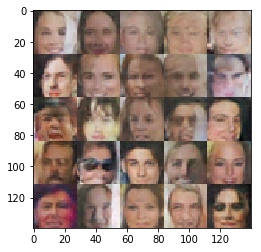

Epoch  4/5 Batch 2315/3166... Discriminator Loss: 1.7065... Generator Loss: 0.2905
Epoch  4/5 Batch 2325/3166... Discriminator Loss: 0.9495... Generator Loss: 0.6774
Epoch  4/5 Batch 2335/3166... Discriminator Loss: 1.2840... Generator Loss: 0.9740
Epoch  4/5 Batch 2345/3166... Discriminator Loss: 1.0935... Generator Loss: 0.7801
Epoch  4/5 Batch 2355/3166... Discriminator Loss: 1.0491... Generator Loss: 0.6200
Epoch  4/5 Batch 2365/3166... Discriminator Loss: 1.1035... Generator Loss: 2.3338
Epoch  4/5 Batch 2375/3166... Discriminator Loss: 1.1458... Generator Loss: 1.5798
Epoch  4/5 Batch 2385/3166... Discriminator Loss: 1.0941... Generator Loss: 0.8995
Epoch  4/5 Batch 2395/3166... Discriminator Loss: 1.2458... Generator Loss: 0.9664
Epoch  4/5 Batch 2405/3166... Discriminator Loss: 1.1529... Generator Loss: 0.6621


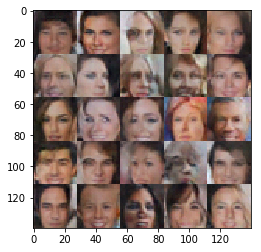

Epoch  4/5 Batch 2415/3166... Discriminator Loss: 0.6921... Generator Loss: 1.3771
Epoch  4/5 Batch 2425/3166... Discriminator Loss: 1.2629... Generator Loss: 2.8747
Epoch  4/5 Batch 2435/3166... Discriminator Loss: 1.4035... Generator Loss: 1.8195
Epoch  4/5 Batch 2445/3166... Discriminator Loss: 1.0006... Generator Loss: 1.4143
Epoch  4/5 Batch 2455/3166... Discriminator Loss: 1.2024... Generator Loss: 2.4010
Epoch  4/5 Batch 2465/3166... Discriminator Loss: 1.3484... Generator Loss: 0.4158
Epoch  4/5 Batch 2475/3166... Discriminator Loss: 0.9770... Generator Loss: 0.9040
Epoch  4/5 Batch 2485/3166... Discriminator Loss: 1.0792... Generator Loss: 0.9490
Epoch  4/5 Batch 2495/3166... Discriminator Loss: 1.3885... Generator Loss: 1.7322
Epoch  4/5 Batch 2505/3166... Discriminator Loss: 1.2734... Generator Loss: 0.8837


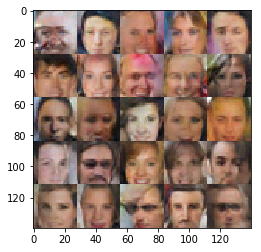

Epoch  4/5 Batch 2515/3166... Discriminator Loss: 1.0195... Generator Loss: 0.7416
Epoch  4/5 Batch 2525/3166... Discriminator Loss: 1.3229... Generator Loss: 1.2301
Epoch  4/5 Batch 2535/3166... Discriminator Loss: 0.9951... Generator Loss: 1.1833
Epoch  4/5 Batch 2545/3166... Discriminator Loss: 1.4195... Generator Loss: 0.3994
Epoch  4/5 Batch 2555/3166... Discriminator Loss: 1.4650... Generator Loss: 0.5114
Epoch  4/5 Batch 2565/3166... Discriminator Loss: 1.4033... Generator Loss: 0.4298
Epoch  4/5 Batch 2575/3166... Discriminator Loss: 1.0271... Generator Loss: 0.7584
Epoch  4/5 Batch 2585/3166... Discriminator Loss: 1.1773... Generator Loss: 0.5565
Epoch  4/5 Batch 2595/3166... Discriminator Loss: 1.1455... Generator Loss: 1.7454
Epoch  4/5 Batch 2605/3166... Discriminator Loss: 1.0435... Generator Loss: 0.8101


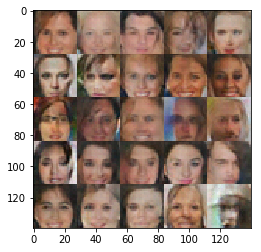

Epoch  4/5 Batch 2615/3166... Discriminator Loss: 0.9719... Generator Loss: 0.6764
Epoch  4/5 Batch 2625/3166... Discriminator Loss: 1.0499... Generator Loss: 1.0702
Epoch  4/5 Batch 2635/3166... Discriminator Loss: 1.0177... Generator Loss: 0.6869
Epoch  4/5 Batch 2645/3166... Discriminator Loss: 1.2239... Generator Loss: 0.7441
Epoch  4/5 Batch 2655/3166... Discriminator Loss: 1.3178... Generator Loss: 0.5070
Epoch  4/5 Batch 2665/3166... Discriminator Loss: 1.2417... Generator Loss: 0.7913
Epoch  4/5 Batch 2675/3166... Discriminator Loss: 0.5180... Generator Loss: 1.7548
Epoch  4/5 Batch 2685/3166... Discriminator Loss: 2.0608... Generator Loss: 0.1898
Epoch  4/5 Batch 2695/3166... Discriminator Loss: 0.9698... Generator Loss: 0.8757
Epoch  4/5 Batch 2705/3166... Discriminator Loss: 1.2540... Generator Loss: 0.5397


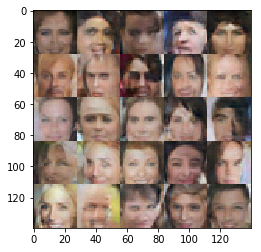

Epoch  4/5 Batch 2715/3166... Discriminator Loss: 1.3497... Generator Loss: 0.6331
Epoch  4/5 Batch 2725/3166... Discriminator Loss: 1.3744... Generator Loss: 0.4620
Epoch  4/5 Batch 2735/3166... Discriminator Loss: 1.1199... Generator Loss: 0.8064
Epoch  4/5 Batch 2745/3166... Discriminator Loss: 0.7378... Generator Loss: 1.1569
Epoch  4/5 Batch 2755/3166... Discriminator Loss: 1.3608... Generator Loss: 1.3322
Epoch  4/5 Batch 2765/3166... Discriminator Loss: 1.2556... Generator Loss: 0.7633
Epoch  4/5 Batch 2775/3166... Discriminator Loss: 1.3175... Generator Loss: 0.8551
Epoch  4/5 Batch 2785/3166... Discriminator Loss: 1.1033... Generator Loss: 0.8932
Epoch  4/5 Batch 2795/3166... Discriminator Loss: 1.1860... Generator Loss: 0.7183
Epoch  4/5 Batch 2805/3166... Discriminator Loss: 1.0666... Generator Loss: 0.7651


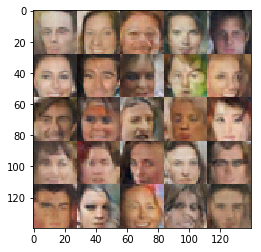

Epoch  4/5 Batch 2815/3166... Discriminator Loss: 1.3905... Generator Loss: 0.5659
Epoch  4/5 Batch 2825/3166... Discriminator Loss: 1.2541... Generator Loss: 0.5369
Epoch  4/5 Batch 2835/3166... Discriminator Loss: 1.0149... Generator Loss: 1.2333
Epoch  4/5 Batch 2845/3166... Discriminator Loss: 1.1635... Generator Loss: 1.1729
Epoch  4/5 Batch 2855/3166... Discriminator Loss: 1.1028... Generator Loss: 1.3333
Epoch  4/5 Batch 2865/3166... Discriminator Loss: 1.5701... Generator Loss: 2.6677
Epoch  4/5 Batch 2875/3166... Discriminator Loss: 1.2769... Generator Loss: 1.6587
Epoch  4/5 Batch 2885/3166... Discriminator Loss: 1.7078... Generator Loss: 0.2824
Epoch  4/5 Batch 2895/3166... Discriminator Loss: 1.2189... Generator Loss: 0.5389
Epoch  4/5 Batch 2905/3166... Discriminator Loss: 2.4626... Generator Loss: 0.1373


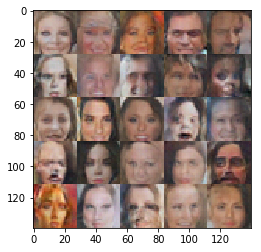

Epoch  4/5 Batch 2915/3166... Discriminator Loss: 1.3348... Generator Loss: 0.6825
Epoch  4/5 Batch 2925/3166... Discriminator Loss: 1.5094... Generator Loss: 0.3706
Epoch  4/5 Batch 2935/3166... Discriminator Loss: 1.8364... Generator Loss: 1.4131
Epoch  4/5 Batch 2945/3166... Discriminator Loss: 1.1324... Generator Loss: 0.6758
Epoch  4/5 Batch 2955/3166... Discriminator Loss: 1.2600... Generator Loss: 0.5800
Epoch  4/5 Batch 2965/3166... Discriminator Loss: 1.1975... Generator Loss: 0.6551
Epoch  4/5 Batch 2975/3166... Discriminator Loss: 1.1806... Generator Loss: 1.0323
Epoch  4/5 Batch 2985/3166... Discriminator Loss: 1.1722... Generator Loss: 1.8247
Epoch  4/5 Batch 2995/3166... Discriminator Loss: 0.6591... Generator Loss: 1.0458
Epoch  4/5 Batch 3005/3166... Discriminator Loss: 1.4364... Generator Loss: 0.3874


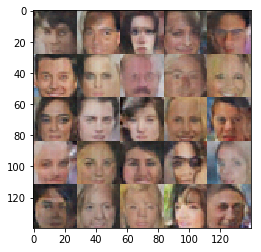

Epoch  4/5 Batch 3015/3166... Discriminator Loss: 1.4573... Generator Loss: 0.7475
Epoch  4/5 Batch 3025/3166... Discriminator Loss: 1.1587... Generator Loss: 1.0273
Epoch  4/5 Batch 3035/3166... Discriminator Loss: 1.3402... Generator Loss: 0.8906
Epoch  4/5 Batch 3045/3166... Discriminator Loss: 1.1053... Generator Loss: 0.8731
Epoch  4/5 Batch 3055/3166... Discriminator Loss: 1.4895... Generator Loss: 0.4552
Epoch  4/5 Batch 3065/3166... Discriminator Loss: 1.3409... Generator Loss: 0.7278
Epoch  4/5 Batch 3075/3166... Discriminator Loss: 1.3242... Generator Loss: 0.6753
Epoch  4/5 Batch 3085/3166... Discriminator Loss: 1.3757... Generator Loss: 0.4283
Epoch  4/5 Batch 3095/3166... Discriminator Loss: 1.2721... Generator Loss: 0.7248
Epoch  4/5 Batch 3105/3166... Discriminator Loss: 1.2204... Generator Loss: 0.7004


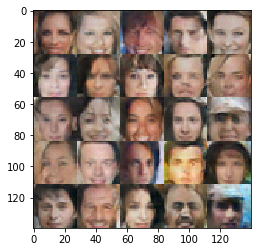

Epoch  4/5 Batch 3115/3166... Discriminator Loss: 1.2494... Generator Loss: 0.7358
Epoch  4/5 Batch 3125/3166... Discriminator Loss: 0.8591... Generator Loss: 1.0529
Epoch  4/5 Batch 3135/3166... Discriminator Loss: 1.0235... Generator Loss: 0.7965
Epoch  4/5 Batch 3145/3166... Discriminator Loss: 1.0071... Generator Loss: 0.9653
Epoch  4/5 Batch 3155/3166... Discriminator Loss: 1.2703... Generator Loss: 0.4874
Epoch  4/5 Batch 3165/3166... Discriminator Loss: 1.4036... Generator Loss: 0.4476
Epoch  5/5 Batch   10/3166... Discriminator Loss: 1.1098... Generator Loss: 0.5904
Epoch  5/5 Batch   20/3166... Discriminator Loss: 1.2346... Generator Loss: 0.7374
Epoch  5/5 Batch   30/3166... Discriminator Loss: 1.2732... Generator Loss: 0.9718
Epoch  5/5 Batch   40/3166... Discriminator Loss: 1.3577... Generator Loss: 0.5205


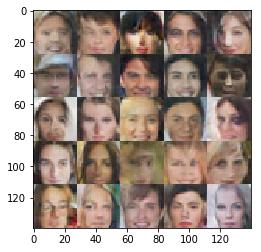

Epoch  5/5 Batch   50/3166... Discriminator Loss: 1.0008... Generator Loss: 1.5236
Epoch  5/5 Batch   60/3166... Discriminator Loss: 1.4696... Generator Loss: 1.4829
Epoch  5/5 Batch   70/3166... Discriminator Loss: 1.2762... Generator Loss: 0.5325
Epoch  5/5 Batch   80/3166... Discriminator Loss: 1.2744... Generator Loss: 0.4895
Epoch  5/5 Batch   90/3166... Discriminator Loss: 0.9271... Generator Loss: 0.9506
Epoch  5/5 Batch  100/3166... Discriminator Loss: 1.1591... Generator Loss: 0.7570
Epoch  5/5 Batch  110/3166... Discriminator Loss: 1.1080... Generator Loss: 0.7214
Epoch  5/5 Batch  120/3166... Discriminator Loss: 1.2833... Generator Loss: 0.9327
Epoch  5/5 Batch  130/3166... Discriminator Loss: 1.4160... Generator Loss: 0.4270
Epoch  5/5 Batch  140/3166... Discriminator Loss: 1.2514... Generator Loss: 0.9315


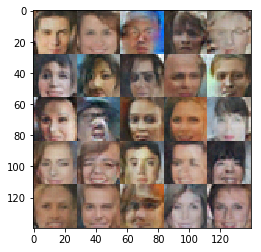

Epoch  5/5 Batch  150/3166... Discriminator Loss: 1.3888... Generator Loss: 0.6559
Epoch  5/5 Batch  160/3166... Discriminator Loss: 1.6061... Generator Loss: 0.3292
Epoch  5/5 Batch  170/3166... Discriminator Loss: 1.2599... Generator Loss: 0.6345
Epoch  5/5 Batch  180/3166... Discriminator Loss: 1.1265... Generator Loss: 0.7357
Epoch  5/5 Batch  190/3166... Discriminator Loss: 1.2144... Generator Loss: 0.9315
Epoch  5/5 Batch  200/3166... Discriminator Loss: 1.1934... Generator Loss: 0.9711
Epoch  5/5 Batch  210/3166... Discriminator Loss: 1.1805... Generator Loss: 0.6390
Epoch  5/5 Batch  220/3166... Discriminator Loss: 1.2213... Generator Loss: 1.1949
Epoch  5/5 Batch  230/3166... Discriminator Loss: 1.1482... Generator Loss: 1.0461
Epoch  5/5 Batch  240/3166... Discriminator Loss: 1.4310... Generator Loss: 0.4479


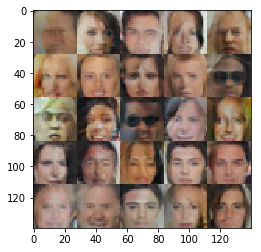

Epoch  5/5 Batch  250/3166... Discriminator Loss: 1.1829... Generator Loss: 0.8303
Epoch  5/5 Batch  260/3166... Discriminator Loss: 1.3367... Generator Loss: 0.5370
Epoch  5/5 Batch  270/3166... Discriminator Loss: 1.0068... Generator Loss: 1.0070
Epoch  5/5 Batch  280/3166... Discriminator Loss: 1.0547... Generator Loss: 0.8732
Epoch  5/5 Batch  290/3166... Discriminator Loss: 1.2674... Generator Loss: 0.4854
Epoch  5/5 Batch  300/3166... Discriminator Loss: 1.7945... Generator Loss: 0.2387
Epoch  5/5 Batch  310/3166... Discriminator Loss: 1.0283... Generator Loss: 0.8198
Epoch  5/5 Batch  320/3166... Discriminator Loss: 1.3151... Generator Loss: 0.4553
Epoch  5/5 Batch  330/3166... Discriminator Loss: 1.6703... Generator Loss: 0.2999
Epoch  5/5 Batch  340/3166... Discriminator Loss: 0.9923... Generator Loss: 1.1071


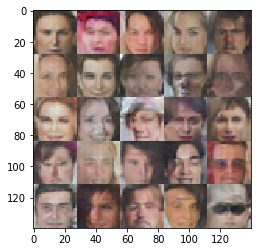

Epoch  5/5 Batch  350/3166... Discriminator Loss: 0.8812... Generator Loss: 1.5145
Epoch  5/5 Batch  360/3166... Discriminator Loss: 1.0521... Generator Loss: 0.8717
Epoch  5/5 Batch  370/3166... Discriminator Loss: 2.4013... Generator Loss: 0.1723
Epoch  5/5 Batch  380/3166... Discriminator Loss: 1.1421... Generator Loss: 0.8200
Epoch  5/5 Batch  390/3166... Discriminator Loss: 0.8391... Generator Loss: 1.2733
Epoch  5/5 Batch  400/3166... Discriminator Loss: 1.3128... Generator Loss: 0.6791
Epoch  5/5 Batch  410/3166... Discriminator Loss: 1.3269... Generator Loss: 0.7068
Epoch  5/5 Batch  420/3166... Discriminator Loss: 1.2439... Generator Loss: 0.7993
Epoch  5/5 Batch  430/3166... Discriminator Loss: 1.1976... Generator Loss: 0.6125
Epoch  5/5 Batch  440/3166... Discriminator Loss: 1.4032... Generator Loss: 0.4309


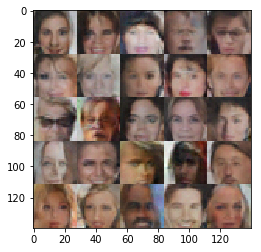

Epoch  5/5 Batch  450/3166... Discriminator Loss: 1.2189... Generator Loss: 0.6464
Epoch  5/5 Batch  460/3166... Discriminator Loss: 1.3178... Generator Loss: 1.0148
Epoch  5/5 Batch  470/3166... Discriminator Loss: 1.3529... Generator Loss: 0.4324
Epoch  5/5 Batch  480/3166... Discriminator Loss: 0.9760... Generator Loss: 0.7471
Epoch  5/5 Batch  490/3166... Discriminator Loss: 1.0329... Generator Loss: 1.1947
Epoch  5/5 Batch  500/3166... Discriminator Loss: 1.1781... Generator Loss: 0.5560
Epoch  5/5 Batch  510/3166... Discriminator Loss: 1.1290... Generator Loss: 0.5944
Epoch  5/5 Batch  520/3166... Discriminator Loss: 0.7254... Generator Loss: 1.0428
Epoch  5/5 Batch  530/3166... Discriminator Loss: 0.8771... Generator Loss: 1.2867
Epoch  5/5 Batch  540/3166... Discriminator Loss: 1.3418... Generator Loss: 0.4757


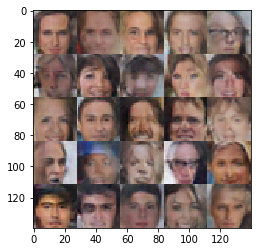

Epoch  5/5 Batch  550/3166... Discriminator Loss: 1.3708... Generator Loss: 0.4457
Epoch  5/5 Batch  560/3166... Discriminator Loss: 1.5235... Generator Loss: 3.2473
Epoch  5/5 Batch  570/3166... Discriminator Loss: 1.2980... Generator Loss: 0.9770
Epoch  5/5 Batch  580/3166... Discriminator Loss: 1.5164... Generator Loss: 0.4284
Epoch  5/5 Batch  590/3166... Discriminator Loss: 0.6014... Generator Loss: 1.6522
Epoch  5/5 Batch  600/3166... Discriminator Loss: 0.9345... Generator Loss: 0.9398
Epoch  5/5 Batch  610/3166... Discriminator Loss: 1.1675... Generator Loss: 0.8726
Epoch  5/5 Batch  620/3166... Discriminator Loss: 1.2979... Generator Loss: 0.5275
Epoch  5/5 Batch  630/3166... Discriminator Loss: 0.9158... Generator Loss: 1.8125
Epoch  5/5 Batch  640/3166... Discriminator Loss: 1.3626... Generator Loss: 0.4419


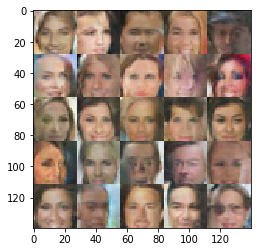

Epoch  5/5 Batch  650/3166... Discriminator Loss: 0.9737... Generator Loss: 1.0533
Epoch  5/5 Batch  660/3166... Discriminator Loss: 1.6656... Generator Loss: 0.3054
Epoch  5/5 Batch  670/3166... Discriminator Loss: 1.2867... Generator Loss: 0.5315
Epoch  5/5 Batch  680/3166... Discriminator Loss: 1.2122... Generator Loss: 1.4946
Epoch  5/5 Batch  690/3166... Discriminator Loss: 0.9420... Generator Loss: 1.1265
Epoch  5/5 Batch  700/3166... Discriminator Loss: 1.2176... Generator Loss: 1.6352
Epoch  5/5 Batch  710/3166... Discriminator Loss: 1.1148... Generator Loss: 1.1735
Epoch  5/5 Batch  720/3166... Discriminator Loss: 1.4419... Generator Loss: 1.1212
Epoch  5/5 Batch  730/3166... Discriminator Loss: 1.1900... Generator Loss: 0.5735
Epoch  5/5 Batch  740/3166... Discriminator Loss: 1.1767... Generator Loss: 0.7117


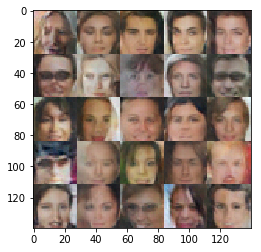

Epoch  5/5 Batch  750/3166... Discriminator Loss: 1.2528... Generator Loss: 1.0017
Epoch  5/5 Batch  760/3166... Discriminator Loss: 1.6344... Generator Loss: 0.4436
Epoch  5/5 Batch  770/3166... Discriminator Loss: 0.9174... Generator Loss: 0.9305
Epoch  5/5 Batch  780/3166... Discriminator Loss: 0.9838... Generator Loss: 0.9204
Epoch  5/5 Batch  790/3166... Discriminator Loss: 0.8468... Generator Loss: 0.9803
Epoch  5/5 Batch  800/3166... Discriminator Loss: 1.0835... Generator Loss: 0.7706
Epoch  5/5 Batch  810/3166... Discriminator Loss: 0.6616... Generator Loss: 1.1446
Epoch  5/5 Batch  820/3166... Discriminator Loss: 1.2154... Generator Loss: 0.8186
Epoch  5/5 Batch  830/3166... Discriminator Loss: 1.1278... Generator Loss: 0.9442
Epoch  5/5 Batch  840/3166... Discriminator Loss: 1.3231... Generator Loss: 0.5104


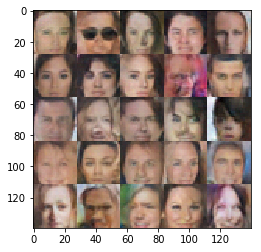

Epoch  5/5 Batch  850/3166... Discriminator Loss: 0.9603... Generator Loss: 0.9036
Epoch  5/5 Batch  860/3166... Discriminator Loss: 1.3327... Generator Loss: 0.5766
Epoch  5/5 Batch  870/3166... Discriminator Loss: 1.0286... Generator Loss: 1.1034
Epoch  5/5 Batch  880/3166... Discriminator Loss: 1.2260... Generator Loss: 0.5963
Epoch  5/5 Batch  890/3166... Discriminator Loss: 1.3192... Generator Loss: 0.4755
Epoch  5/5 Batch  900/3166... Discriminator Loss: 1.5420... Generator Loss: 0.6939
Epoch  5/5 Batch  910/3166... Discriminator Loss: 1.2125... Generator Loss: 1.5154
Epoch  5/5 Batch  920/3166... Discriminator Loss: 1.0883... Generator Loss: 0.6541
Epoch  5/5 Batch  930/3166... Discriminator Loss: 1.1078... Generator Loss: 0.7727
Epoch  5/5 Batch  940/3166... Discriminator Loss: 1.4762... Generator Loss: 2.1460


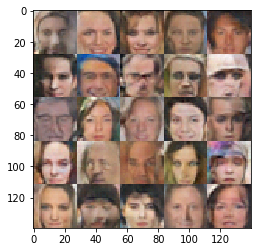

Epoch  5/5 Batch  950/3166... Discriminator Loss: 0.8734... Generator Loss: 0.7234
Epoch  5/5 Batch  960/3166... Discriminator Loss: 1.1145... Generator Loss: 0.5853
Epoch  5/5 Batch  970/3166... Discriminator Loss: 1.0725... Generator Loss: 0.8988
Epoch  5/5 Batch  980/3166... Discriminator Loss: 1.0980... Generator Loss: 0.7522
Epoch  5/5 Batch  990/3166... Discriminator Loss: 1.1282... Generator Loss: 1.1508
Epoch  5/5 Batch 1000/3166... Discriminator Loss: 1.1703... Generator Loss: 0.5650
Epoch  5/5 Batch 1010/3166... Discriminator Loss: 1.2531... Generator Loss: 0.8573
Epoch  5/5 Batch 1020/3166... Discriminator Loss: 1.2218... Generator Loss: 0.7495
Epoch  5/5 Batch 1030/3166... Discriminator Loss: 1.5107... Generator Loss: 0.8401
Epoch  5/5 Batch 1040/3166... Discriminator Loss: 1.1397... Generator Loss: 1.2722


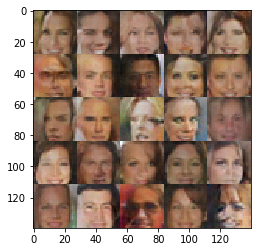

Epoch  5/5 Batch 1050/3166... Discriminator Loss: 1.2343... Generator Loss: 0.5435
Epoch  5/5 Batch 1060/3166... Discriminator Loss: 1.1044... Generator Loss: 0.7358
Epoch  5/5 Batch 1070/3166... Discriminator Loss: 1.3417... Generator Loss: 0.5218
Epoch  5/5 Batch 1080/3166... Discriminator Loss: 1.0929... Generator Loss: 0.8610
Epoch  5/5 Batch 1090/3166... Discriminator Loss: 1.2088... Generator Loss: 0.4827
Epoch  5/5 Batch 1100/3166... Discriminator Loss: 1.3256... Generator Loss: 0.4606
Epoch  5/5 Batch 1110/3166... Discriminator Loss: 1.1746... Generator Loss: 0.8438
Epoch  5/5 Batch 1120/3166... Discriminator Loss: 1.0236... Generator Loss: 0.6392
Epoch  5/5 Batch 1130/3166... Discriminator Loss: 1.1745... Generator Loss: 1.2506
Epoch  5/5 Batch 1140/3166... Discriminator Loss: 0.6652... Generator Loss: 2.9105


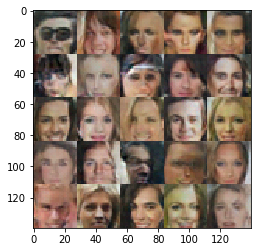

Epoch  5/5 Batch 1150/3166... Discriminator Loss: 0.8450... Generator Loss: 1.7770
Epoch  5/5 Batch 1160/3166... Discriminator Loss: 1.6483... Generator Loss: 1.3647
Epoch  5/5 Batch 1170/3166... Discriminator Loss: 1.7959... Generator Loss: 0.2447
Epoch  5/5 Batch 1180/3166... Discriminator Loss: 0.9872... Generator Loss: 0.8116
Epoch  5/5 Batch 1190/3166... Discriminator Loss: 1.0944... Generator Loss: 1.3241
Epoch  5/5 Batch 1200/3166... Discriminator Loss: 1.2897... Generator Loss: 0.5874
Epoch  5/5 Batch 1210/3166... Discriminator Loss: 1.3081... Generator Loss: 0.4277
Epoch  5/5 Batch 1220/3166... Discriminator Loss: 1.1672... Generator Loss: 0.9547
Epoch  5/5 Batch 1230/3166... Discriminator Loss: 1.7209... Generator Loss: 0.3100
Epoch  5/5 Batch 1240/3166... Discriminator Loss: 1.1587... Generator Loss: 1.0646


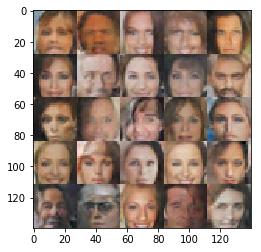

Epoch  5/5 Batch 1250/3166... Discriminator Loss: 0.8071... Generator Loss: 1.2082
Epoch  5/5 Batch 1260/3166... Discriminator Loss: 1.3359... Generator Loss: 1.0604
Epoch  5/5 Batch 1270/3166... Discriminator Loss: 0.9987... Generator Loss: 1.7309
Epoch  5/5 Batch 1280/3166... Discriminator Loss: 1.0578... Generator Loss: 0.7117
Epoch  5/5 Batch 1290/3166... Discriminator Loss: 1.4900... Generator Loss: 0.5183
Epoch  5/5 Batch 1300/3166... Discriminator Loss: 1.1161... Generator Loss: 1.0971
Epoch  5/5 Batch 1310/3166... Discriminator Loss: 1.0520... Generator Loss: 1.0769
Epoch  5/5 Batch 1320/3166... Discriminator Loss: 1.2050... Generator Loss: 0.5819
Epoch  5/5 Batch 1330/3166... Discriminator Loss: 1.3036... Generator Loss: 0.5084
Epoch  5/5 Batch 1340/3166... Discriminator Loss: 1.2394... Generator Loss: 0.6588


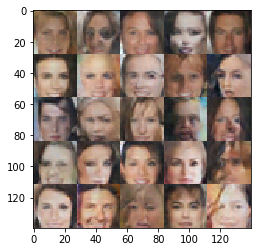

Epoch  5/5 Batch 1350/3166... Discriminator Loss: 1.1634... Generator Loss: 0.6336
Epoch  5/5 Batch 1360/3166... Discriminator Loss: 0.9508... Generator Loss: 2.6401
Epoch  5/5 Batch 1370/3166... Discriminator Loss: 0.9324... Generator Loss: 0.9250
Epoch  5/5 Batch 1380/3166... Discriminator Loss: 1.3470... Generator Loss: 0.4347
Epoch  5/5 Batch 1390/3166... Discriminator Loss: 1.2261... Generator Loss: 1.2500
Epoch  5/5 Batch 1400/3166... Discriminator Loss: 1.3032... Generator Loss: 0.8844
Epoch  5/5 Batch 1410/3166... Discriminator Loss: 1.1829... Generator Loss: 0.7000
Epoch  5/5 Batch 1420/3166... Discriminator Loss: 1.2737... Generator Loss: 0.4988
Epoch  5/5 Batch 1430/3166... Discriminator Loss: 1.1858... Generator Loss: 0.5833
Epoch  5/5 Batch 1440/3166... Discriminator Loss: 0.9831... Generator Loss: 2.1928


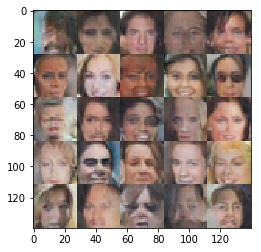

Epoch  5/5 Batch 1450/3166... Discriminator Loss: 1.2686... Generator Loss: 0.5176
Epoch  5/5 Batch 1460/3166... Discriminator Loss: 1.0410... Generator Loss: 0.8047
Epoch  5/5 Batch 1470/3166... Discriminator Loss: 1.5794... Generator Loss: 0.4021
Epoch  5/5 Batch 1480/3166... Discriminator Loss: 1.3069... Generator Loss: 0.5598
Epoch  5/5 Batch 1490/3166... Discriminator Loss: 1.1580... Generator Loss: 0.7992
Epoch  5/5 Batch 1500/3166... Discriminator Loss: 1.1679... Generator Loss: 0.5632
Epoch  5/5 Batch 1510/3166... Discriminator Loss: 1.0571... Generator Loss: 0.8090
Epoch  5/5 Batch 1520/3166... Discriminator Loss: 1.0974... Generator Loss: 0.9466
Epoch  5/5 Batch 1530/3166... Discriminator Loss: 1.3913... Generator Loss: 0.9307
Epoch  5/5 Batch 1540/3166... Discriminator Loss: 1.1396... Generator Loss: 1.0490


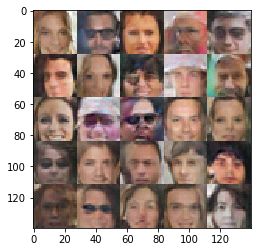

Epoch  5/5 Batch 1550/3166... Discriminator Loss: 1.0443... Generator Loss: 1.4454
Epoch  5/5 Batch 1560/3166... Discriminator Loss: 1.1705... Generator Loss: 0.9827
Epoch  5/5 Batch 1570/3166... Discriminator Loss: 0.7597... Generator Loss: 1.3350
Epoch  5/5 Batch 1580/3166... Discriminator Loss: 1.3158... Generator Loss: 0.4811
Epoch  5/5 Batch 1590/3166... Discriminator Loss: 1.2575... Generator Loss: 1.2083
Epoch  5/5 Batch 1600/3166... Discriminator Loss: 1.2185... Generator Loss: 1.5007
Epoch  5/5 Batch 1610/3166... Discriminator Loss: 1.0876... Generator Loss: 0.9070
Epoch  5/5 Batch 1620/3166... Discriminator Loss: 1.1805... Generator Loss: 0.6580
Epoch  5/5 Batch 1630/3166... Discriminator Loss: 1.2076... Generator Loss: 0.6094
Epoch  5/5 Batch 1640/3166... Discriminator Loss: 1.0509... Generator Loss: 1.1493


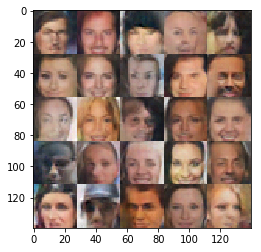

Epoch  5/5 Batch 1650/3166... Discriminator Loss: 1.8059... Generator Loss: 0.2458
Epoch  5/5 Batch 1660/3166... Discriminator Loss: 1.4393... Generator Loss: 0.3938
Epoch  5/5 Batch 1670/3166... Discriminator Loss: 1.0790... Generator Loss: 0.7046
Epoch  5/5 Batch 1680/3166... Discriminator Loss: 1.3943... Generator Loss: 0.5708
Epoch  5/5 Batch 1690/3166... Discriminator Loss: 1.2345... Generator Loss: 1.4208
Epoch  5/5 Batch 1700/3166... Discriminator Loss: 1.1303... Generator Loss: 0.5606
Epoch  5/5 Batch 1710/3166... Discriminator Loss: 1.3424... Generator Loss: 0.5337
Epoch  5/5 Batch 1720/3166... Discriminator Loss: 1.2282... Generator Loss: 0.5485
Epoch  5/5 Batch 1730/3166... Discriminator Loss: 1.1801... Generator Loss: 0.9948
Epoch  5/5 Batch 1740/3166... Discriminator Loss: 1.1700... Generator Loss: 0.8844


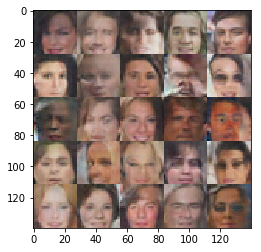

Epoch  5/5 Batch 1750/3166... Discriminator Loss: 1.7572... Generator Loss: 0.2904
Epoch  5/5 Batch 1760/3166... Discriminator Loss: 1.4062... Generator Loss: 0.7596
Epoch  5/5 Batch 1770/3166... Discriminator Loss: 1.1682... Generator Loss: 0.6560
Epoch  5/5 Batch 1780/3166... Discriminator Loss: 0.8166... Generator Loss: 0.9381
Epoch  5/5 Batch 1790/3166... Discriminator Loss: 2.1025... Generator Loss: 0.1918
Epoch  5/5 Batch 1800/3166... Discriminator Loss: 1.6538... Generator Loss: 0.3764
Epoch  5/5 Batch 1810/3166... Discriminator Loss: 1.2047... Generator Loss: 0.8405
Epoch  5/5 Batch 1820/3166... Discriminator Loss: 1.1164... Generator Loss: 1.0711
Epoch  5/5 Batch 1830/3166... Discriminator Loss: 1.7120... Generator Loss: 0.2719
Epoch  5/5 Batch 1840/3166... Discriminator Loss: 0.9762... Generator Loss: 0.8633


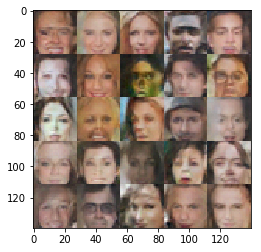

Epoch  5/5 Batch 1850/3166... Discriminator Loss: 1.2659... Generator Loss: 0.5428
Epoch  5/5 Batch 1860/3166... Discriminator Loss: 1.5734... Generator Loss: 0.3643
Epoch  5/5 Batch 1870/3166... Discriminator Loss: 1.0682... Generator Loss: 0.8457
Epoch  5/5 Batch 1880/3166... Discriminator Loss: 1.0359... Generator Loss: 0.6470
Epoch  5/5 Batch 1890/3166... Discriminator Loss: 1.8035... Generator Loss: 1.8252
Epoch  5/5 Batch 1900/3166... Discriminator Loss: 1.0323... Generator Loss: 1.0564
Epoch  5/5 Batch 1910/3166... Discriminator Loss: 0.9076... Generator Loss: 1.2029
Epoch  5/5 Batch 1920/3166... Discriminator Loss: 1.5203... Generator Loss: 0.4690
Epoch  5/5 Batch 1930/3166... Discriminator Loss: 1.3518... Generator Loss: 0.4978
Epoch  5/5 Batch 1940/3166... Discriminator Loss: 1.3182... Generator Loss: 0.4840


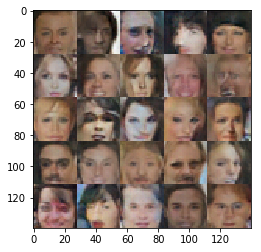

Epoch  5/5 Batch 1950/3166... Discriminator Loss: 1.2832... Generator Loss: 0.5881
Epoch  5/5 Batch 1960/3166... Discriminator Loss: 0.9740... Generator Loss: 0.7217
Epoch  5/5 Batch 1970/3166... Discriminator Loss: 1.1691... Generator Loss: 0.6357
Epoch  5/5 Batch 1980/3166... Discriminator Loss: 1.2655... Generator Loss: 0.8308
Epoch  5/5 Batch 1990/3166... Discriminator Loss: 1.0342... Generator Loss: 1.0421
Epoch  5/5 Batch 2000/3166... Discriminator Loss: 1.3198... Generator Loss: 0.7452
Epoch  5/5 Batch 2010/3166... Discriminator Loss: 1.1530... Generator Loss: 0.7230
Epoch  5/5 Batch 2020/3166... Discriminator Loss: 1.2993... Generator Loss: 1.9431
Epoch  5/5 Batch 2030/3166... Discriminator Loss: 1.0460... Generator Loss: 0.6849
Epoch  5/5 Batch 2040/3166... Discriminator Loss: 1.2291... Generator Loss: 0.6639


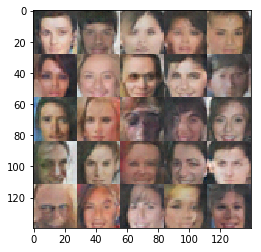

Epoch  5/5 Batch 2050/3166... Discriminator Loss: 0.7527... Generator Loss: 1.4766
Epoch  5/5 Batch 2060/3166... Discriminator Loss: 1.7468... Generator Loss: 0.4421
Epoch  5/5 Batch 2070/3166... Discriminator Loss: 1.7214... Generator Loss: 0.5652
Epoch  5/5 Batch 2080/3166... Discriminator Loss: 1.9945... Generator Loss: 1.4300
Epoch  5/5 Batch 2090/3166... Discriminator Loss: 1.0937... Generator Loss: 0.6706
Epoch  5/5 Batch 2100/3166... Discriminator Loss: 1.3348... Generator Loss: 0.6562
Epoch  5/5 Batch 2110/3166... Discriminator Loss: 0.9420... Generator Loss: 0.9928
Epoch  5/5 Batch 2120/3166... Discriminator Loss: 1.3611... Generator Loss: 0.5935
Epoch  5/5 Batch 2130/3166... Discriminator Loss: 1.2327... Generator Loss: 0.7245
Epoch  5/5 Batch 2140/3166... Discriminator Loss: 1.0707... Generator Loss: 0.8104


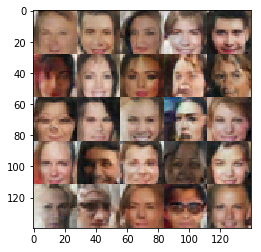

Epoch  5/5 Batch 2150/3166... Discriminator Loss: 1.2707... Generator Loss: 0.8078
Epoch  5/5 Batch 2160/3166... Discriminator Loss: 0.9193... Generator Loss: 0.8622
Epoch  5/5 Batch 2170/3166... Discriminator Loss: 0.9527... Generator Loss: 1.9202
Epoch  5/5 Batch 2180/3166... Discriminator Loss: 1.9207... Generator Loss: 0.2805
Epoch  5/5 Batch 2190/3166... Discriminator Loss: 1.5276... Generator Loss: 0.8618
Epoch  5/5 Batch 2200/3166... Discriminator Loss: 1.2103... Generator Loss: 1.3568
Epoch  5/5 Batch 2210/3166... Discriminator Loss: 1.3971... Generator Loss: 0.5072
Epoch  5/5 Batch 2220/3166... Discriminator Loss: 1.1208... Generator Loss: 0.7358
Epoch  5/5 Batch 2230/3166... Discriminator Loss: 1.3313... Generator Loss: 0.5574
Epoch  5/5 Batch 2240/3166... Discriminator Loss: 1.3208... Generator Loss: 0.5988


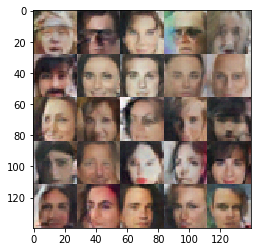

Epoch  5/5 Batch 2250/3166... Discriminator Loss: 1.0202... Generator Loss: 1.6530
Epoch  5/5 Batch 2260/3166... Discriminator Loss: 1.2535... Generator Loss: 0.5991
Epoch  5/5 Batch 2270/3166... Discriminator Loss: 1.5857... Generator Loss: 0.3549
Epoch  5/5 Batch 2280/3166... Discriminator Loss: 0.8928... Generator Loss: 1.2313
Epoch  5/5 Batch 2290/3166... Discriminator Loss: 1.0604... Generator Loss: 0.8658
Epoch  5/5 Batch 2300/3166... Discriminator Loss: 1.0356... Generator Loss: 2.6205
Epoch  5/5 Batch 2310/3166... Discriminator Loss: 1.0236... Generator Loss: 1.0280
Epoch  5/5 Batch 2320/3166... Discriminator Loss: 0.7685... Generator Loss: 1.0324
Epoch  5/5 Batch 2330/3166... Discriminator Loss: 0.9498... Generator Loss: 2.9253
Epoch  5/5 Batch 2340/3166... Discriminator Loss: 1.7573... Generator Loss: 1.0393


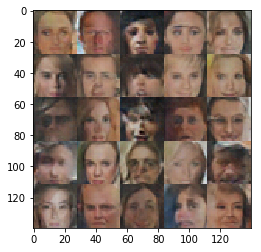

Epoch  5/5 Batch 2350/3166... Discriminator Loss: 1.2745... Generator Loss: 0.5383
Epoch  5/5 Batch 2360/3166... Discriminator Loss: 1.5444... Generator Loss: 0.3444
Epoch  5/5 Batch 2370/3166... Discriminator Loss: 1.2822... Generator Loss: 0.6023
Epoch  5/5 Batch 2380/3166... Discriminator Loss: 1.2554... Generator Loss: 0.9328
Epoch  5/5 Batch 2390/3166... Discriminator Loss: 1.5785... Generator Loss: 0.4601
Epoch  5/5 Batch 2400/3166... Discriminator Loss: 2.2838... Generator Loss: 0.1685
Epoch  5/5 Batch 2410/3166... Discriminator Loss: 1.0008... Generator Loss: 0.7504
Epoch  5/5 Batch 2420/3166... Discriminator Loss: 1.4524... Generator Loss: 0.4624
Epoch  5/5 Batch 2430/3166... Discriminator Loss: 1.6052... Generator Loss: 0.4326
Epoch  5/5 Batch 2440/3166... Discriminator Loss: 1.6194... Generator Loss: 0.3767


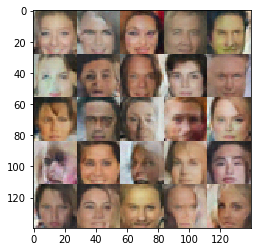

Epoch  5/5 Batch 2450/3166... Discriminator Loss: 1.0699... Generator Loss: 1.8062
Epoch  5/5 Batch 2460/3166... Discriminator Loss: 1.5658... Generator Loss: 0.4218
Epoch  5/5 Batch 2470/3166... Discriminator Loss: 1.0767... Generator Loss: 0.7041
Epoch  5/5 Batch 2480/3166... Discriminator Loss: 0.7097... Generator Loss: 1.1404
Epoch  5/5 Batch 2490/3166... Discriminator Loss: 1.2622... Generator Loss: 0.4836
Epoch  5/5 Batch 2500/3166... Discriminator Loss: 0.9599... Generator Loss: 1.1403
Epoch  5/5 Batch 2510/3166... Discriminator Loss: 1.2280... Generator Loss: 1.4087
Epoch  5/5 Batch 2520/3166... Discriminator Loss: 0.9242... Generator Loss: 1.0632
Epoch  5/5 Batch 2530/3166... Discriminator Loss: 0.9621... Generator Loss: 0.7012
Epoch  5/5 Batch 2540/3166... Discriminator Loss: 1.3565... Generator Loss: 0.5715


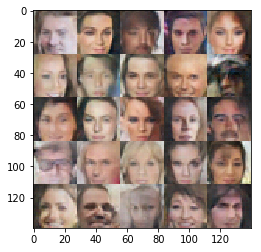

Epoch  5/5 Batch 2550/3166... Discriminator Loss: 1.4912... Generator Loss: 0.3965
Epoch  5/5 Batch 2560/3166... Discriminator Loss: 0.8031... Generator Loss: 1.3607
Epoch  5/5 Batch 2570/3166... Discriminator Loss: 1.6596... Generator Loss: 0.3061
Epoch  5/5 Batch 2580/3166... Discriminator Loss: 1.2494... Generator Loss: 1.3887
Epoch  5/5 Batch 2590/3166... Discriminator Loss: 0.9047... Generator Loss: 1.1962
Epoch  5/5 Batch 2600/3166... Discriminator Loss: 1.1239... Generator Loss: 0.9142
Epoch  5/5 Batch 2610/3166... Discriminator Loss: 1.2116... Generator Loss: 0.8403
Epoch  5/5 Batch 2620/3166... Discriminator Loss: 1.1612... Generator Loss: 0.6141
Epoch  5/5 Batch 2630/3166... Discriminator Loss: 0.7508... Generator Loss: 1.6319
Epoch  5/5 Batch 2640/3166... Discriminator Loss: 0.7989... Generator Loss: 1.1705


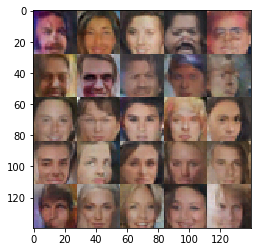

Epoch  5/5 Batch 2650/3166... Discriminator Loss: 1.7808... Generator Loss: 0.3051
Epoch  5/5 Batch 2660/3166... Discriminator Loss: 1.4613... Generator Loss: 0.3841
Epoch  5/5 Batch 2670/3166... Discriminator Loss: 0.7952... Generator Loss: 0.8334
Epoch  5/5 Batch 2680/3166... Discriminator Loss: 1.2660... Generator Loss: 0.5638
Epoch  5/5 Batch 2690/3166... Discriminator Loss: 1.2701... Generator Loss: 1.0745
Epoch  5/5 Batch 2700/3166... Discriminator Loss: 1.0729... Generator Loss: 0.7476
Epoch  5/5 Batch 2710/3166... Discriminator Loss: 1.2173... Generator Loss: 0.5071
Epoch  5/5 Batch 2720/3166... Discriminator Loss: 0.7665... Generator Loss: 2.1702
Epoch  5/5 Batch 2730/3166... Discriminator Loss: 0.8866... Generator Loss: 1.1815
Epoch  5/5 Batch 2740/3166... Discriminator Loss: 0.9475... Generator Loss: 1.0849


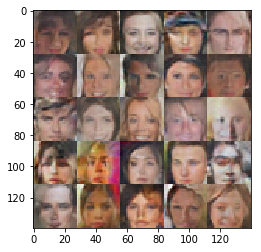

Epoch  5/5 Batch 2750/3166... Discriminator Loss: 1.6678... Generator Loss: 0.2933
Epoch  5/5 Batch 2760/3166... Discriminator Loss: 1.7971... Generator Loss: 0.2940
Epoch  5/5 Batch 2770/3166... Discriminator Loss: 0.9665... Generator Loss: 0.7371
Epoch  5/5 Batch 2780/3166... Discriminator Loss: 0.9586... Generator Loss: 0.9312
Epoch  5/5 Batch 2790/3166... Discriminator Loss: 1.2070... Generator Loss: 1.0340
Epoch  5/5 Batch 2800/3166... Discriminator Loss: 0.7761... Generator Loss: 1.2281
Epoch  5/5 Batch 2810/3166... Discriminator Loss: 1.0187... Generator Loss: 0.8096
Epoch  5/5 Batch 2820/3166... Discriminator Loss: 1.6751... Generator Loss: 0.2866
Epoch  5/5 Batch 2830/3166... Discriminator Loss: 0.6856... Generator Loss: 1.3070
Epoch  5/5 Batch 2840/3166... Discriminator Loss: 1.0514... Generator Loss: 0.8510


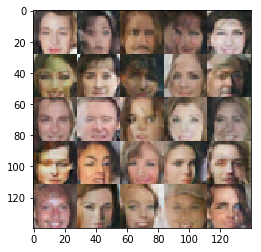

Epoch  5/5 Batch 2850/3166... Discriminator Loss: 0.7953... Generator Loss: 0.9418
Epoch  5/5 Batch 2860/3166... Discriminator Loss: 1.5825... Generator Loss: 0.3669
Epoch  5/5 Batch 2870/3166... Discriminator Loss: 1.6398... Generator Loss: 1.7709
Epoch  5/5 Batch 2880/3166... Discriminator Loss: 0.7966... Generator Loss: 1.4831
Epoch  5/5 Batch 2890/3166... Discriminator Loss: 0.8644... Generator Loss: 0.9227
Epoch  5/5 Batch 2900/3166... Discriminator Loss: 1.5648... Generator Loss: 0.5924
Epoch  5/5 Batch 2910/3166... Discriminator Loss: 1.1558... Generator Loss: 0.7665
Epoch  5/5 Batch 2920/3166... Discriminator Loss: 2.1928... Generator Loss: 0.1914
Epoch  5/5 Batch 2930/3166... Discriminator Loss: 0.9495... Generator Loss: 0.8826
Epoch  5/5 Batch 2940/3166... Discriminator Loss: 1.4947... Generator Loss: 0.5837


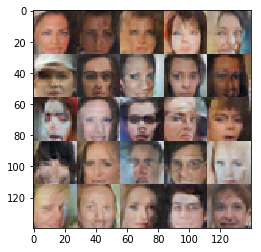

Epoch  5/5 Batch 2950/3166... Discriminator Loss: 1.4112... Generator Loss: 1.1584
Epoch  5/5 Batch 2960/3166... Discriminator Loss: 1.2507... Generator Loss: 0.9576
Epoch  5/5 Batch 2970/3166... Discriminator Loss: 1.0516... Generator Loss: 1.1893
Epoch  5/5 Batch 2980/3166... Discriminator Loss: 1.1843... Generator Loss: 0.6550
Epoch  5/5 Batch 2990/3166... Discriminator Loss: 1.5777... Generator Loss: 0.6118
Epoch  5/5 Batch 3000/3166... Discriminator Loss: 0.6544... Generator Loss: 1.5214
Epoch  5/5 Batch 3010/3166... Discriminator Loss: 1.2304... Generator Loss: 0.5833
Epoch  5/5 Batch 3020/3166... Discriminator Loss: 0.9587... Generator Loss: 1.8918
Epoch  5/5 Batch 3030/3166... Discriminator Loss: 1.2489... Generator Loss: 0.5607
Epoch  5/5 Batch 3040/3166... Discriminator Loss: 1.1923... Generator Loss: 0.5602


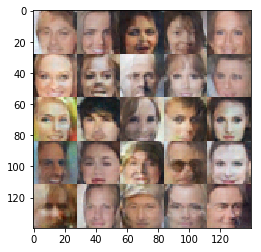

Epoch  5/5 Batch 3050/3166... Discriminator Loss: 0.9891... Generator Loss: 0.9657
Epoch  5/5 Batch 3060/3166... Discriminator Loss: 1.4313... Generator Loss: 1.1409
Epoch  5/5 Batch 3070/3166... Discriminator Loss: 1.1467... Generator Loss: 0.6783
Epoch  5/5 Batch 3080/3166... Discriminator Loss: 1.2411... Generator Loss: 0.8903
Epoch  5/5 Batch 3090/3166... Discriminator Loss: 1.3751... Generator Loss: 0.4228
Epoch  5/5 Batch 3100/3166... Discriminator Loss: 1.5359... Generator Loss: 1.1746
Epoch  5/5 Batch 3110/3166... Discriminator Loss: 1.0141... Generator Loss: 1.1330
Epoch  5/5 Batch 3120/3166... Discriminator Loss: 1.2209... Generator Loss: 0.8348
Epoch  5/5 Batch 3130/3166... Discriminator Loss: 1.1850... Generator Loss: 0.9431
Epoch  5/5 Batch 3140/3166... Discriminator Loss: 1.0821... Generator Loss: 0.6805


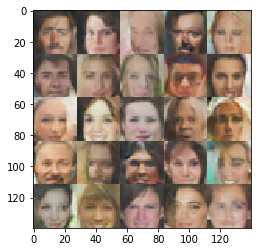

Epoch  5/5 Batch 3150/3166... Discriminator Loss: 1.0037... Generator Loss: 1.2735
Epoch  5/5 Batch 3160/3166... Discriminator Loss: 1.3759... Generator Loss: 0.3938


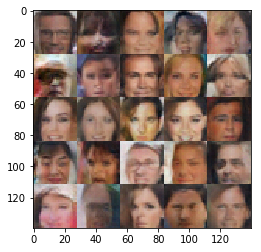

In [228]:
batch_size = 64
z_dim = 200
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。